#### prep

In [78]:
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pmdarima as pm
import seaborn as sns
import sklearn.metrics as metrics
import statsmodels.api as sm
import tensorflow as tf
from evaluate.visualization import radar_plot
from hmmlearn import hmm
from sklearn.metrics import accuracy_score, mean_squared_error
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller

In [79]:
def read_df(data_path):
    # Load the dataset
    df = pd.read_csv(data_path)
    # Create a datetime column
    df['datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])
    # Set datetime as index
    df.set_index("datetime", inplace=True)
    # Sort the data based on the datetime index
    df.sort_index(inplace=True)
    return df


def split_df(df):
    train_start = df.index[0]
    # train_end = pd.Timestamp('2013-12-31')
    test_start = pd.Timestamp('2014-01-01')
    test_end = df.index[-1]

    train_df = df.loc[train_start:test_start].copy()
    test_df = df.loc[test_start:test_end].copy()

    label = 'pm2.5'

    # Handle missing data 
    # moving average
    window_size = 24 * 7 
    train_df.loc[:, f'{label}_ma'] = train_df[label].fillna(train_df[label].rolling(window=window_size, min_periods=1, center=False).mean())
    test_df.loc[:, f'{label}_ma'] = test_df[label].fillna(test_df[label].rolling(window=window_size, min_periods=1, center=False).mean())
    train_df.dropna(inplace=True)
    test_df.dropna(inplace=True)

    return train_df, test_df


def run_hmm(train_df, test_df, model_type, n_states, feat, random_seed=42):
    # Seed for reproducibility
    np.random.seed(random_seed)

    # Prepare the data
    train_data = train_df[[feat]].values 
    test_data = test_df[[feat]].values

    # Define the HMM model
    if model_type=='categorical':
        model = hmm.CategoricalHMM(n_components=n_states, n_iter=10)
    elif model_type=='gaussian':
        model = hmm.GaussianHMM(n_components=n_states, n_iter=10)
    elif model_type=='gaussian-to-binary':
        model = hmm.GaussianHMM(n_components=n_states, n_iter=10)

    # Record model time
    start_time_hmm = time.time()    
    
    # Train the HMM model
    model.fit(train_data)

    # Predict the test data values
    predictions = model.sample(len(test_data))[0]
    #print("type ",type(train_data))
    #print("shape ",train_data.shape)
    #print("len test ", len(test_data))
    #lengths = np.array([train_data.shape[0]] * train_data.shape[1])
    #lengths = np.full(len(test_data), train_data.shape[0])
    #predictions = model.predict(train_data,lengths=lengths)
    #predictions = model.predict(test_data, #lengths=8661
                #)
    end_time_hmm = time.time()
    execution_time = end_time_hmm - start_time_hmm


    # Add the predicted values to the test dataframe
    if model_type=='categorical':
        rounded_prediction = [1 if pred > 0.003 else 0 for pred in predictions]
        rounded_prediction2 = [0.75 if pred == 1 else 0 for pred in rounded_prediction]
        test_df[f'predicted_{feat}'] = rounded_prediction2
    elif model_type=='gaussian':
        test_df[f'predicted_{feat}'] = predictions
    elif model_type=='gaussian-to-binary':
        # Apply rounding logic to prediction_lstm
        rounded_prediction = [1 if pred > 0.003 else 0 for pred in predictions]
        rounded_prediction2 = [0.75 if pred == 1 else 0 for pred in rounded_prediction]
        feat = 'rain' # Change to binary feature
        test_df[f'predicted_{feat}'] = rounded_prediction2
    
    if model_type=='categorical':
        print(f'Test accuracy: {accuracy_score(test_data, predictions)}')
    elif model_type=='gaussian':
        print(f'Test MSE: {mean_squared_error(test_data, predictions)}')
    elif model_type=='gaussian-to-binary':
        test_data = test_df[[feat]].values
        print(f'Test accuracy: {accuracy_score(test_data, rounded_prediction)}')

    # Plot the actual and predicted values
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=test_df, x=test_df.index, y=feat, label=f'Actual {feat}', alpha=0.7)
    sns.lineplot(data=test_df, x=test_df.index, y=f'predicted_{feat}', label=f'Predicted {feat}', alpha=0.7)
    plt.xlabel('Date')
    plt.ylabel(feat)
    plt.title(f'Actual vs Predicted {feat}')
    plt.legend()
    plt.show()

    if model_type=='categorical':
        evaluation_dict = {}

        # Calculate accuracy
        lstm_accuracy = np.mean(rounded_prediction == test_df[{feat}].values)
        evaluation_dict['Accuracy'] = lstm_accuracy

        # Calculate precision, recall, and F1 score
        precision = metrics.precision_score(test_data, rounded_prediction)
        recall = metrics.recall_score(test_data, rounded_prediction)
        f1_score = metrics.f1_score(test_data, rounded_prediction)

        evaluation_dict['Precision'] = precision
        evaluation_dict['Recall'] = recall
        evaluation_dict['F1 Score'] = f1_score

        # Print the evaluation dictionary
        print("Evaluation Metrics:")
        for metric, value in evaluation_dict.items():
            print(f"{metric}: {value}")
        return accuracy_score(test_data, rounded_prediction), execution_time,evaluation_dict
    elif model_type=='gaussian':
        evaluation_dict = {}

        # Calculate Mean Squared Error (MSE)
        mse = metrics.mean_squared_error(test_data, predictions)
        evaluation_dict['MSE'] = mse

        # Calculate Root Mean Squared Error (RMSE)
        rmse = np.sqrt(mse)
        evaluation_dict['RMSE'] = rmse

        # Calculate Mean Absolute Error (MAE)
        mae = metrics.mean_absolute_error(test_data, predictions)
        evaluation_dict['MAE'] = mae

        # Calculate R-squared (R^2) score
        r2_score = metrics.r2_score(test_data, predictions)
        evaluation_dict['R-squared'] = r2_score

        # Print the evaluation dictionary
        print("Evaluation Metrics:")
        for metric, value in evaluation_dict.items():
            print(f"{metric}: {value}")
        return mean_squared_error(test_data, predictions), execution_time,evaluation_dict
    elif model_type=='gaussian-to-binary':
        evaluation_dict = {}

        # Calculate accuracy
        lstm_accuracy = np.mean(rounded_prediction == test_df[6:][{feat}].values)
        evaluation_dict['Accuracy'] = lstm_accuracy

        # Calculate precision, recall, and F1 score
        precision = metrics.precision_score(test_data, rounded_prediction)
        recall = metrics.recall_score(test_data, rounded_prediction)
        f1_score = metrics.f1_score(test_data, rounded_prediction)

        evaluation_dict['Precision'] = precision
        evaluation_dict['Recall'] = recall
        evaluation_dict['F1 Score'] = f1_score

        # Print the evaluation dictionary
        print("Evaluation Metrics:")
        for metric, value in evaluation_dict.items():
            print(f"{metric}: {value}")
        return accuracy_score(test_data, rounded_prediction), execution_time,evaluation_dict, predictions

In [80]:
import numpy as np
import tensorflow as tf

class WindowGenerator:
    def __init__(
        self, lookback, lookahead, batch_size, train_df, test_df, label_column=None
    ):
        # Your code here
        # Store the raw data.
        self.train_df = train_df
        #self.val_df = val_df
        self.test_df = test_df
        self.batch_size = batch_size

        # Work out the label column indices.
        self.label_columns = label_column
        if label_column is not None:
            try:
                self.label_columns_indices = {name: i for i, name in
                                            enumerate(label_column)}
            except: AttributeError
            pass
        else:
            try:
                self.column_indices = {name: i for i, name in
                            enumerate(train_df.columns)}
            except: AttributeError
            pass

        # Work out the window parameters.
        self.input_width = lookback # input_width
        self.label_width = 1 # label_width
        self.shift = 1 # shift

        self.total_window_size = self.input_width + self.shift

        self.input_slice = slice(0, lookback)
        self.lookback_idx = np.arange(self.total_window_size)[self.input_slice]

        self.label_start = self.total_window_size - self.label_width
        self.labels_slice = slice(self.label_start, None)
        self.label_idx = np.arange(self.total_window_size)[self.labels_slice]


    def __repr__(self):
        return "\n".join(
            [
                f"Total window size: {self.total_window_size}",
                f"Lookback indices: {self.lookback_idx}",
                f"Label index: {self.label_idx}",
                f"Label name: {self.label_columns}",
            ]
        )


    @property
    def train(self):
        return self.make_dataset(self.train_df)

    @property
    def test(self):
        return self.make_dataset(self.test_df)

    def make_dataset(self, data):
        data = np.array(data, dtype=np.float32)
        ds = tf.keras.utils.timeseries_dataset_from_array(
            data=data,
            targets=None,
            sequence_length=self.total_window_size,
            sequence_stride=1,
            shuffle=False,
            batch_size=self.batch_size,)

        ds = ds.map(self.split_window)
        
        return ds

    """def split_window(self, features):
        # Your code here
        inputs = features[:, self.input_slice, :]
        labels = features[:, self.labels_slice, :]
        if self.label_columns is not None:
            labels = tf.stack(
                [labels[:, :, self.column_indices[name]] for name in self.label_columns],
                axis=-1)

        # Slicing doesn't preserve static shape information, so set the shapes
        # manually. This way the `tf.data.Datasets` are easier to inspect.
        inputs.set_shape([None, self.input_width, None])
        labels.set_shape([None, self.label_width, None])

        return inputs, labels
        """ # Removed because it does not cater to single column
    
    def split_window(self, features):
        # Extract the input and label slices
        inputs = features[:, self.input_slice]
        labels = features[:, self.labels_slice]

        # Reshape the inputs and labels
        inputs = tf.expand_dims(inputs, axis=-1)
        labels = tf.expand_dims(labels, axis=-1)

        # Set the shapes manually
        inputs.set_shape([None, self.input_width, 1])
        labels.set_shape([None, self.label_width, 1])

        return inputs, labels

In [81]:
# LSTM

import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense

class LSTMModel:
    def __init__(self, input_shape):
        self.model = Sequential([
            LSTM(32, input_shape=input_shape),
            Dense(1)
        ])

    def compile_and_fit(self, train_data, epochs):
        self.model.compile(optimizer='adam', loss=['mean_squared_error'], metrics=['mae'])
        self.model.fit(train_data, epochs=epochs,)

    def evaluate(self, test_data, verbose=0):
        results = self.model.evaluate(
            test_data,
            verbose=verbose
            )
        print(results)
        #mse = results[0]
        #mae = results[1]
        return results

    def predict(self, data):
        return self.model.predict(data)

In [112]:
import tensorflow as tf
from keras.models import Model
from keras.optimizers import Adam

class CNNModel:
    def __init__(self, input_shape, conv_width=3, num_filters=32):
        self.conv_model = tf.keras.Sequential([
            tf.keras.layers.Conv1D(
                                filters=num_filters,
                                kernel_size=(conv_width,),
                                #activation='relu', 
                                input_shape=input_shape[1:]
                                ),
            #tf.keras.layers.Dense(units=32, activation='relu'),
            tf.keras.layers.Dense(units=1),
            ])
        


    def fit(self, train_data, epochs):
        # Compile the model
        learning_rate = 0.001
        self.conv_model.compile(optimizer=Adam(
            learning_rate=learning_rate), 
            loss='mean_squared_error', 
            metrics=['mean_absolute_error']
            )
        self.conv_model.fit(train_data,
                    epochs=epochs, 
                    steps_per_epoch=len(train_data)
                    )

    def evaluate(self, eval_data, verbose=0):
        # Your code here
        results = self.conv_model.evaluate(
            eval_data, 
            verbose=verbose
            )
        mse = results[0]
        mae = results[1]
        return mse, mae

    def predict(self, pred_data):
        # Your code here
        return self.conv_model.predict(pred_data)

Use [Beijing PM2.5 Data](https://archive.ics.uci.edu/dataset/381/beijing+pm2+5+data)

In [83]:
# Load the dataset
data_path = 'data/raw/data.csv'
df = read_df(data_path)
train_df, test_df = split_df(df)

In [84]:
train_df['rain'] = train_df['Ir']>0
test_df['rain'] = test_df['Ir']>0
train_df['rain'] = train_df['rain'].astype(int)
test_df['rain'] = test_df['rain'].astype(int)

In [85]:
train_df['log_pm2.5'] = np.where(train_df['pm2.5_ma'] == 0, 0, np.log(train_df['pm2.5_ma']))
test_df['log_pm2.5'] = np.where(test_df['pm2.5_ma'] == 0, 0, np.log(test_df['pm2.5_ma']))

/Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [86]:
rain_metrics_list = {}
pm25ma_metrics_list = {}
logpm25_metrics_list = {}

#### plot data

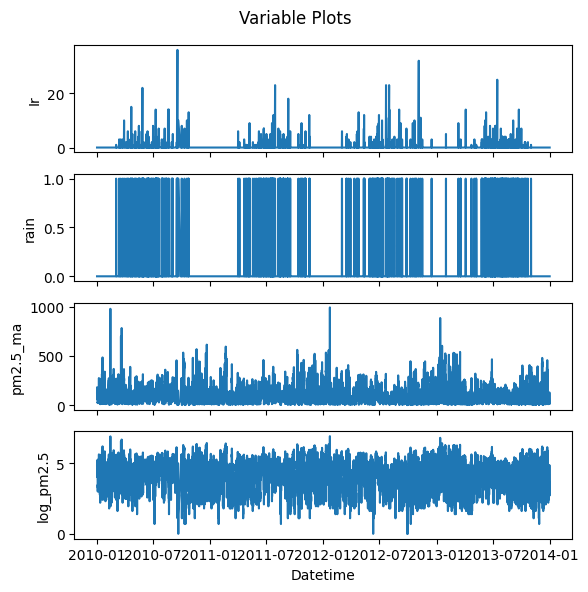

In [87]:
import matplotlib.pyplot as plt

# Set the datetime index as the x-axis
x = train_df.index

# Get the variables as separate y-axis values
y1 = train_df['Ir']
y2 = train_df['rain']
y3 = train_df['pm2.5_ma']
y4 = train_df['log_pm2.5']

# Create subplots for each variable
fig, axes = plt.subplots(4, 1, figsize=(6, 6), sharex=True)

# Plot each variable on its respective subplot
axes[0].plot(x, y1)
axes[0].set_ylabel('Ir')
axes[1].plot(x, y2)
axes[1].set_ylabel('rain')
axes[2].plot(x, y3)
axes[2].set_ylabel('pm2.5_ma')
axes[3].plot(x, y4)
axes[3].set_ylabel('log_pm2.5')

# Set the x-axis label and title
axes[-1].set_xlabel('Datetime')
plt.suptitle('Variable Plots')

# Adjust the layout and spacing
plt.tight_layout()

# Display the plots
plt.show()


`Categorical Data (Binary Classification): 'rain'`<br>
#### 1. Hidden Markov Model

###### Iterate from 1 to 30 hidden states(hidden)

1
Test MSE: 3.3828300023338445


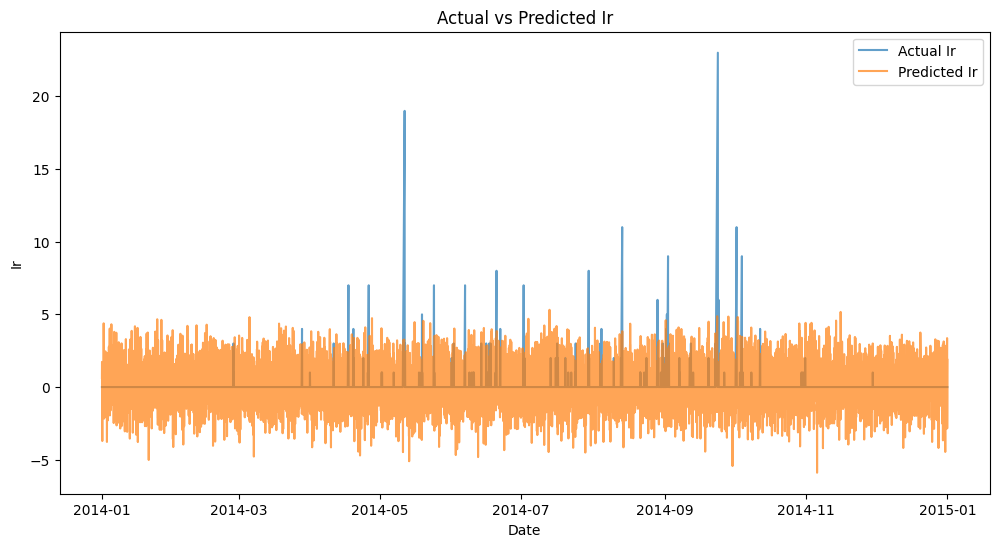

Evaluation Metrics:
MSE: 3.3828300023338445
RMSE: 1.839247129217236
MAE: 1.3179442457527069
R-squared: -2.159966902026248
2
Test MSE: 3.4325497017191737


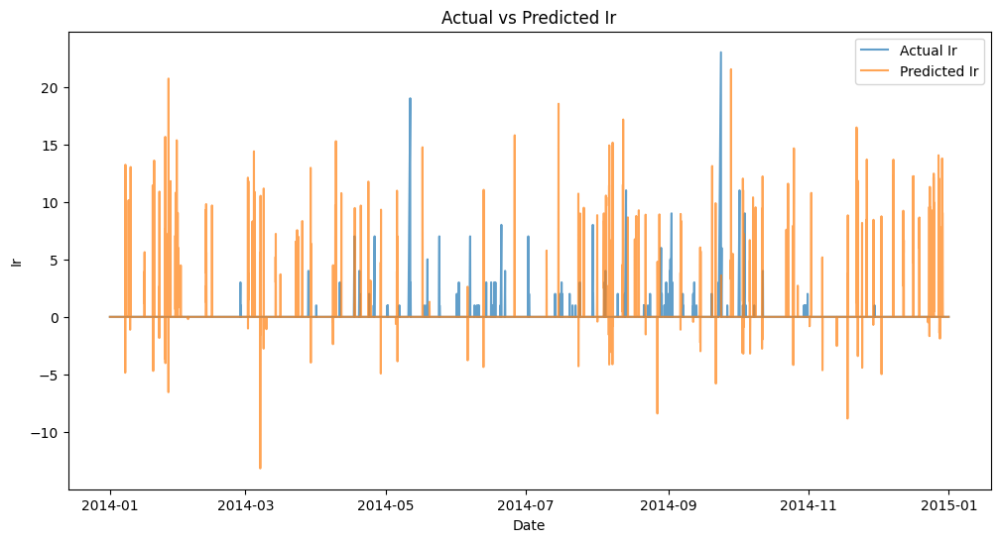

Evaluation Metrics:
MSE: 3.4325497017191737
RMSE: 1.8527141446319164
MAE: 0.3943087330517352
R-squared: -2.206411034402969
3
Test MSE: 3.3119408601591904


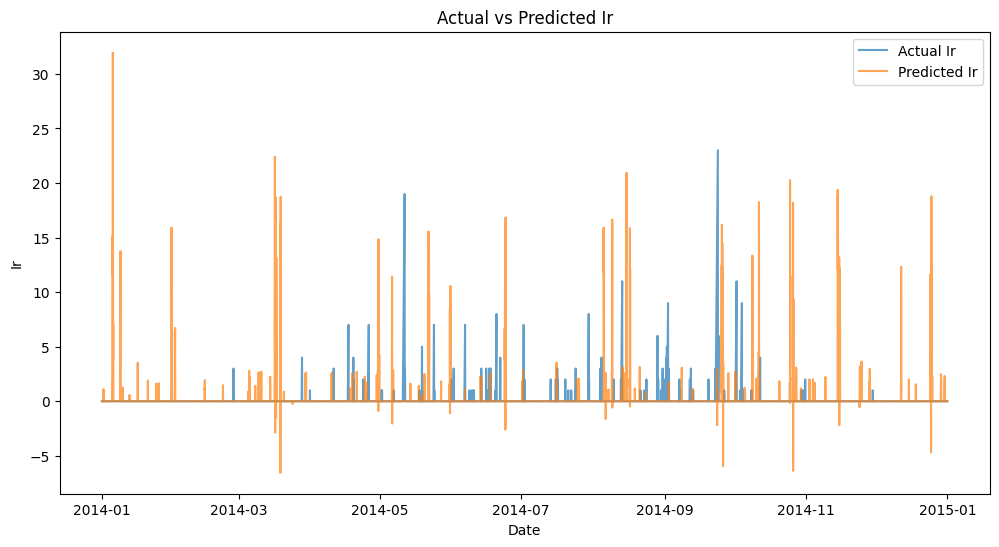

Evaluation Metrics:
MSE: 3.3119408601591904
RMSE: 1.819873858309743
MAE: 0.33975821312765964
R-squared: -2.0937479838924977
4
Test MSE: 1.721501712305439


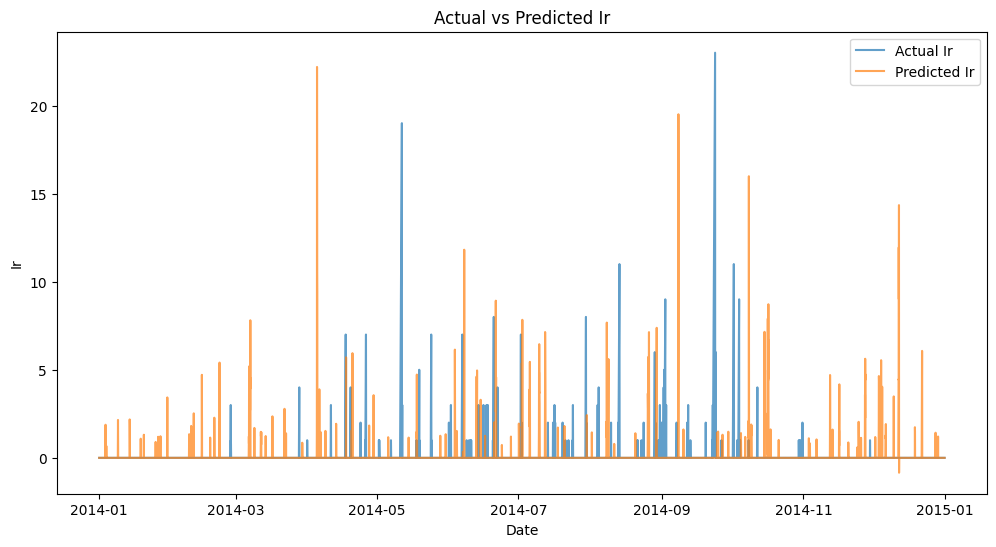

Evaluation Metrics:
MSE: 1.721501712305439
RMSE: 1.3120601023983005
MAE: 0.23733615126607854
R-squared: -0.6080880295237041
5
Test MSE: 2.2231113903150295


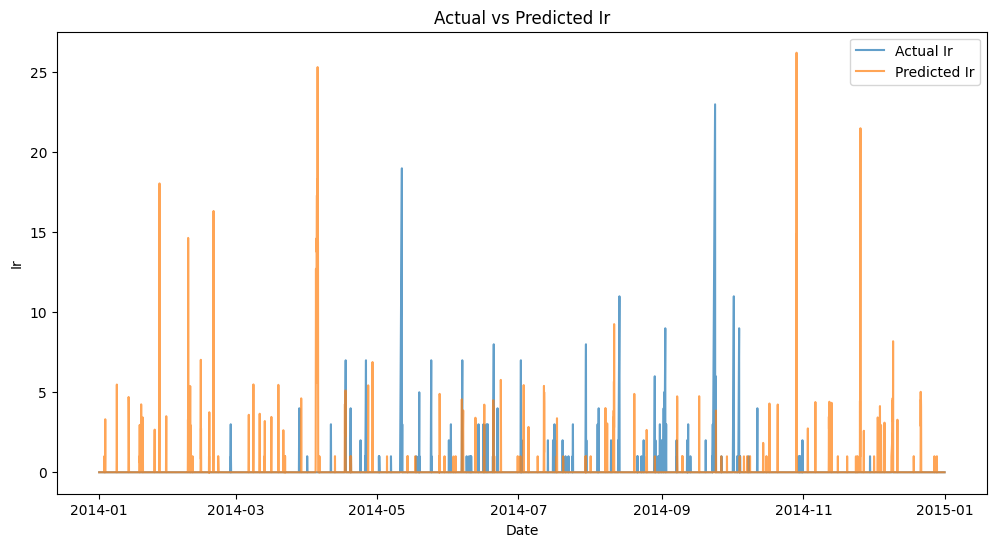

Evaluation Metrics:
MSE: 2.2231113903150295
RMSE: 1.4910101912176956
MAE: 0.2603905093758744
R-squared: -1.0766513268672884
6
Test MSE: 4.917347208336296


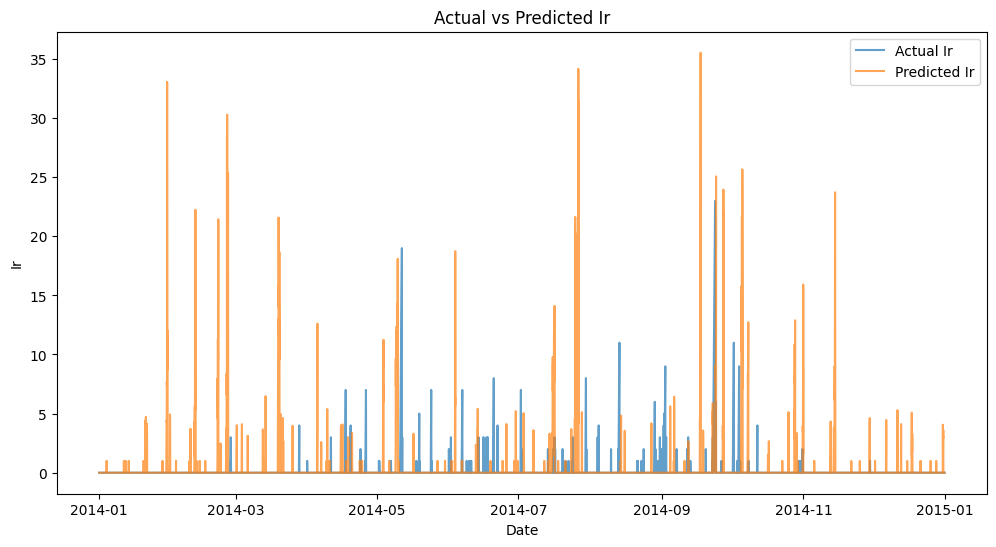

Evaluation Metrics:
MSE: 4.917347208336296
RMSE: 2.217509235231343
MAE: 0.4439849752849932
R-squared: -3.5933890894291496
7
Test MSE: 4.343561516584454


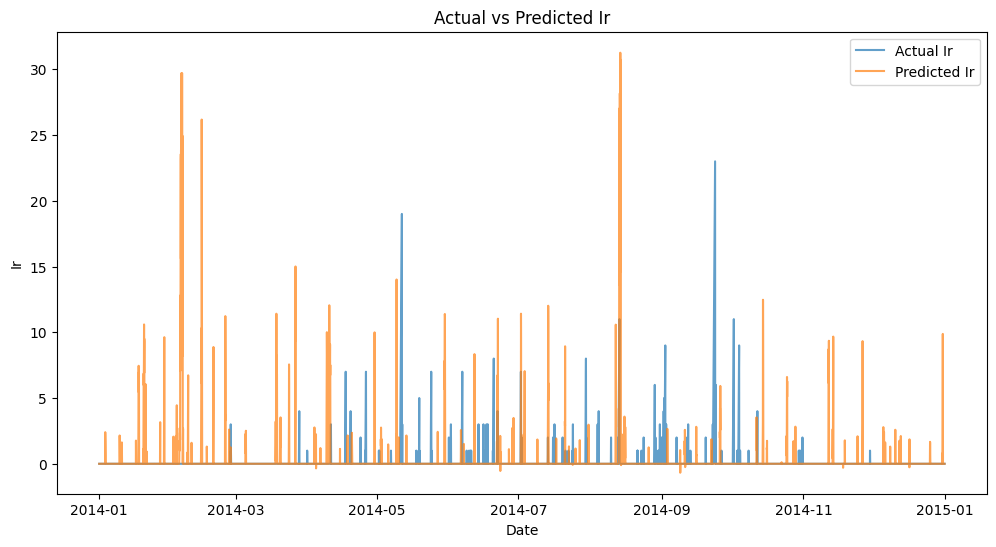

Evaluation Metrics:
MSE: 4.343561516584454
RMSE: 2.0841212816399275
MAE: 0.3915624221471585
R-squared: -3.05740478234273
8
Test MSE: 3.0646624530591824


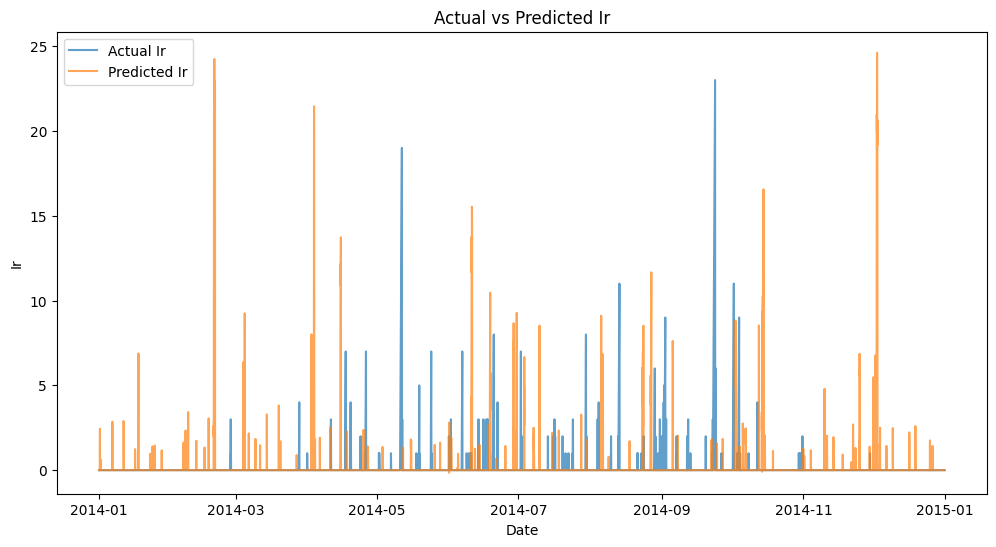

Evaluation Metrics:
MSE: 3.0646624530591824
RMSE: 1.7506177347037195
MAE: 0.31579399699237354
R-squared: -1.8627604434359246
9
Test MSE: 2.741145582289957


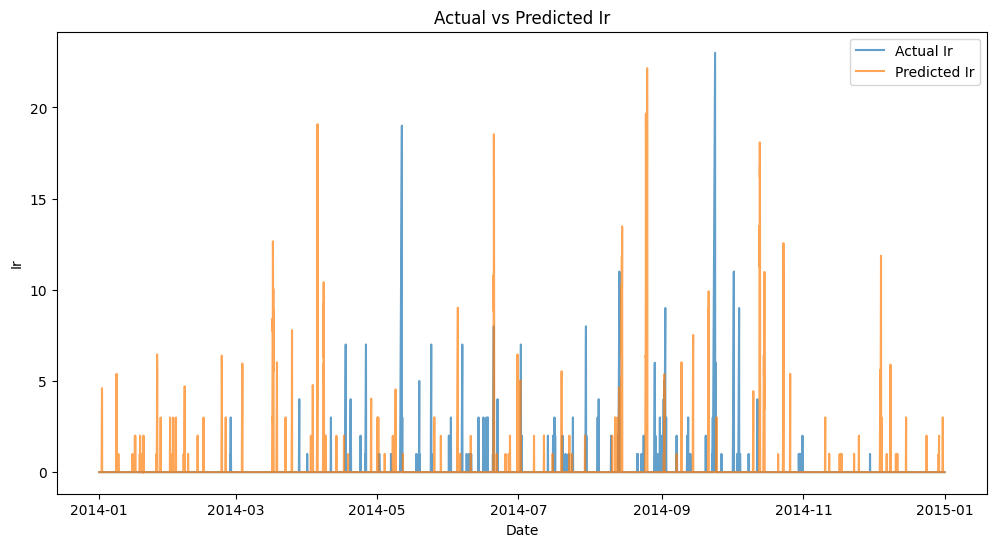

Evaluation Metrics:
MSE: 2.741145582289957
RMSE: 1.6556405353487686
MAE: 0.3145209879478042
R-squared: -1.5605570802244833
10
Test MSE: 2.1198286120614758


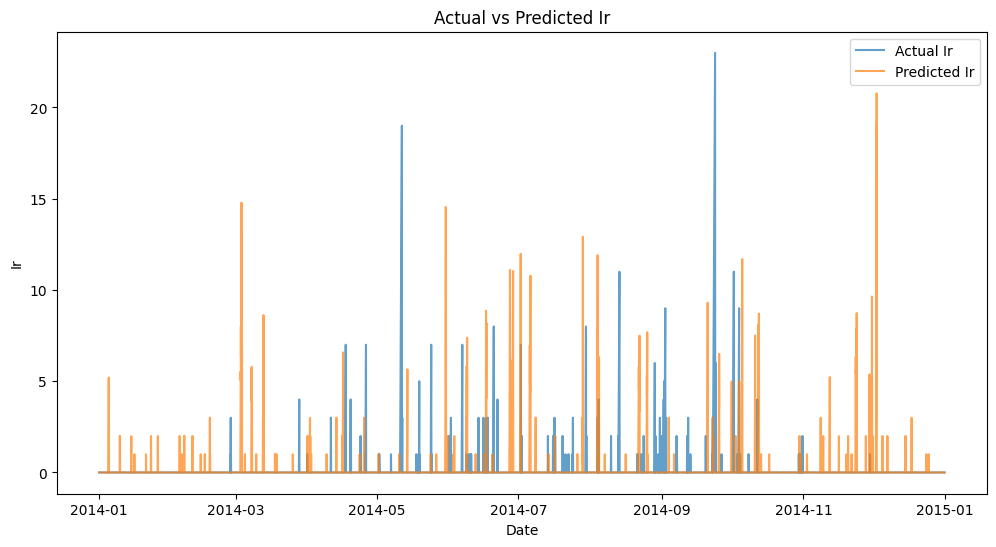

Evaluation Metrics:
MSE: 2.1198286120614758
RMSE: 1.4559631218068252
MAE: 0.2794865798632616
R-squared: -0.9801728870386888
11
Test MSE: 3.361486073314511


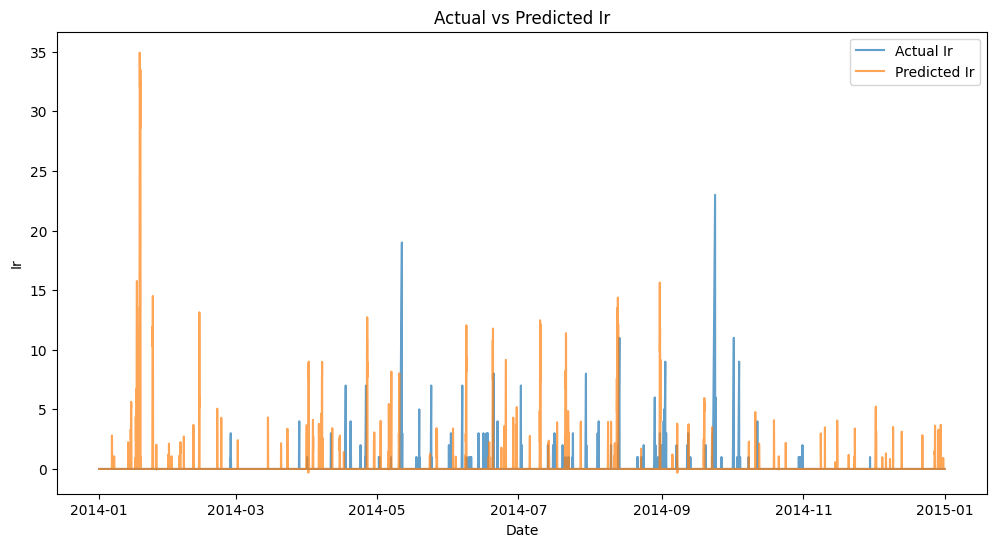

Evaluation Metrics:
MSE: 3.361486073314511
RMSE: 1.8334355929005282
MAE: 0.3395731392644218
R-squared: -2.1400291253086006
12
Test MSE: 4.245136216265012


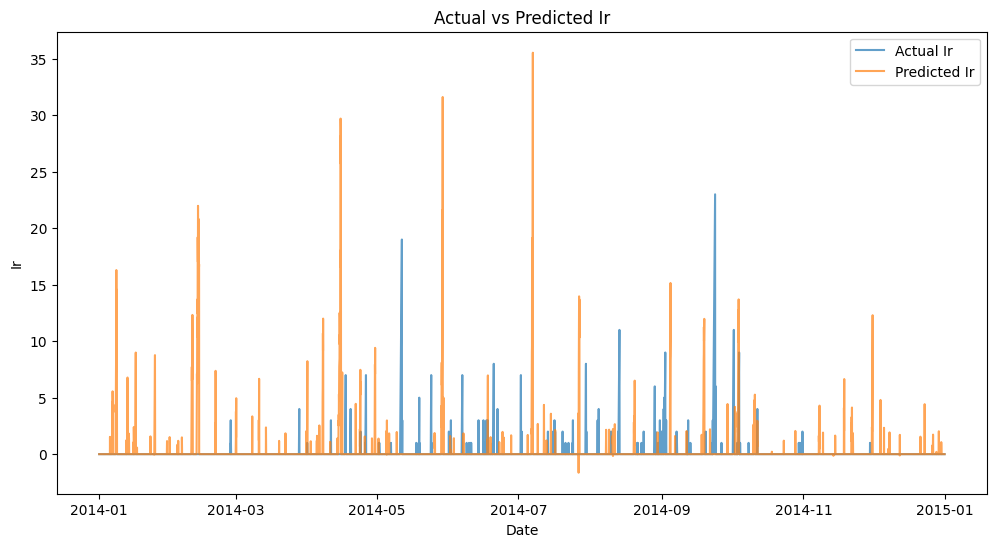

Evaluation Metrics:
MSE: 4.245136216265012
RMSE: 2.060372834286312
MAE: 0.401695924015069
R-squared: -2.9654638065571137
13
Test MSE: 3.484839509662808


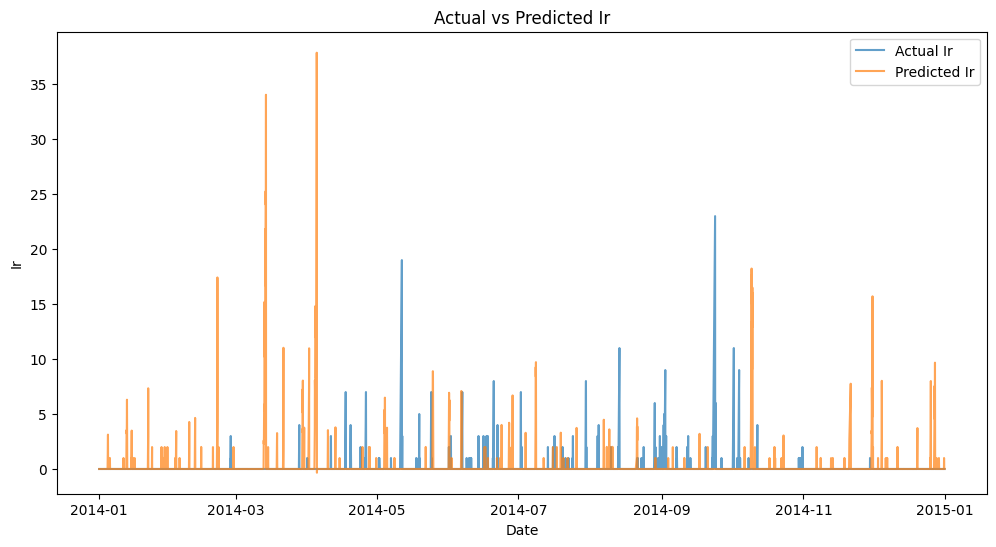

Evaluation Metrics:
MSE: 3.484839509662808
RMSE: 1.8667724847079807
MAE: 0.3385812080339204
R-squared: -2.255255954869323
14
Test MSE: 5.57892637556699


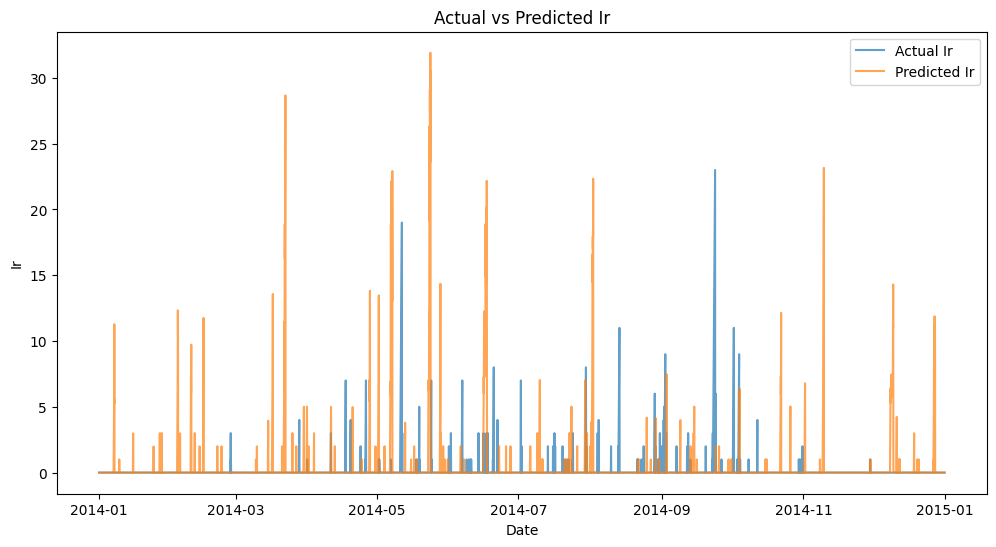

Evaluation Metrics:
MSE: 5.57892637556699
RMSE: 2.3619751005391634
MAE: 0.4718038702111503
R-squared: -4.211382979183225
15
Test MSE: 3.492472664834866


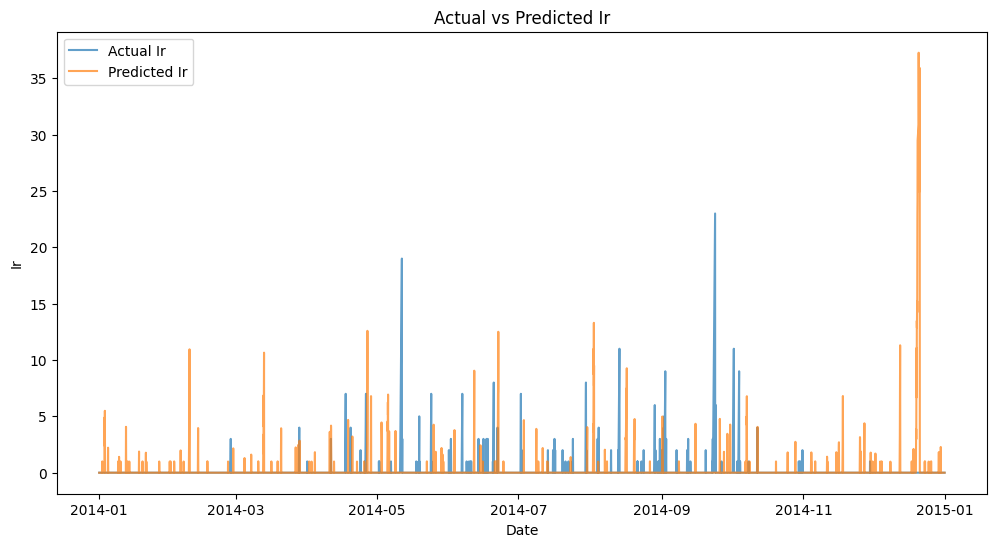

Evaluation Metrics:
MSE: 3.492472664834866
RMSE: 1.8688158456185207
MAE: 0.310106494328395
R-squared: -2.2623862326796456
16
Test MSE: 4.834836458571745


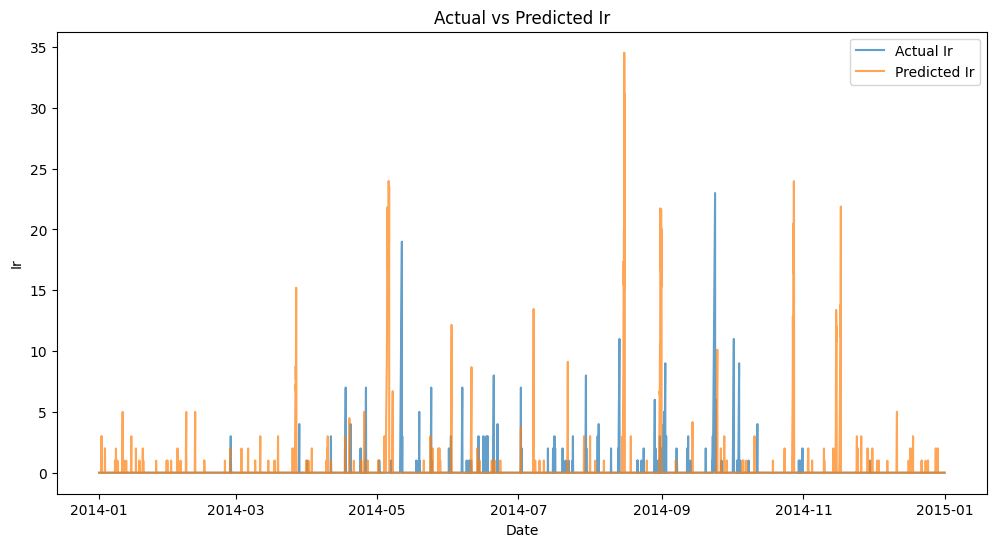

Evaluation Metrics:
MSE: 4.834836458571745
RMSE: 2.198826154695215
MAE: 0.39998001182839726
R-squared: -3.5163142029768384
17
Test MSE: 4.005152001530865


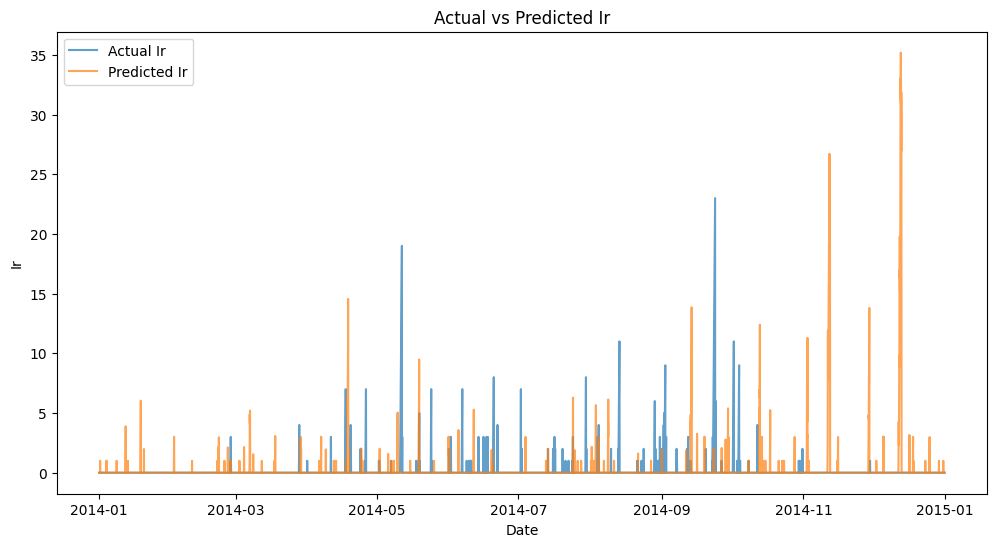

Evaluation Metrics:
MSE: 4.005152001530865
RMSE: 2.001287585913345
MAE: 0.32928084354281273
R-squared: -2.741289912200769
18
Test MSE: 2.626206520527582


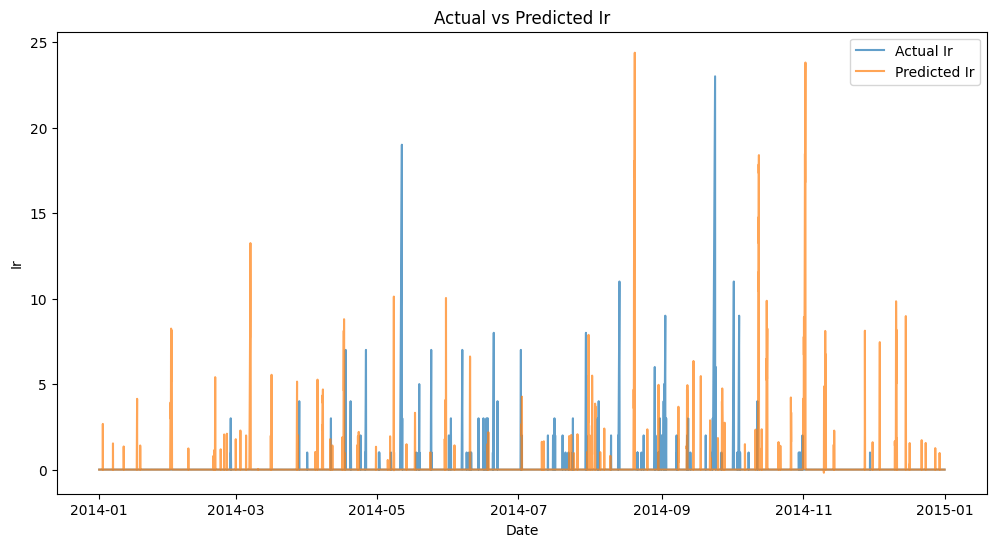

Evaluation Metrics:
MSE: 2.626206520527582
RMSE: 1.620557472145799
MAE: 0.3014952152833952
R-squared: -1.4531902806311026
19
Test MSE: 6.132136728283468


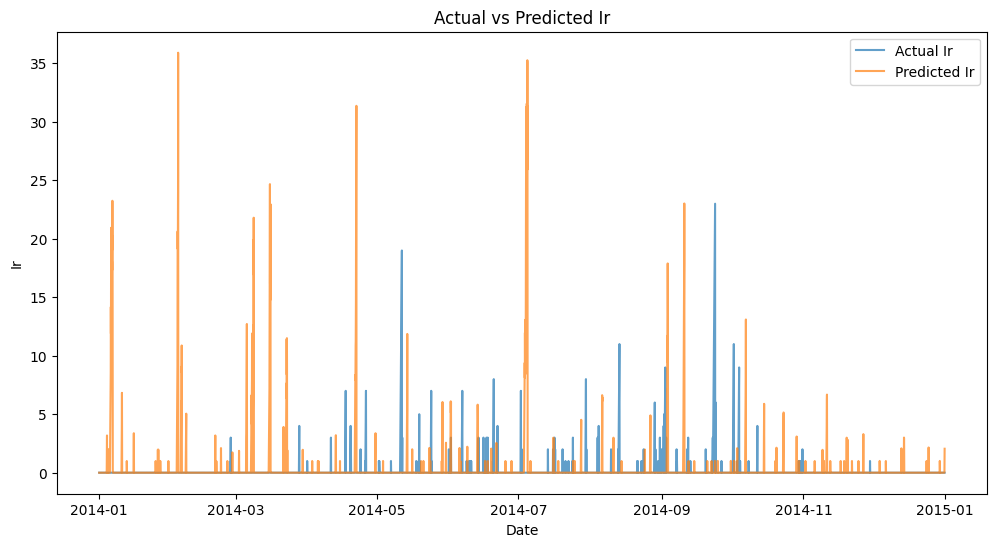

Evaluation Metrics:
MSE: 6.132136728283468
RMSE: 2.47631515124458
MAE: 0.463862940358098
R-squared: -4.728147464314399
20
Test MSE: 3.6004597665568197


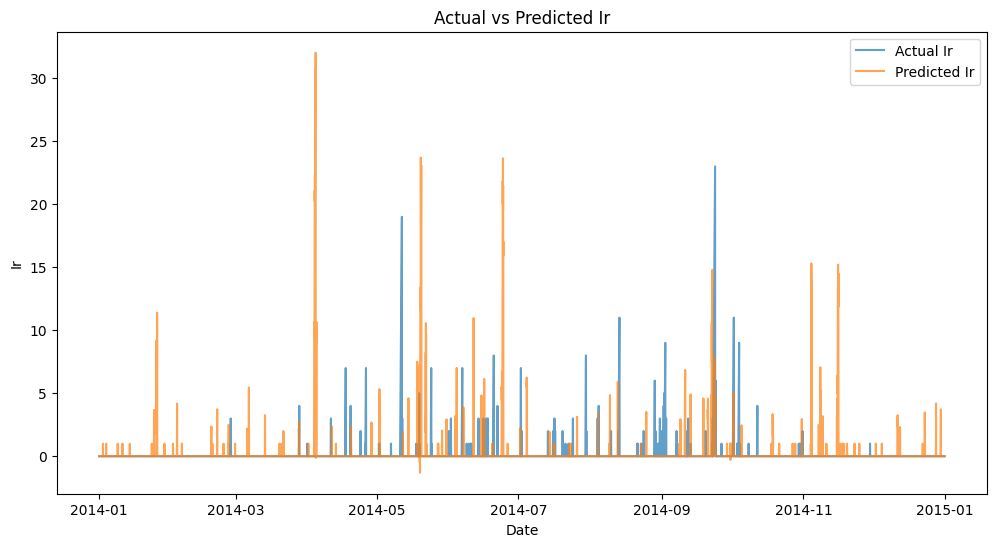

Evaluation Metrics:
MSE: 3.6004597665568197
RMSE: 1.897487751358838
MAE: 0.33273474248149626
R-squared: -2.363259072004026
21
Test MSE: 2.8531648376213203


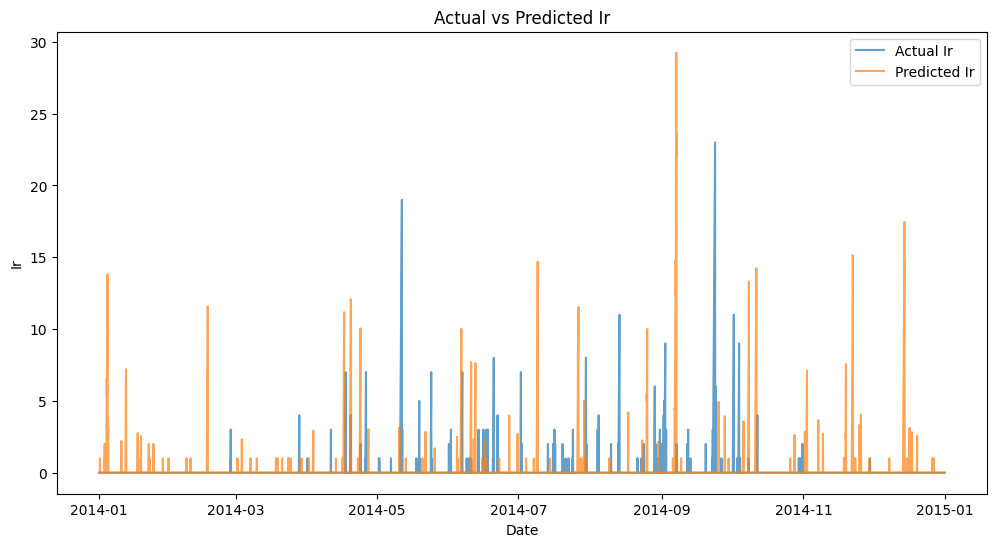

Evaluation Metrics:
MSE: 2.8531648376213203
RMSE: 1.689131385541492
MAE: 0.3251837303353646
R-squared: -1.6651964321849793
22
Test MSE: 7.495497661259467


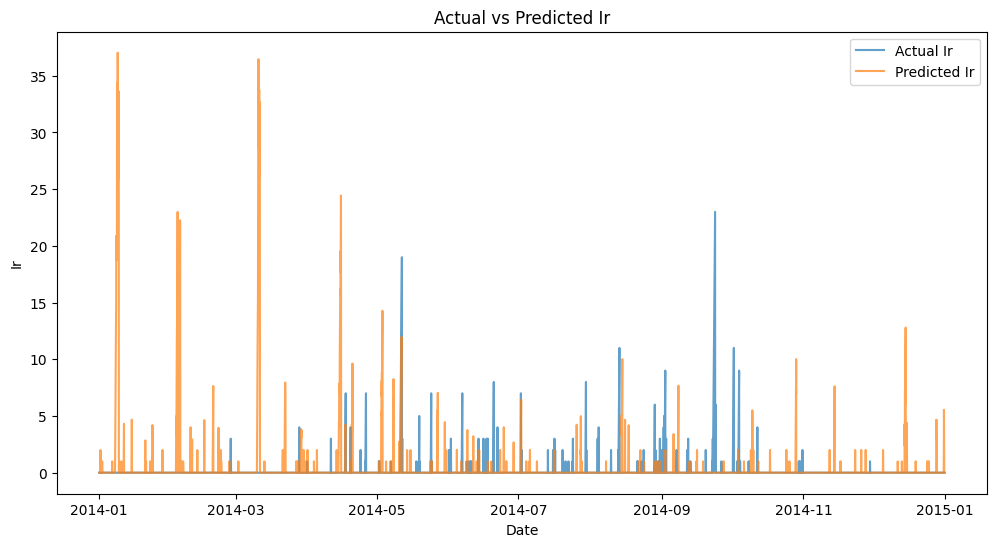

Evaluation Metrics:
MSE: 7.495497661259467
RMSE: 2.7377906532931746
MAE: 0.48915753959046165
R-squared: -6.001689268291405
23
Test MSE: 4.041639100519225


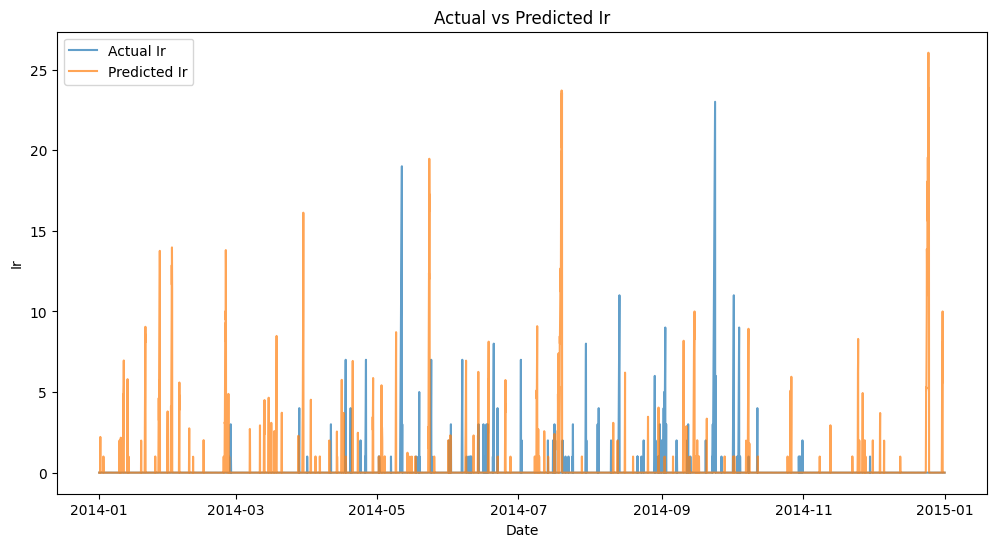

Evaluation Metrics:
MSE: 4.041639100519225
RMSE: 2.010382824369335
MAE: 0.4173742983211063
R-squared: -2.775373216734141
24
Test MSE: 1.755292459852947


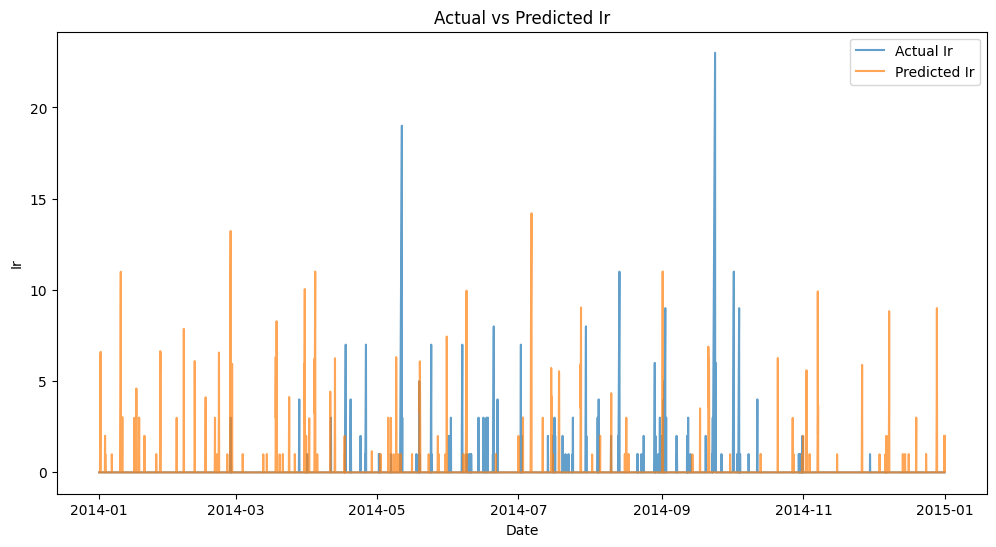

Evaluation Metrics:
MSE: 1.755292459852947
RMSE: 1.3248745072092476
MAE: 0.2483135771374634
R-squared: -0.6396526200503292
25
Test MSE: 2.0237780514239025


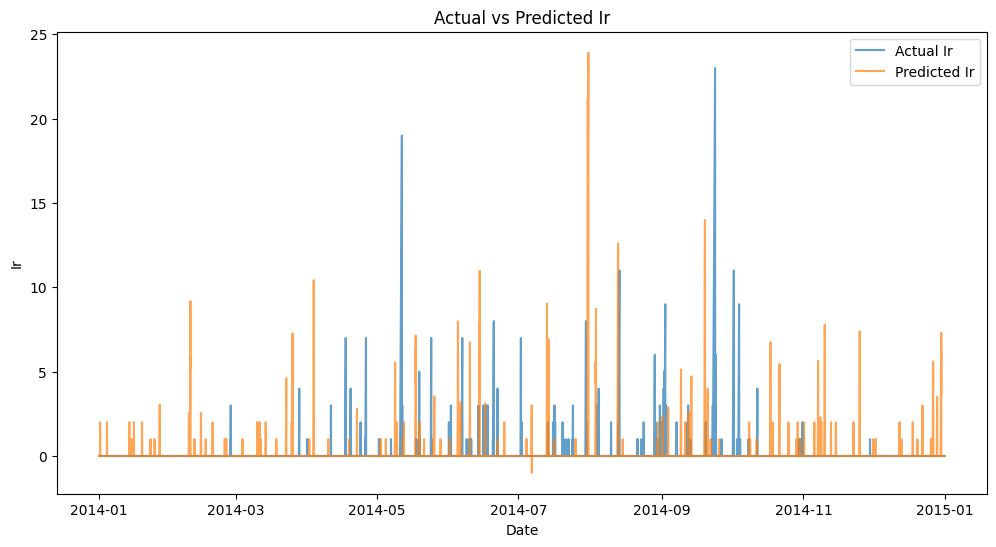

Evaluation Metrics:
MSE: 2.0237780514239025
RMSE: 1.4225955333206632
MAE: 0.24741079960874737
R-squared: -0.890450201498358
26
Test MSE: 4.106638859582979


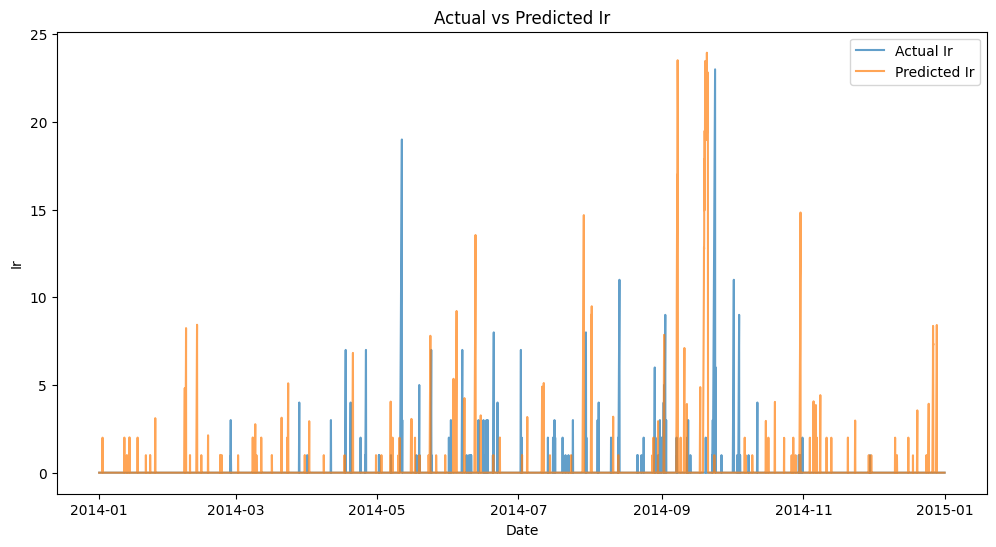

Evaluation Metrics:
MSE: 4.106638859582979
RMSE: 2.026484359570283
MAE: 0.3697036696283555
R-squared: -2.8360907482504865
27
Test MSE: 1.830037926412535


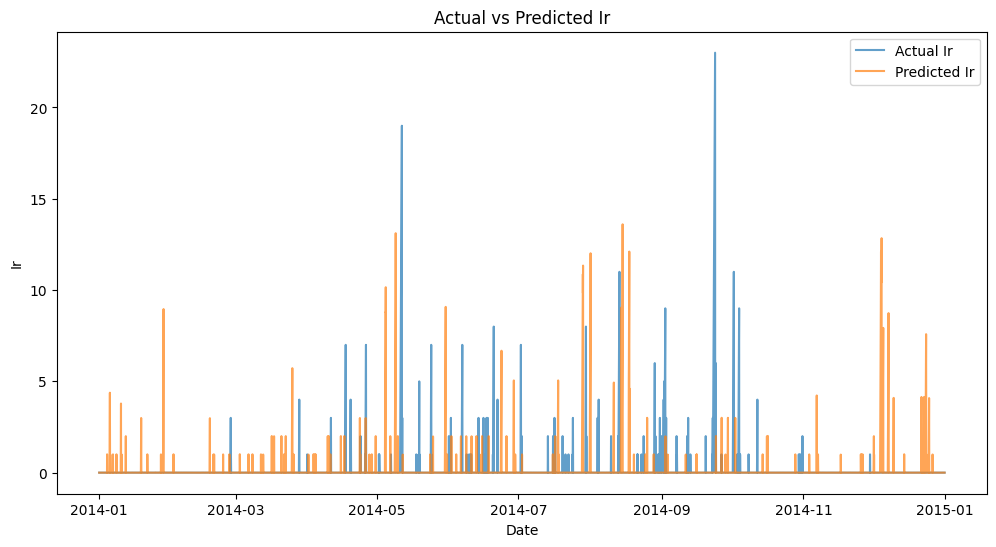

Evaluation Metrics:
MSE: 1.830037926412535
RMSE: 1.3527889437796774
MAE: 0.2553894031470539
R-squared: -0.7094738053424829
28
Test MSE: 2.2255782623669265


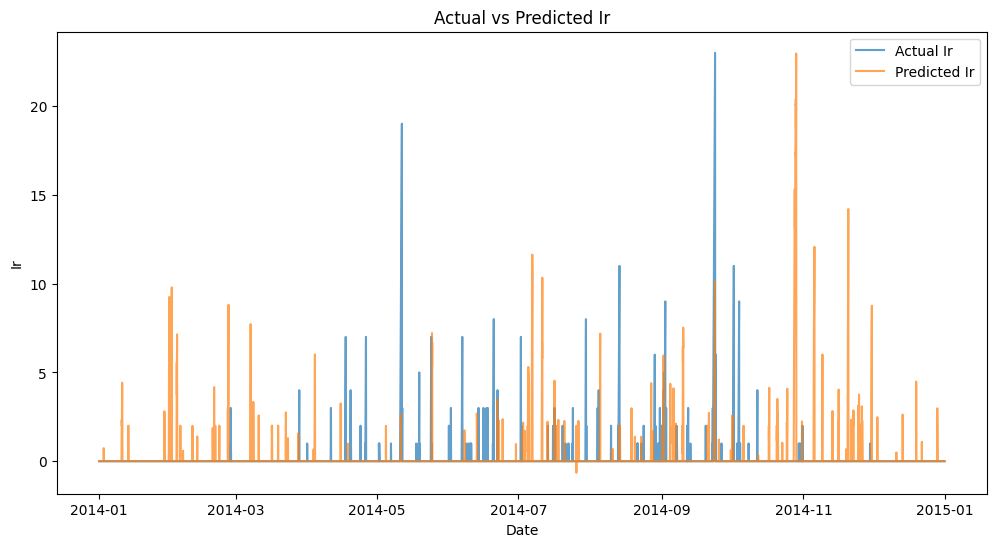

Evaluation Metrics:
MSE: 2.2255782623669265
RMSE: 1.4918372104110176
MAE: 0.2837775702556471
R-squared: -1.0789556797405186
29
Test MSE: 6.46422039761277


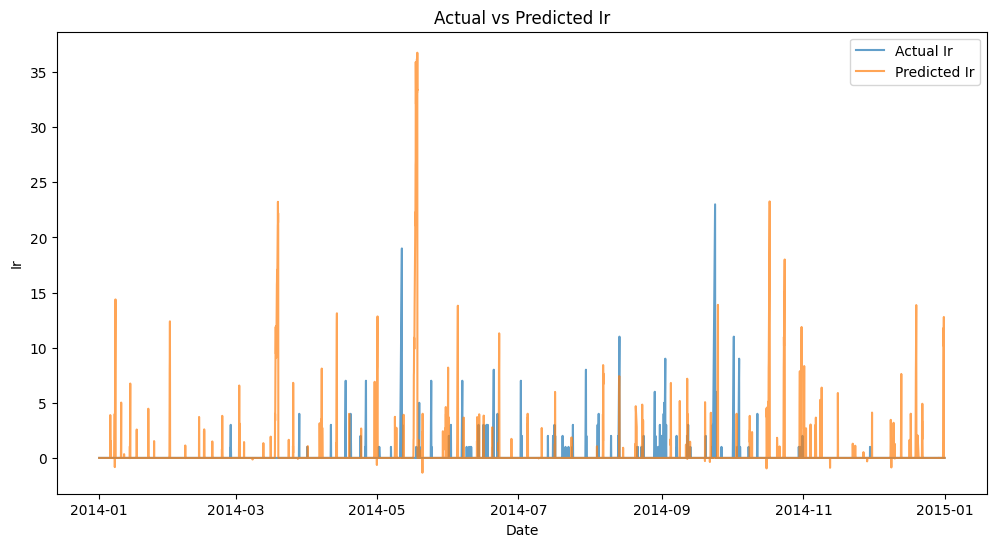

Evaluation Metrics:
MSE: 6.46422039761277
RMSE: 2.5424831164852937
MAE: 0.47594139436435245
R-squared: -5.038353239674099
Minimum MSE: 1.721501712305439
Corresponding No. of Hidden States: 4


In [88]:
compiled_results=[]
for i in range(1,30):
    print(i)
    result, execution_time_hmm, scores_hmm = run_hmm(train_df, test_df, model_type='gaussian', n_states=i, feat='Ir')
    compiled_results.append(result)

min_mse = min(compiled_results)
min_n_states = compiled_results.index(min_mse) + 1
print("Minimum MSE:", min_mse)
print("Corresponding No. of Hidden States:", min_n_states)


##### Best Hidden Markov

Minimum MSE: 1.7215017122181353<br>
Corresponding No. of Hidden States: 4

Test MSE: 1.721501712305439


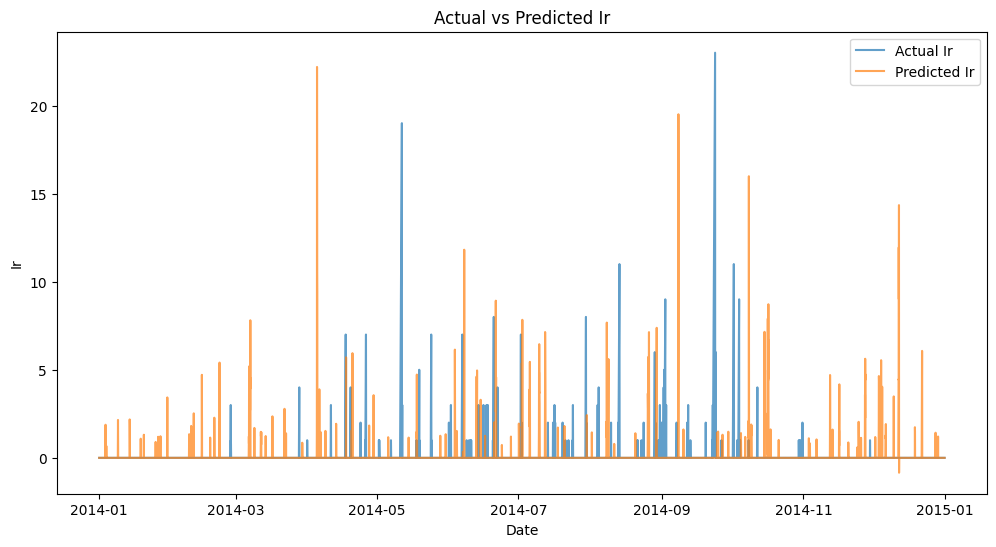

Evaluation Metrics:
MSE: 1.721501712305439
RMSE: 1.3120601023983005
MAE: 0.23733615126607854
R-squared: -0.6080880295237041


In [89]:
result, execution_time_hmm, scores_hmm = run_hmm(train_df, test_df, model_type='gaussian', n_states=min_n_states, feat='Ir')

Test accuracy: 0.9331485971596813


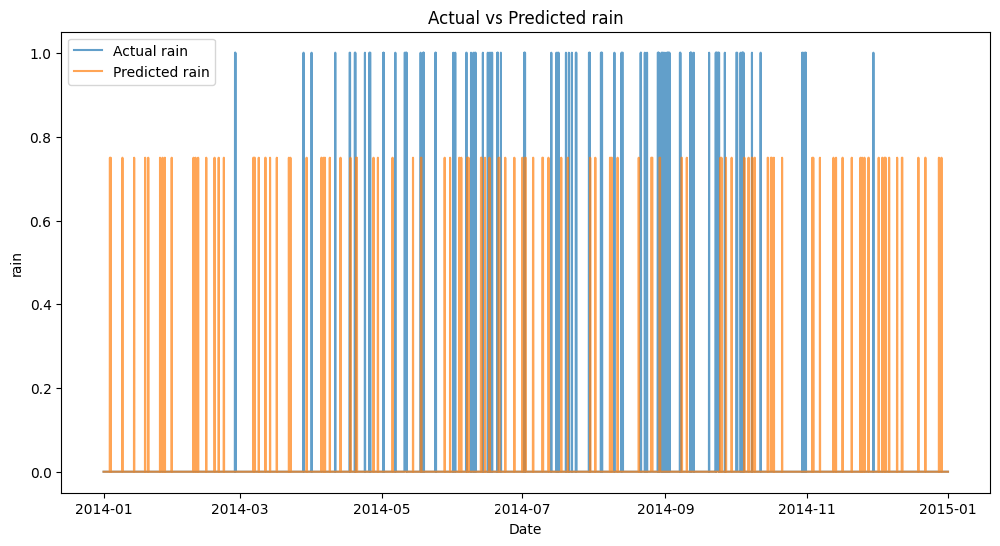

Evaluation Metrics:
Accuracy: 0.9347150659966912
Precision: 0.010135135135135136
Recall: 0.010380622837370242
F1 Score: 0.010256410256410256


/var/folders/6r/1v1tf3dj3px039zpr_gxnls40000gn/T/ipykernel_1278/426035127.py:152: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  lstm_accuracy = np.mean(rounded_prediction == test_df[6:][{feat}].values)


In [90]:
result, execution_time_hmm, scores_hmm, predictions = run_hmm(train_df, test_df, model_type='gaussian-to-binary', n_states=min_n_states, feat='Ir')

In [91]:
print("Time taken:", execution_time_hmm, "seconds")
scores_hmm['Time'] = execution_time_hmm
rain_metrics_list['HMM'] = scores_hmm

Time taken: 0.3898961544036865 seconds


#### 2. LSTM

In [92]:
# Feature Engineering
win_alt = WindowGenerator(lookback=6,
                          lookahead=1,
                          batch_size=32,
                          train_df=train_df['rain'],
                          test_df=test_df['rain'],
                          label_column=['rain']
                          )

train_data = win_alt.train
test_data = win_alt.test

In [93]:
i = 0
# Iterate over the train dataset
for inputs, labels in train_data:
    while i < 5:
        print(i)
        # Process your training data here
        print(f"inputs (batch_size, lookback, num_features): {inputs.shape} ")
        # print(inputs)
        # inputs will have shape: (32, 6, 1)

        print(f"labels (batch_size, lookahead, num_features): {labels.shape} ")
        # print(labels)
        i += 1
        # labels will have shape: (32, 1, 1)

0
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
1
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
2
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
3
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
4
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 


In [94]:
input_shape = (6,1)

# Train
np.random.seed(42)
lstm = LSTMModel(input_shape)

# Record time taken
start_time = time.time()

lstm.compile_and_fit(train_data, epochs=10, )

# Predict
prediction_lstm = lstm.predict(test_data)
end_time = time.time()
execution_time_lstm = end_time - start_time
print("Time taken:", execution_time_lstm, "seconds")

# Evaluate
results = lstm.evaluate(test_data, verbose = 1)

Epoch 1/10
1035/1035 [==============================] - 8s 7ms/step - loss: 0.0249 - mae: 0.0533
Epoch 2/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0215 - mae: 0.0443
Epoch 3/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0212 - mae: 0.0431
Epoch 4/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0212 - mae: 0.0429
Epoch 5/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0212 - mae: 0.0428
Epoch 6/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0212 - mae: 0.0428
Epoch 7/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0212 - mae: 0.0428
Epoch 8/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0212 - mae: 0.0427
Epoch 9/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0212 - mae: 0.0427
Epoch 10/10
271/271 [==============================] - 1s 3ms/step
Time taken: 72.45765018463135 seconds
271/271 [=============

In [95]:
mse = results[0]
mae = results[1]

print('Root Mean Squared Error: ', np.sqrt(mse))
print('Mean Absolute Error: ', mae)

Root Mean Squared Error:  0.13588816525813419
Mean Absolute Error:  0.029245911166071892


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

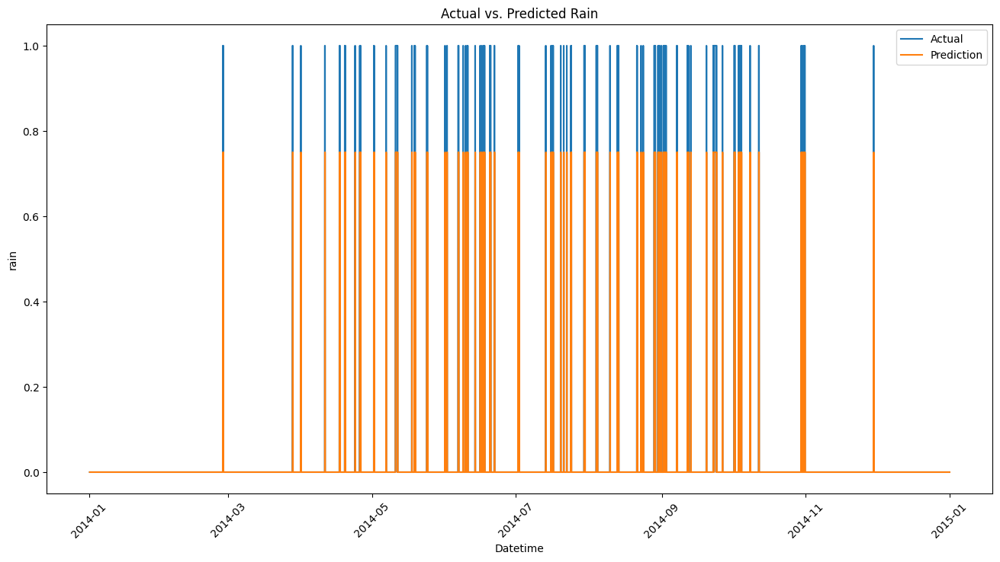

In [96]:
# Plot

# Apply rounding logic to prediction_lstm
rounded_prediction = [0.75 if pred > 0.5 else 0 for pred in prediction_lstm]
print(rounded_prediction)

import seaborn as sns
import matplotlib.pyplot as plt

# Extract pm2.5 values from df_test
rain_actual = test_df[6:]['rain'].values

# Plotting the actual and predicted values
plt.figure(figsize=(16, 8))
plt.plot(test_df[6:].index, rain_actual, label='Actual')
plt.plot(test_df[6:].index, rounded_prediction, label='Prediction')
plt.xlabel('Datetime')
plt.ylabel('rain')
plt.title('Actual vs. Predicted Rain')
plt.legend()
plt.xticks(rotation=45)
plt.show()

In [97]:
scores_lstm = {}

# Calculate accuracy
prediction_lstm_acc = [1 if pred > 0.5 else 0 for pred in prediction_lstm]
lstm_accuracy = np.mean(prediction_lstm_acc == test_df[6:]['rain'].values)
scores_lstm['Accuracy'] = lstm_accuracy

# Calculate precision, recall, and F1 score
precision = metrics.precision_score(test_df[6:]['rain'].values, prediction_lstm_acc)
recall = metrics.recall_score(test_df[6:]['rain'].values, prediction_lstm_acc)
f1_score = metrics.f1_score(test_df[6:]['rain'].values, prediction_lstm_acc)

scores_lstm['Precision'] = precision
scores_lstm['Recall'] = recall
scores_lstm['F1 Score'] = f1_score
scores_lstm['Time'] = execution_time_lstm

# Print the evaluation dictionary
print("Evaluation Metrics:")
for metric, value in scores_lstm.items():
    print(f"{metric}: {value}")

Evaluation Metrics:
Accuracy: 0.976891969959561
Precision: 0.6539792387543253
Recall: 0.6539792387543253
F1 Score: 0.6539792387543253
Time: 72.45765018463135


In [98]:
rain_metrics_list['LSTM'] = scores_lstm

#### 3. ARIMA

/Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


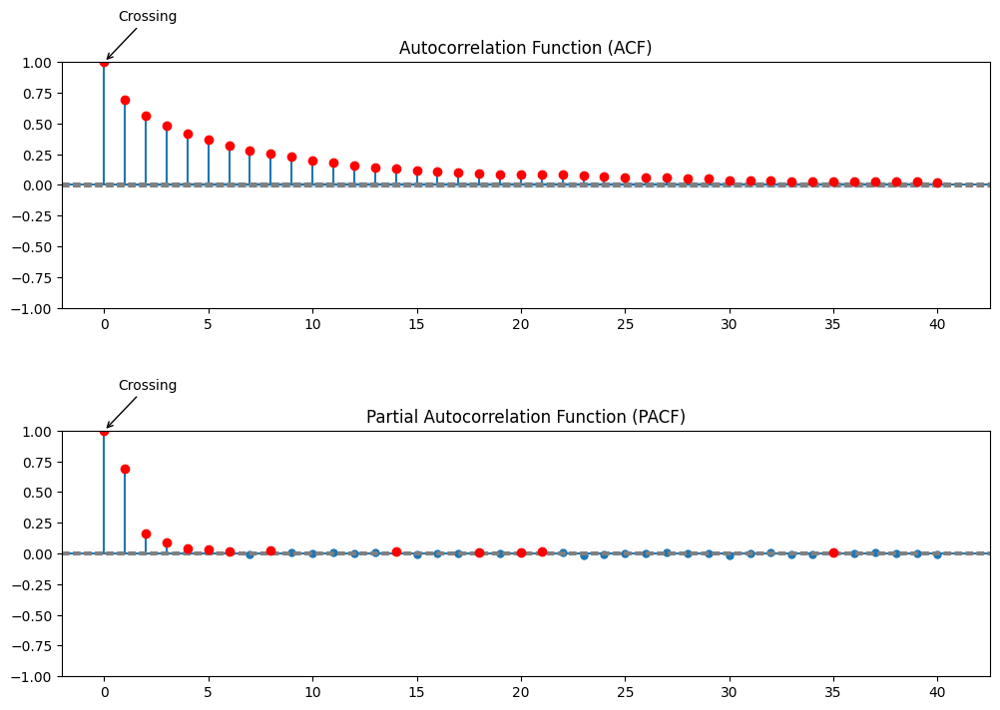

In [99]:
# Calculate ACF and PACF
acf = sm.tsa.stattools.acf(train_df['rain'], nlags=40)
pacf = sm.tsa.stattools.pacf(train_df['rain'], nlags=40)

# Plot ACF and PACF with upper confidence interval
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))

# ACF plot
plot_acf(train_df['rain'], lags=40, ax=ax1)
ax1.axhline(y=0, color='gray', linestyle='--')
ax1.axhline(y=-1.96/np.sqrt(len(train_df['rain'])), color='gray', linestyle='--')
ax1.axhline(y=1.96/np.sqrt(len(train_df['rain'])), color='gray', linestyle='--')
ax1.plot(np.where(acf > 1.96/np.sqrt(len(train_df['rain'])))[0], acf[acf > 1.96/np.sqrt(len(train_df['rain']))], 'ro')
ax1.annotate('Crossing', xy=(np.where(acf > 1.96/np.sqrt(len(train_df['rain'])))[0][0], acf[acf > 1.96/np.sqrt(len(train_df['rain']))][0]),
             xytext=(10, 30), textcoords='offset points', arrowprops=dict(arrowstyle="->"))
ax1.set_title('Autocorrelation Function (ACF)')

# PACF plot
plot_pacf(train_df['rain'], lags=40, ax=ax2)
ax2.axhline(y=0, color='gray', linestyle='--')
ax2.axhline(y=-1.96/np.sqrt(len(train_df['rain'])), color='gray', linestyle='--')
ax2.axhline(y=1.96/np.sqrt(len(train_df['rain'])), color='gray', linestyle='--')
ax2.plot(np.where(pacf > 1.96/np.sqrt(len(train_df['rain'])))[0], pacf[pacf > 1.96/np.sqrt(len(train_df['rain']))], 'ro')
ax2.annotate('Crossing', xy=(np.where(pacf > 1.96/np.sqrt(len(train_df['rain'])))[0][0], pacf[pacf > 1.96/np.sqrt(len(train_df['rain']))][0]),
             xytext=(10, 30), textcoords='offset points', arrowprops=dict(arrowstyle="->"))
ax2.set_title('Partial Autocorrelation Function (PACF)')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Show the plot
plt.show()


p=0<br>
q=0<br>

In [100]:
# Define the time series data
data = train_df['rain']

# Function to check stationarity
def check_stationarity(data):
    result = adfuller(data)
    p_value = result[1]
    return p_value

# Perform differencing until stationarity is achieved
d = 0
while True:
    p_value = check_stationarity(data)
    if p_value < 0.05:
        break
    data = data.diff().dropna()  # Differencing
    d += 1

print("The value of d is:", d)


The value of d is: 0


In [101]:
order=(0,0,0)
train_rain = train_df['rain'].reset_index(drop=True)

# Create and fit the ARIMA model
arima = ARIMA(train_rain, order=order)  # Replace p, d, q with the desired values for the model's order

# Record time taken
start_time = time.time()

arima_fit = arima.fit()

# Generate predictions
predictions = arima_fit.predict(start=len(train_df), end=len(train_df) + len(test_df) - 1)

end_time = time.time()
execution_time_arima = end_time - start_time
print("Time taken:", execution_time_arima, "seconds")

Time taken: 2.0796878337860107 seconds


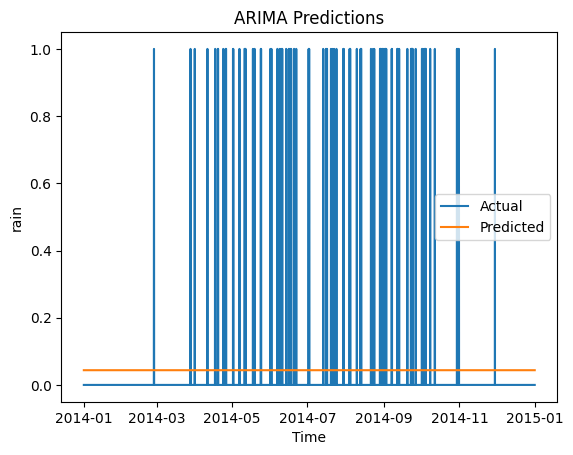

In [102]:
# Calculate evaluation metrics (e.g., mean squared error, mean absolute error)
mse = ((predictions - test_df['rain']) ** 2).mean()
mae = np.abs(predictions - test_df['rain']).mean()

# Visualize the predictions and actual values
plt.plot(test_df.index, test_df['rain'], label='Actual')
plt.plot(test_df.index, predictions, label='Predicted')
plt.xlabel('Time')
plt.ylabel('rain')
plt.title('ARIMA Predictions')
plt.legend()
plt.show()


#### 4. 1D-CNN

In [124]:
win_cnn = WindowGenerator(
    lookback=6,
    batch_size=32,
    lookahead=1,
    train_df=train_df['Ir'],
    test_df=test_df['Ir'],
    label_column=['Ir'])
print(win_cnn)

train_cnn = win_cnn.train
test_cnn = win_cnn.test

Total window size: 7
Lookback indices: [0 1 2 3 4 5]
Label index: [6]
Label name: ['Ir']


In [125]:
i = 0
# Iterate over the train dataset
for inputs, labels in train_cnn:
    while i < 5:
        print(i)
        # Process your training data here
        print(f"inputs (batch_size, lookback, num_features): {inputs.shape} ")
        # print(inputs)
        # inputs will have shape: (32, 6, 1)

        print(f"labels (batch_size, lookahead, num_features): {labels.shape} ")
        # print(labels)
        i += 1
        # labels will have shape: (32, 1, 1)

0
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
1
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
2
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
3
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
4
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 


In [126]:
input_shape=(32,6,1)
cnn = CNNModel(input_shape)

In [127]:
# Record time taken
start_time = time.time()

cnn.fit(train_cnn,epochs=10)
prediction_cnn = cnn.predict(test_cnn)

end_time = time.time()
execution_time_1d = end_time - start_time
print("Time taken:", execution_time_1d, "seconds")

Epoch 1/10
1035/1035 [==============================] - 5s 5ms/step - loss: 1.0342 - mean_absolute_error: 0.2474
Epoch 2/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.9573 - mean_absolute_error: 0.2267
Epoch 3/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.9446 - mean_absolute_error: 0.2222
Epoch 4/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.9397 - mean_absolute_error: 0.2201
Epoch 5/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.9367 - mean_absolute_error: 0.2191
Epoch 6/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.9342 - mean_absolute_error: 0.2186
Epoch 7/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.9321 - mean_absolute_error: 0.2184
Epoch 8/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.9301 - mean_absolute_error: 0.2182
Epoch 9/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.9285 - mean_absolu

In [128]:
mse_c, mae_c =  cnn.evaluate(test_cnn)
print("Test Mean Squared Error (RMSE):", np.sqrt(mse_c))
print("Test Mean Absolute Error (MAE):", mae_c)

Test Mean Squared Error (RMSE): 0.7236273349652464
Test Mean Absolute Error (MAE): 0.13779714703559875


In [129]:
print(prediction_cnn)

[[[0.01420509]
  [0.01420509]
  [0.01420509]
  [0.01420509]]

 [[0.01420509]
  [0.01420509]
  [0.01420509]
  [0.01420509]]

 [[0.01420509]
  [0.01420509]
  [0.01420509]
  [0.01420509]]

 ...

 [[0.01420509]
  [0.01420509]
  [0.01420509]
  [0.01420509]]

 [[0.01420509]
  [0.01420509]
  [0.01420509]
  [0.01420509]]

 [[0.01420509]
  [0.01420509]
  [0.01420509]
  [0.01420509]]]


In [130]:
prediction_cnn.mean()

0.11170698

In [131]:
print(len(prediction_cnn))
print(len(test_df['Ir']))
print(prediction_cnn.shape)

8655
8661
(8655, 4, 1)


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

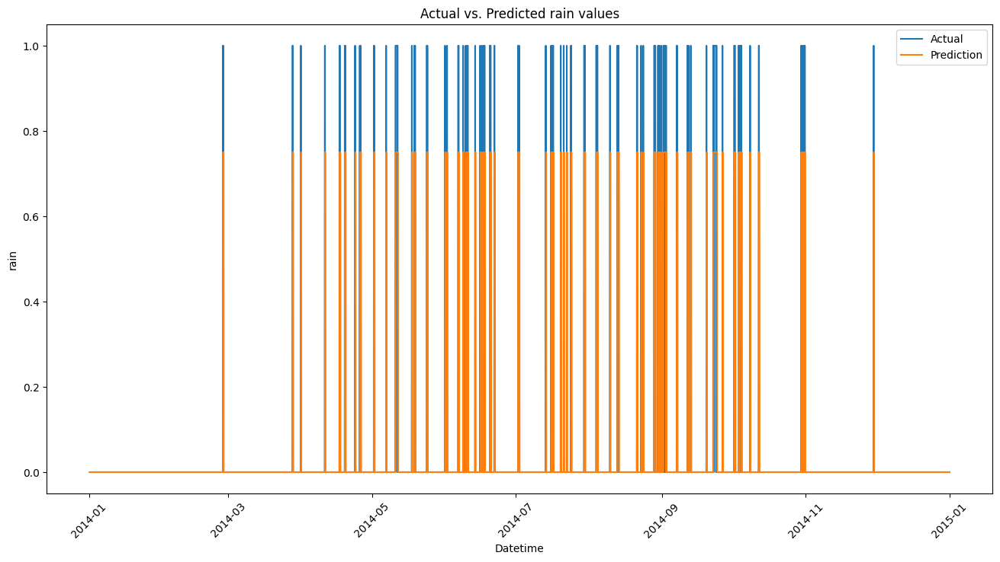

In [132]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extract rain values from test_df
rain_actual = test_df[6:]['rain'].values
pred_1d = []
for pred in prediction_cnn:
    pred_arr = np.array(pred)
    pred_mean = pred_arr.mean()
    if pred_mean > 0.03: 
        pred_mean = 0.75
    else:
        pred_mean = 0
    pred_1d.append(pred_mean)

print(pred_1d)

# Plotting the actual and predicted values
plt.figure(figsize=(16, 8))
plt.plot(test_df[6:].index, rain_actual, label='Actual')
plt.plot(test_df[6:].index, pred_1d, label='Prediction')
plt.xlabel('Datetime')
plt.ylabel('rain')
plt.title('Actual vs. Predicted rain values')
plt.legend()
plt.xticks(rotation=45)
plt.show()

In [133]:
scores_1d = {}

# Calculate accuracy
prediction_1d_acc = [1 if pred > 0.5 else 0 for pred in pred_1d]
lstm_accuracy = np.mean(prediction_1d_acc == test_df[6:]['rain'].values)
scores_1d['Accuracy'] = lstm_accuracy

# Calculate precision, recall, and F1 score
precision = metrics.precision_score(test_df[6:]['rain'].values, prediction_1d_acc)
recall = metrics.recall_score(test_df[6:]['rain'].values, prediction_1d_acc)
f1_score = metrics.f1_score(test_df[6:]['rain'].values, prediction_1d_acc)

scores_1d['Precision'] = precision
scores_1d['Recall'] = recall
scores_1d['F1 Score'] = f1_score
scores_1d['Time'] = execution_time_1d

# Print the evaluation dictionary
print("Evaluation Metrics:")
for metric, value in scores_1d.items():
    print(f"{metric}: {value}")

Evaluation Metrics:
Accuracy: 0.9540150202195263
Precision: 0.40036563071297987
Recall: 0.7577854671280276
F1 Score: 0.5239234449760766
Time: 50.1042377948761


In [33]:
rain_metrics_list['1D_CNN'] = scores_1d

#### Time results

In [35]:
execution_times = {
    'HMM': execution_time_hmm,
    'LSTM': execution_time_lstm,
    'ARIMA': execution_time_arima,
    '1D-CNN': execution_time_1d
}

print("Execution Time Summary:")
for model, timing in execution_times.items():
    print(f"{model}: {timing} seconds")

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:2                                                                                    │
│                                                                                                  │
│    1 execution_times = {                                                                         │
│ ❱  2 │   'HMM': execution_time_hmm,                                                              │
│    3 │   'LSTM': execution_time_lstm,                                                            │
│    4 │   'ARIMA': execution_time_arima,                                                          │
│    5 │   '1D-CNN': execution_time_1d                                                             │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
NameError: name 'execution_time_hmm' is not defined

#### 5. Overall results

In [36]:
print(rain_metrics_list)

{'1D_CNN': {'Accuracy': 0.9394569612940497, 'Precision': 0.3279648609077599, 'Recall': 0.7750865051903114, 'F1 Score': 0.4609053497942387, 'Time': 51.95890212059021}}


1D_CNN
{'Accuracy': 0.9394569612940497, 'Precision': 0.3279648609077599, 'Recall': 0.7750865051903114, 'F1 Score': 0.4609053497942387, 'Time': 51.95890212059021}


/Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/evaluate/visualization.py:47: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(*ranges[j])
/Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/evaluate/visualization.py:56: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(*ranges[j])
/Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/evaluate/visualization.py:124: RuntimeWarning: invalid value encountered in double_scalars
  sdata.append((d - y1) / (y2 - y1) * (x2 - x1) + x1)


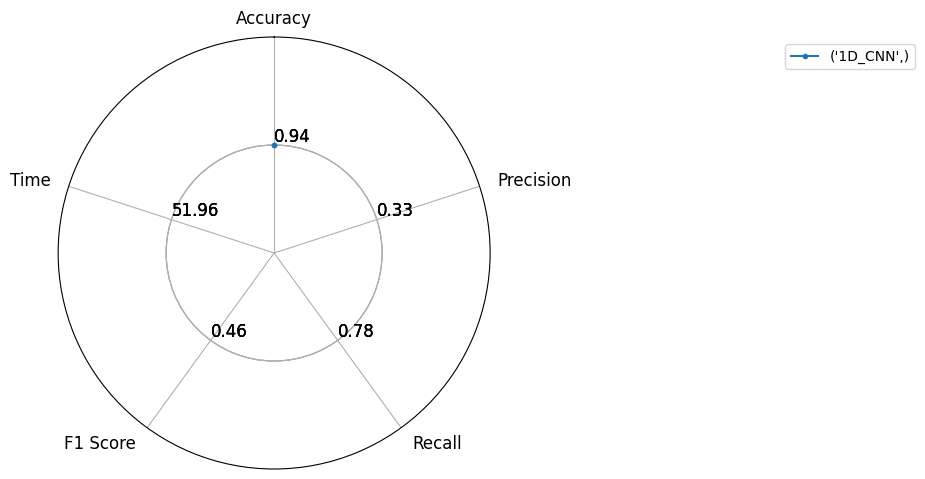

In [77]:
model_names = []
metrics_list = []
for model_name, metric in rain_metrics_list.items():
        model_names.append(model_name)
        metrics_list.append(metric)
        print(model_name)
        print(metric)
        

plot = radar_plot(data=metrics_list, model_names=model_names,invert_range=['Time'])
# plot = radar_plot(data=metrics, model_names=model_names)

# Set the origin of each plot to 0 by modifying the axis limits
#for ax in plot.axes:
   # ax.set_ylim(bottom=0)

# plt.title('Encoder-only model multiclass classification performance comparison')
plt.show()

`Regressive Data : 'pm2.5_ma'`<br>

#### 1. Hidden Markov Model

###### Iterate from 1 to 30 hidden states(hidden)

1
Test MSE: 17296.581534834855


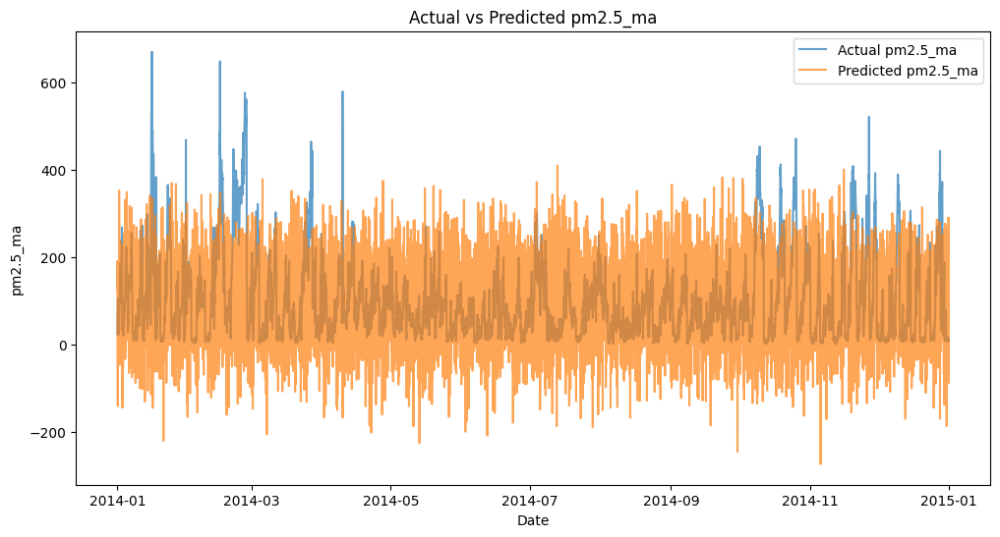

Evaluation Metrics:
MSE: 17296.581534834855
RMSE: 131.51646868295566
MAE: 101.9584655735846
R-squared: -0.9773992537651892
2
Test MSE: 16459.99290640563


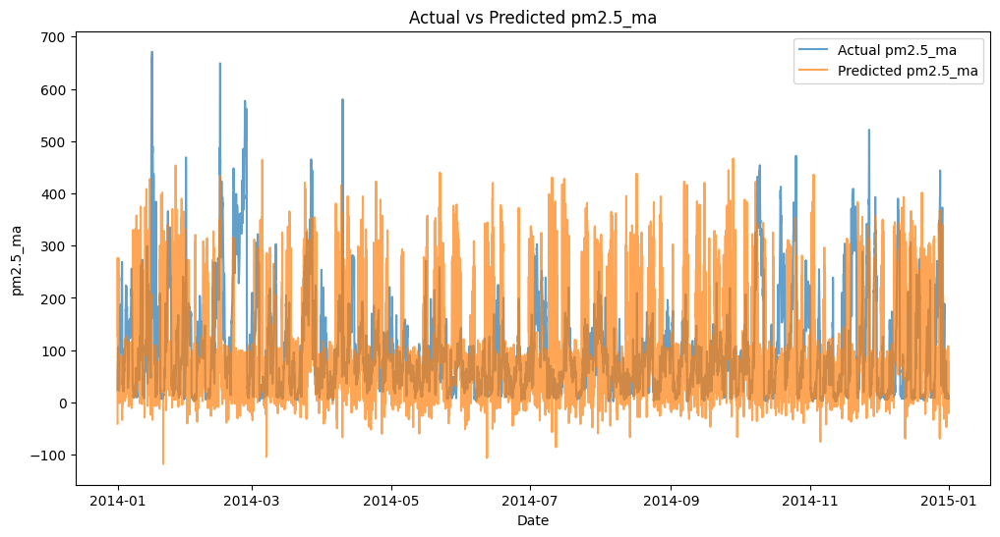

Evaluation Metrics:
MSE: 16459.99290640563
RMSE: 128.2965038744456
MAE: 93.45551297226324
R-squared: -0.8817578273808633
3
Test MSE: 16078.197466573083


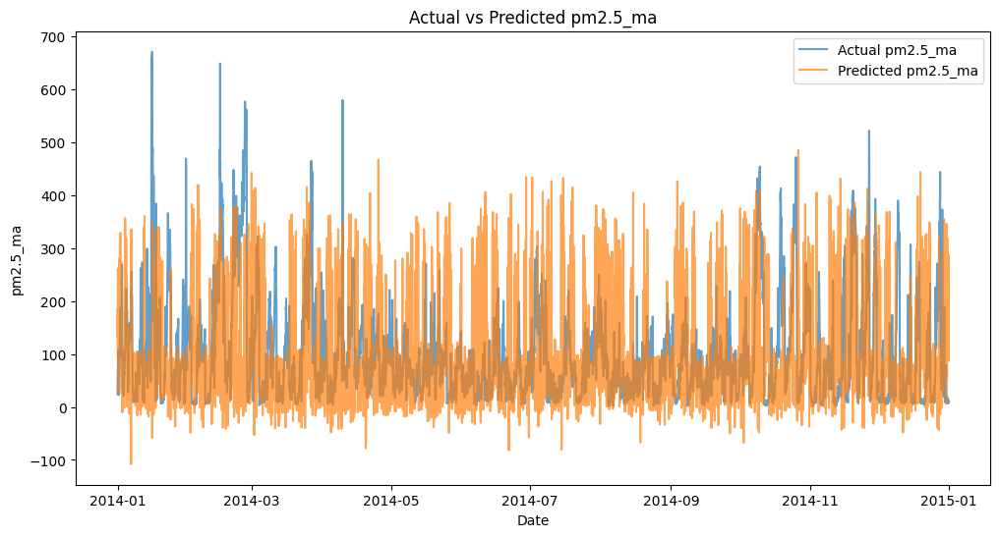

Evaluation Metrics:
MSE: 16078.197466573083
RMSE: 126.79983228132868
MAE: 91.2326092288425
R-squared: -0.8381097795689094
4
Test MSE: 16422.23082642549


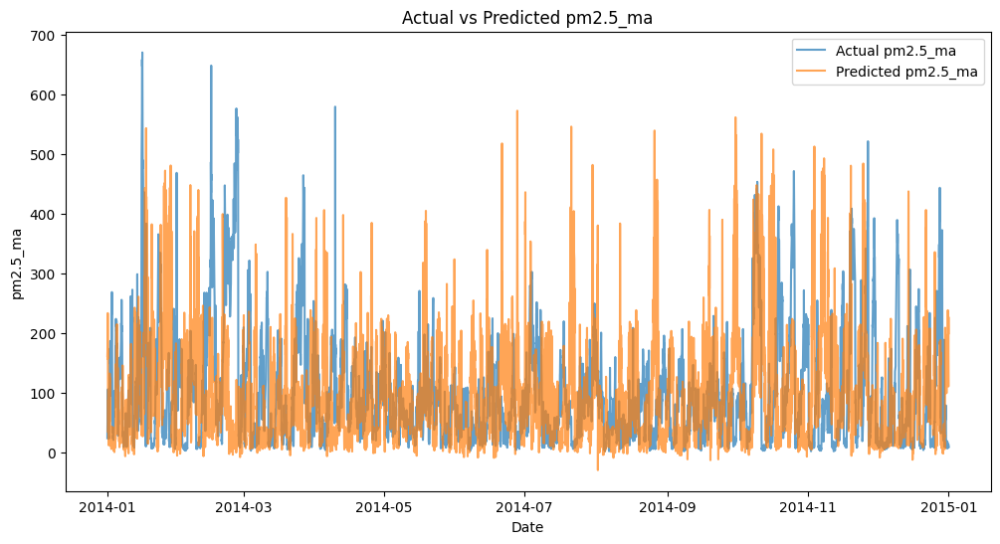

Evaluation Metrics:
MSE: 16422.23082642549
RMSE: 128.1492521493024
MAE: 92.18348296106261
R-squared: -0.8774407483891002
5
Test MSE: 17194.39789599245


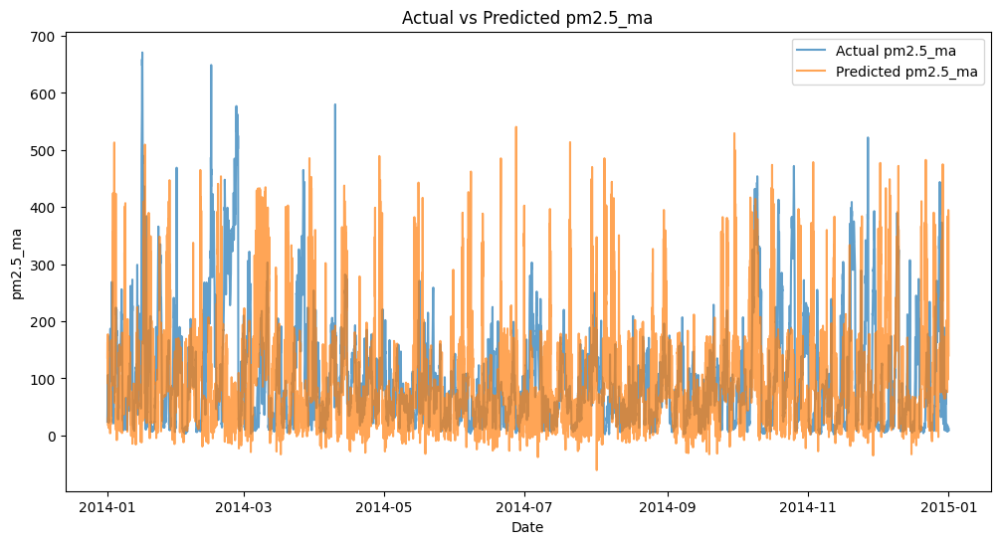

Evaluation Metrics:
MSE: 17194.39789599245
RMSE: 131.12741092537613
MAE: 94.12512760286468
R-squared: -0.965717300843622
6
Test MSE: 18519.8166322463


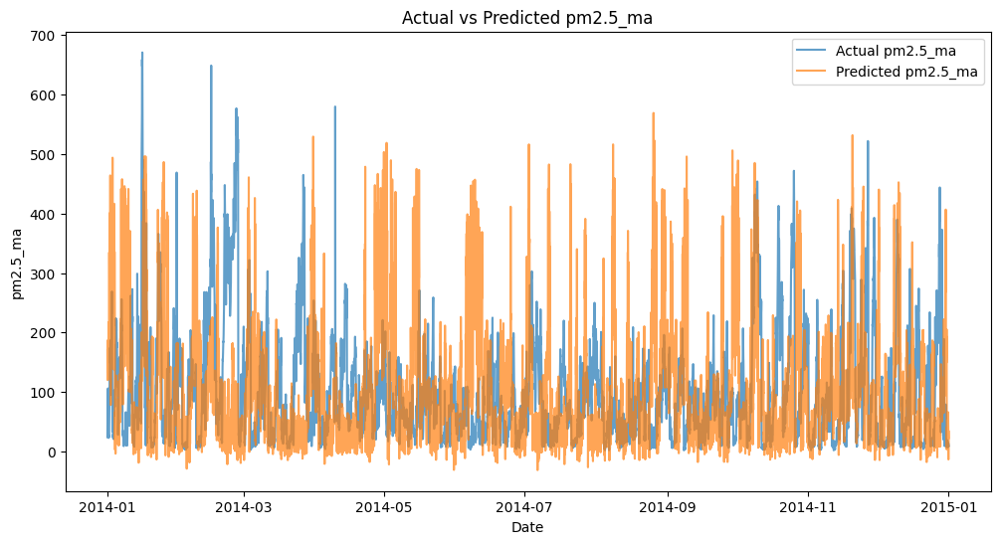

Evaluation Metrics:
MSE: 18519.8166322463
RMSE: 136.08753297876444
MAE: 99.23129420614563
R-squared: -1.1172433127735735
7
Test MSE: 17480.28168134858


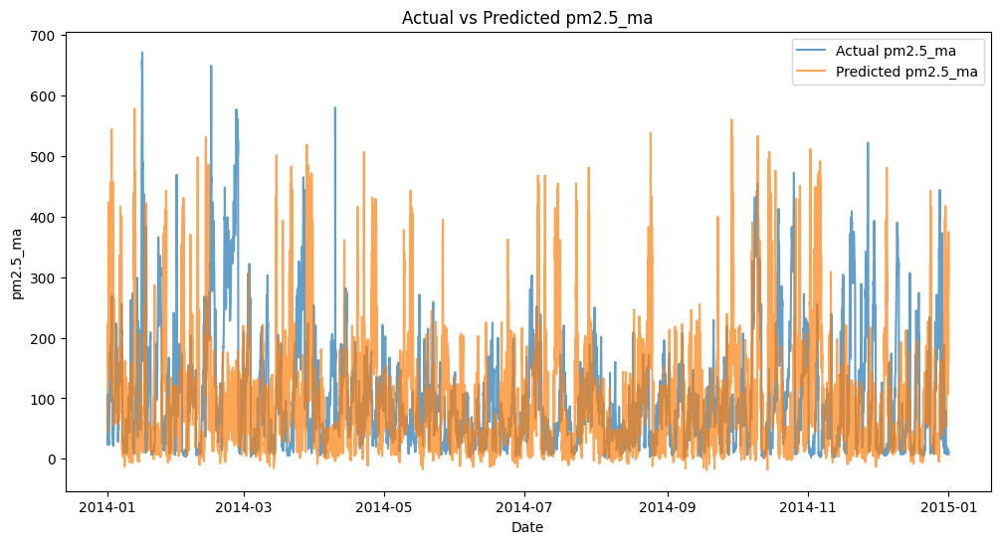

Evaluation Metrics:
MSE: 17480.28168134858
RMSE: 132.213016308337
MAE: 93.97562207527167
R-squared: -0.9984004285870012
8
Test MSE: 17447.73291878592


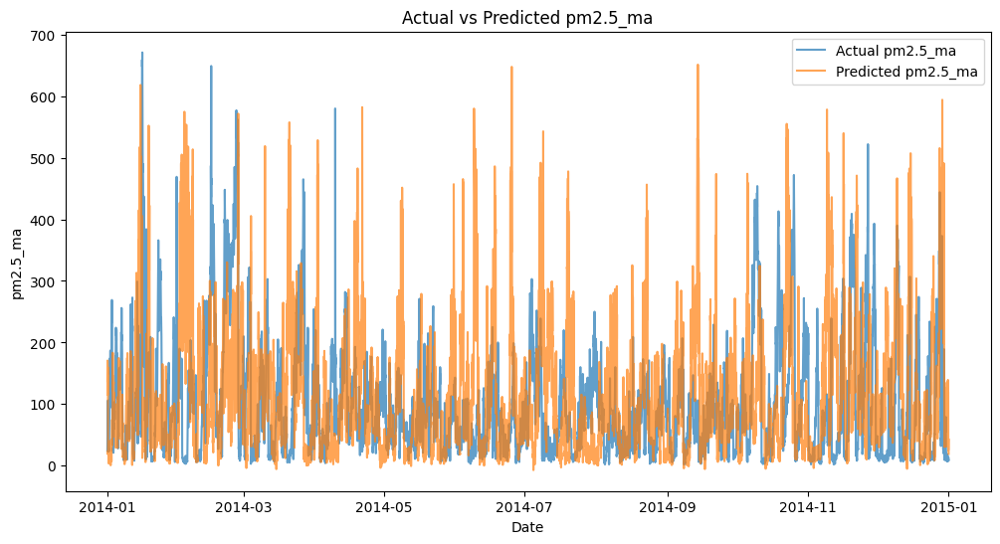

Evaluation Metrics:
MSE: 17447.73291878592
RMSE: 132.089866828557
MAE: 95.970169121201
R-squared: -0.9946793523342885
9
Test MSE: 14278.612335260297


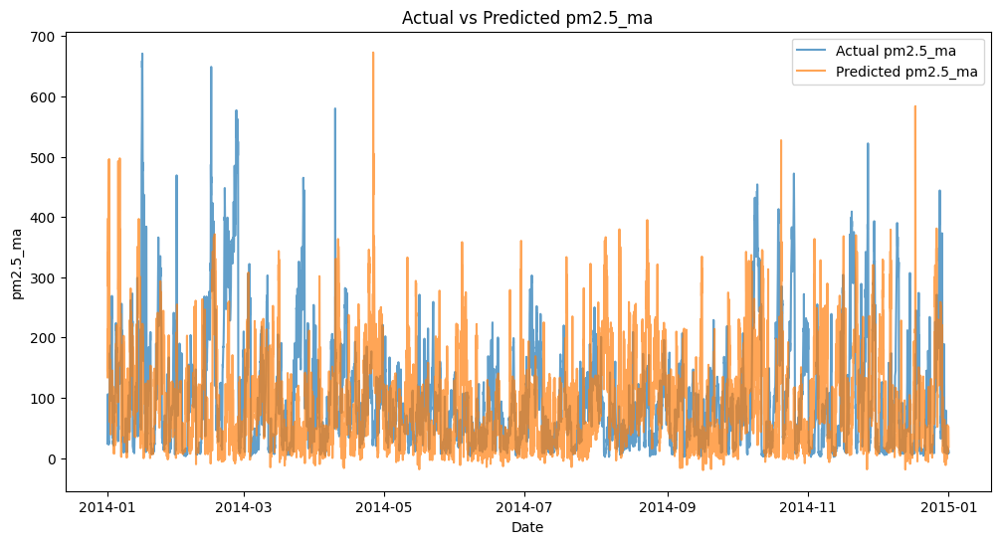

Evaluation Metrics:
MSE: 14278.612335260297
RMSE: 119.4931476498142
MAE: 86.63993968689914
R-squared: -0.6323755835615592
10
Test MSE: 18620.0790486296


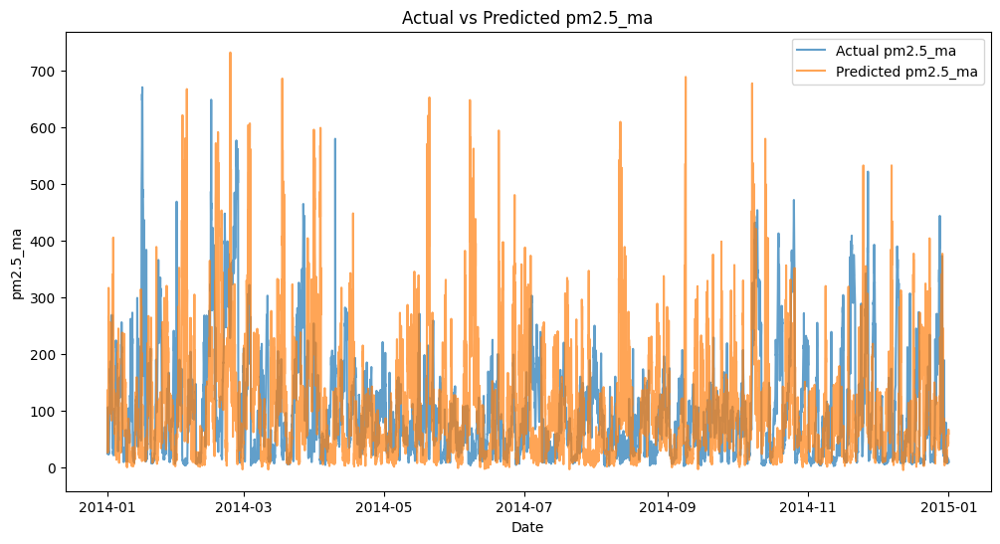

Evaluation Metrics:
MSE: 18620.0790486296
RMSE: 136.45541047767068
MAE: 97.76552746434173
R-squared: -1.1287056255396966
11
Test MSE: 18460.753843759037


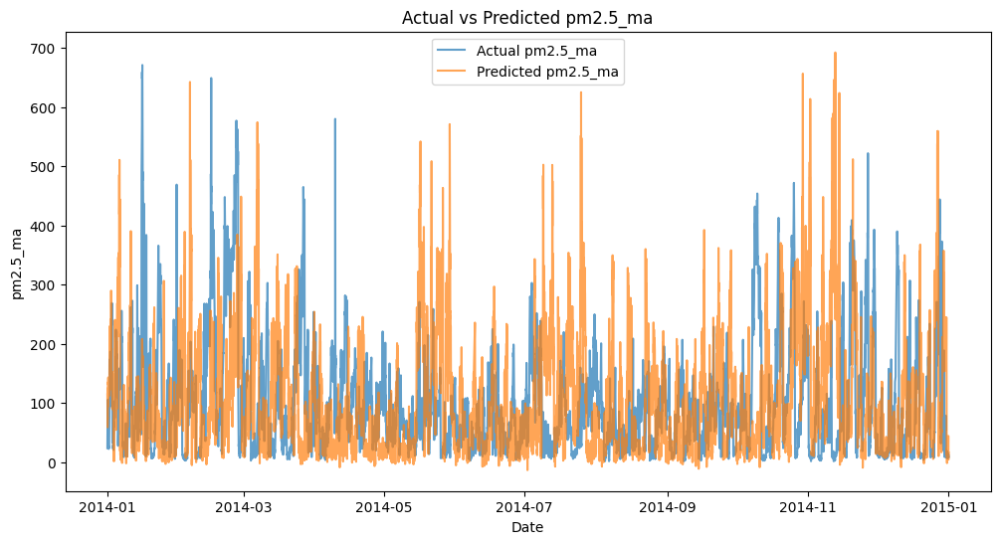

Evaluation Metrics:
MSE: 18460.753843759037
RMSE: 135.8703567514233
MAE: 101.39789376456214
R-squared: -1.1104910702194717
12
Test MSE: 17406.504457404142


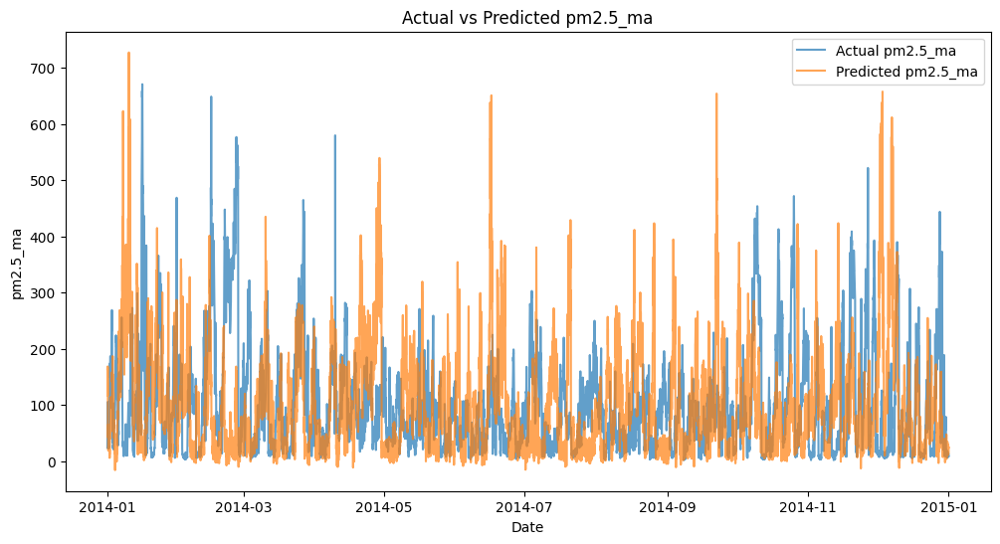

Evaluation Metrics:
MSE: 17406.504457404142
RMSE: 131.9337123611859
MAE: 95.90426654364325
R-squared: -0.9899659857880707
13
Test MSE: 15444.979464128272


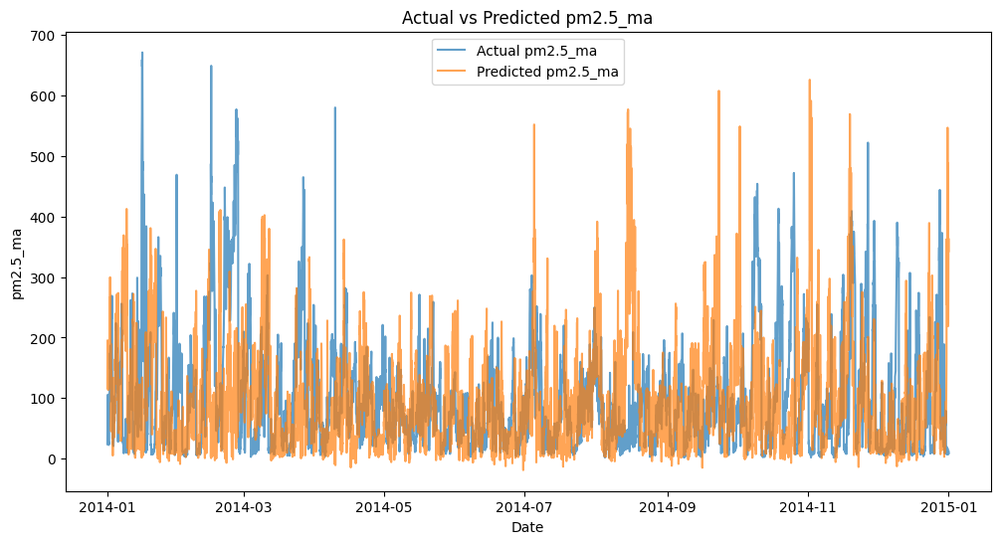

Evaluation Metrics:
MSE: 15444.979464128272
RMSE: 124.27783174857964
MAE: 88.03538224770627
R-squared: -0.7657183186907408
14
Test MSE: 18763.299265009973


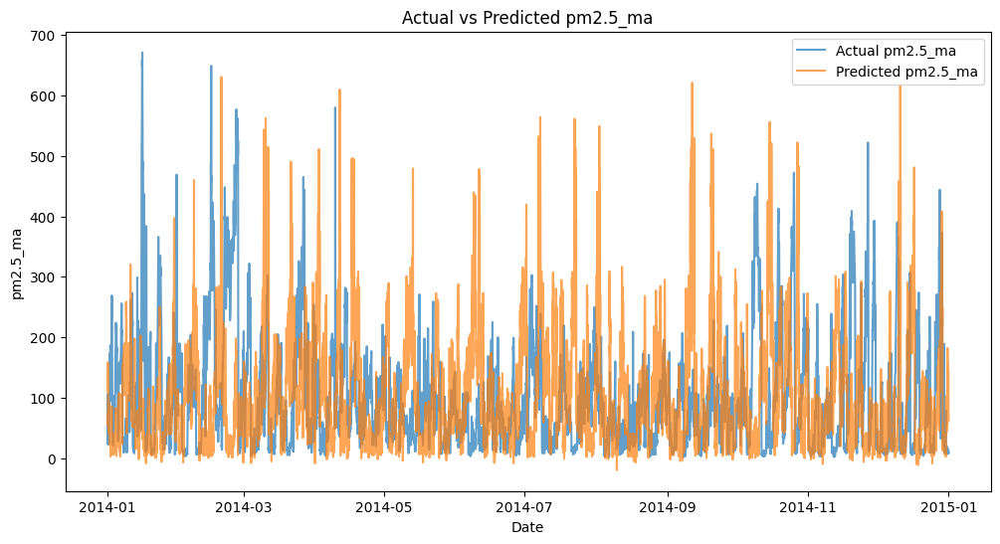

Evaluation Metrics:
MSE: 18763.299265009973
RMSE: 136.97919281777789
MAE: 100.37095863321225
R-squared: -1.1450790082468099
15
Test MSE: 18889.161199068


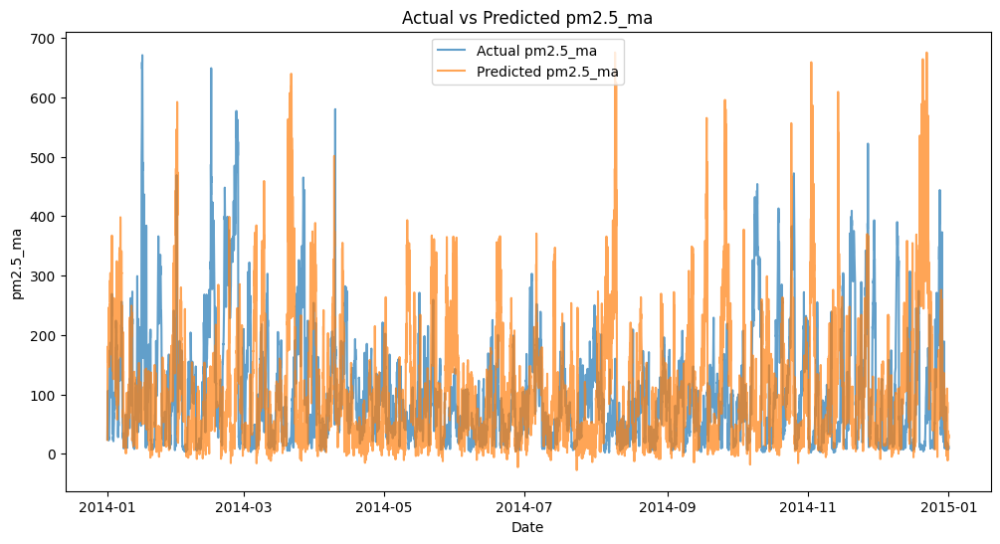

Evaluation Metrics:
MSE: 18889.161199068
RMSE: 137.4378448574773
MAE: 97.76461275727257
R-squared: -1.1594679378733117
16
Test MSE: 15946.264520000712


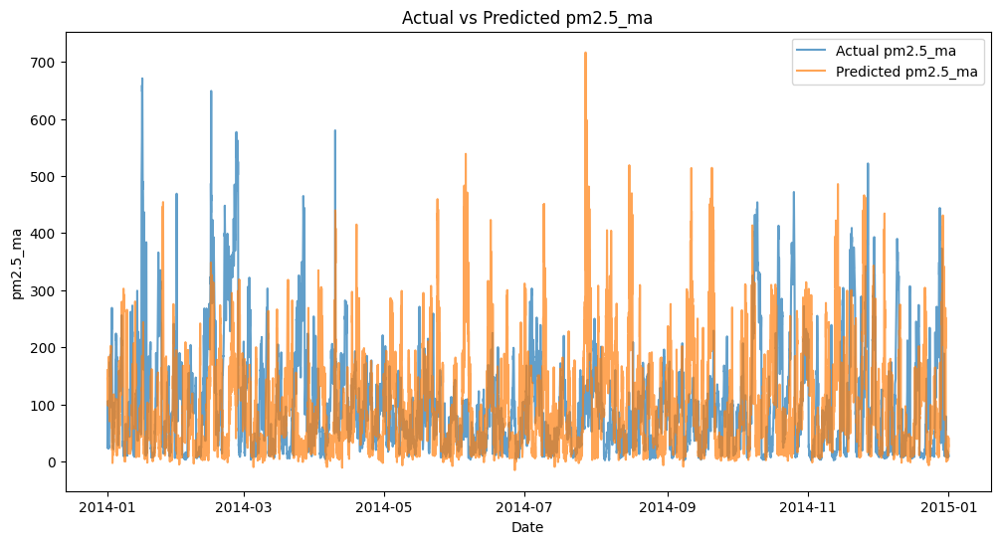

Evaluation Metrics:
MSE: 15946.264520000712
RMSE: 126.27851963022339
MAE: 93.13584625663171
R-squared: -0.8230267928195432
17
Test MSE: 19406.0236824776


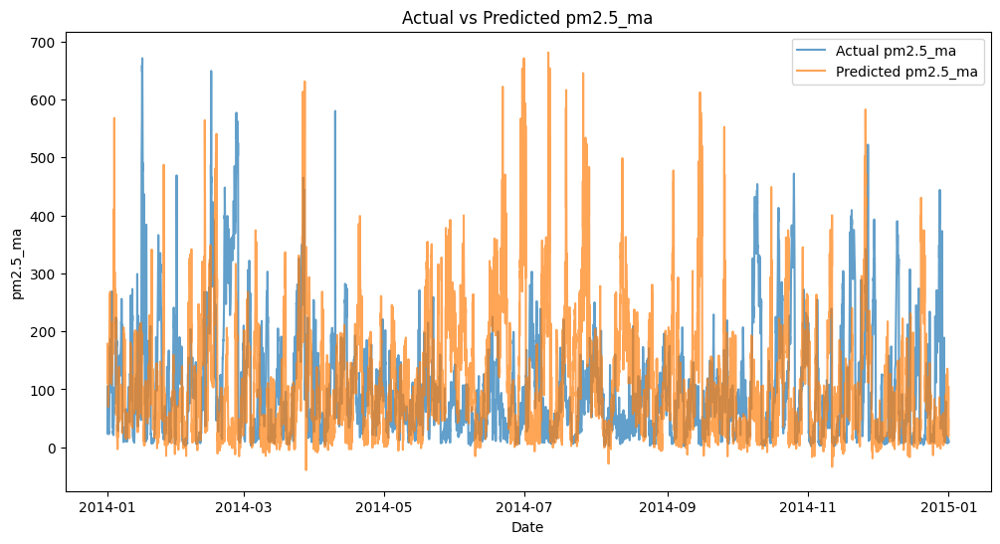

Evaluation Metrics:
MSE: 19406.0236824776
RMSE: 139.30550485346083
MAE: 100.75769768048542
R-squared: -1.2185572721984212
18
Test MSE: 16691.9944158146


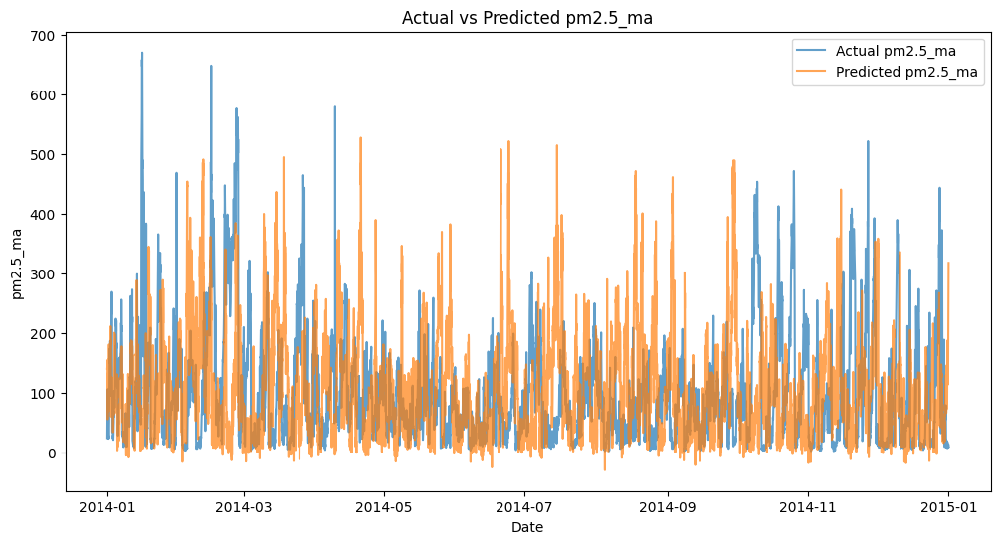

Evaluation Metrics:
MSE: 16691.9944158146
RMSE: 129.19750158503297
MAE: 95.3601124663126
R-squared: -0.9082809649530921
19
Test MSE: 17003.859688976743


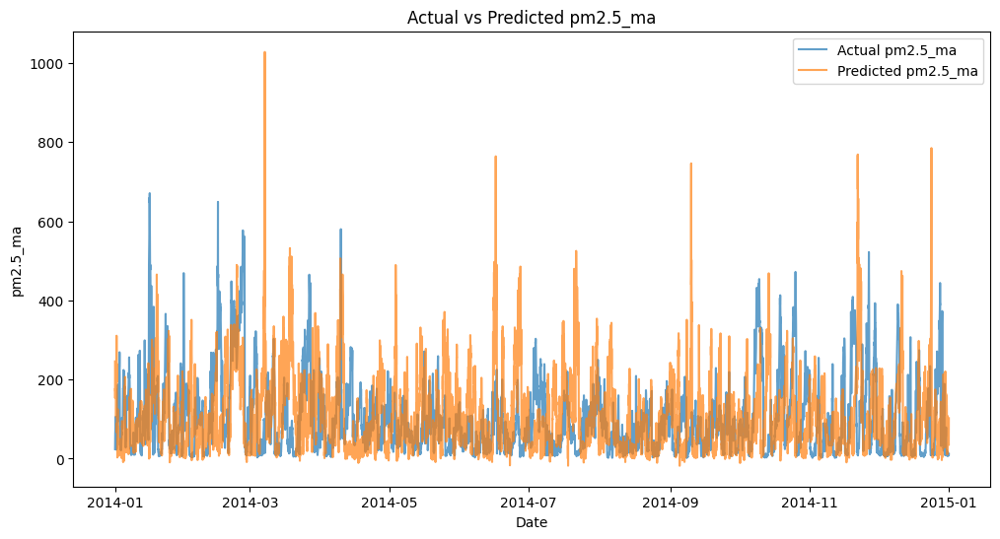

Evaluation Metrics:
MSE: 17003.859688976743
RMSE: 130.39884849559348
MAE: 94.70676009911386
R-squared: -0.9439343775759341
20
Test MSE: 15870.0159365596


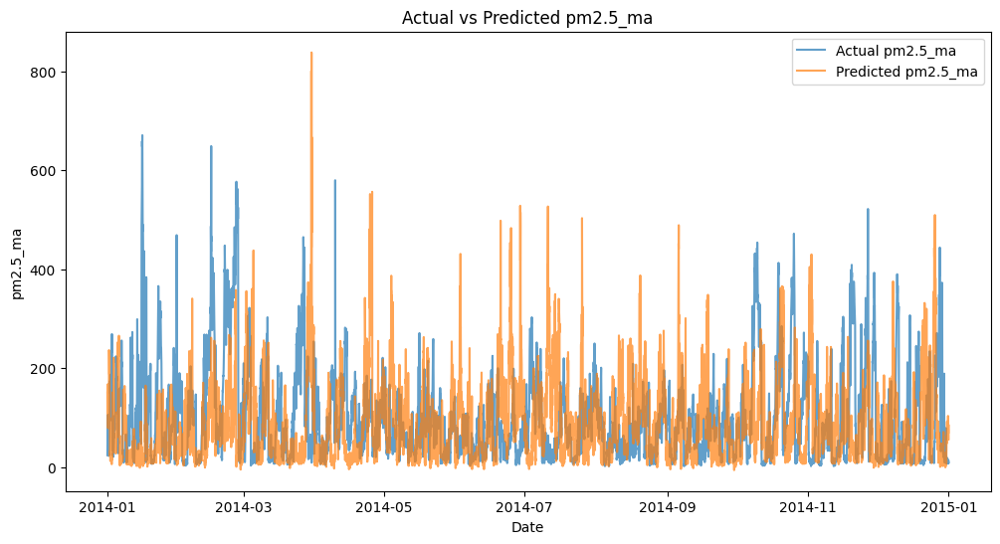

Evaluation Metrics:
MSE: 15870.0159365596
RMSE: 125.97625147844175
MAE: 90.20659797787593
R-squared: -0.8143098164798281
21
Test MSE: 17557.218190956646


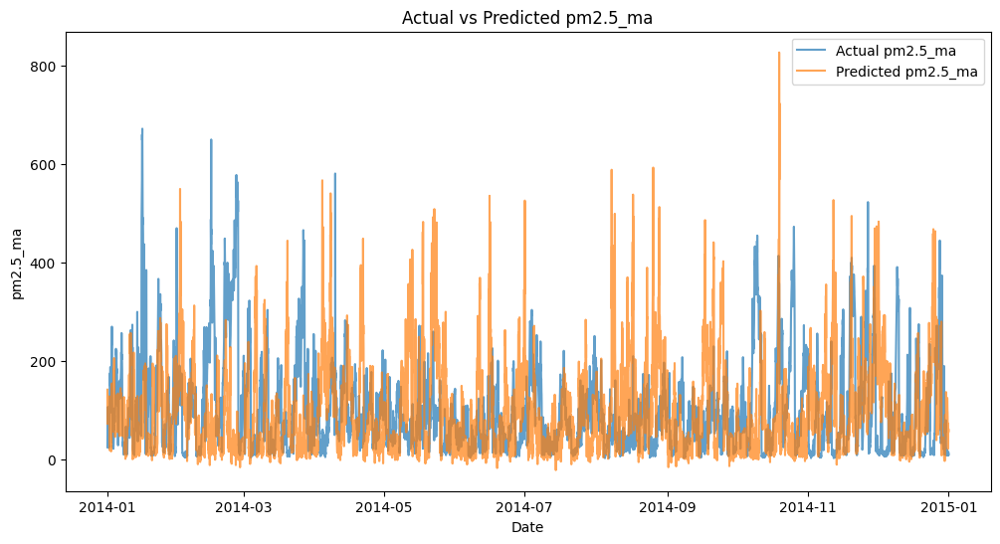

Evaluation Metrics:
MSE: 17557.218190956646
RMSE: 132.50365350040974
MAE: 94.68295633384234
R-squared: -1.007196050795927
22
Test MSE: 16475.655515657887


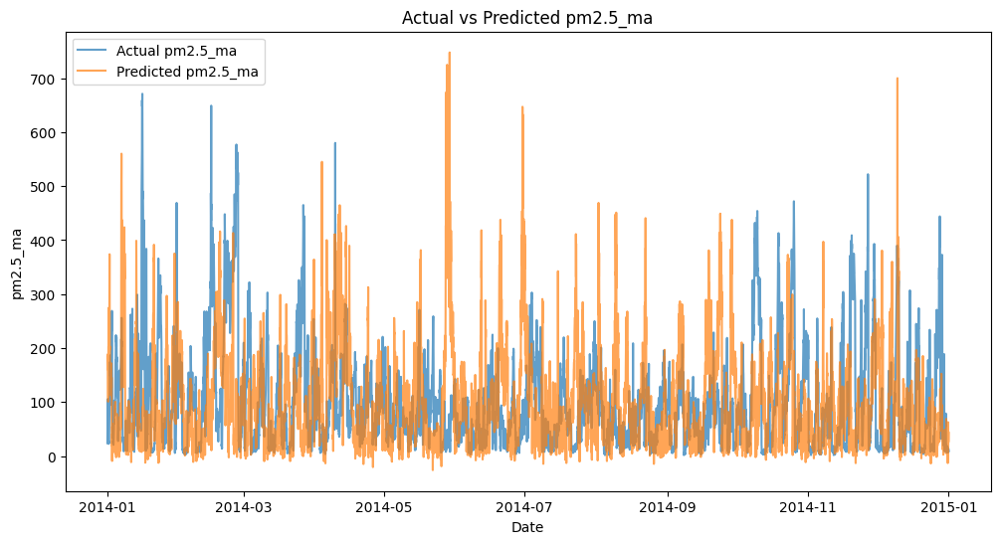

Evaluation Metrics:
MSE: 16475.655515657887
RMSE: 128.3575300309954
MAE: 91.14874027593702
R-squared: -0.8835484258170372
23
Test MSE: 19014.73507278455


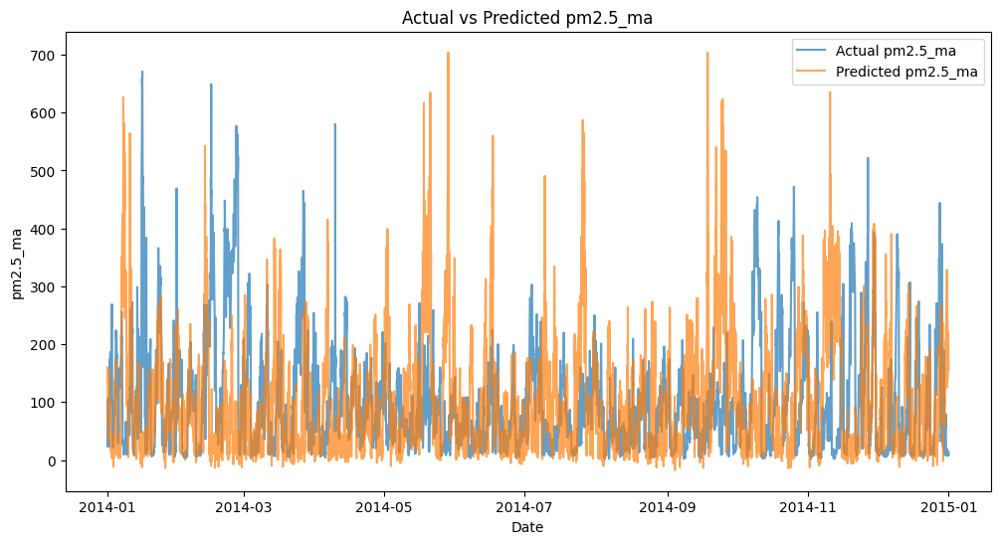

Evaluation Metrics:
MSE: 19014.73507278455
RMSE: 137.89392688869424
MAE: 97.83639595360933
R-squared: -1.1738239355413724
24
Test MSE: 16343.040566674064


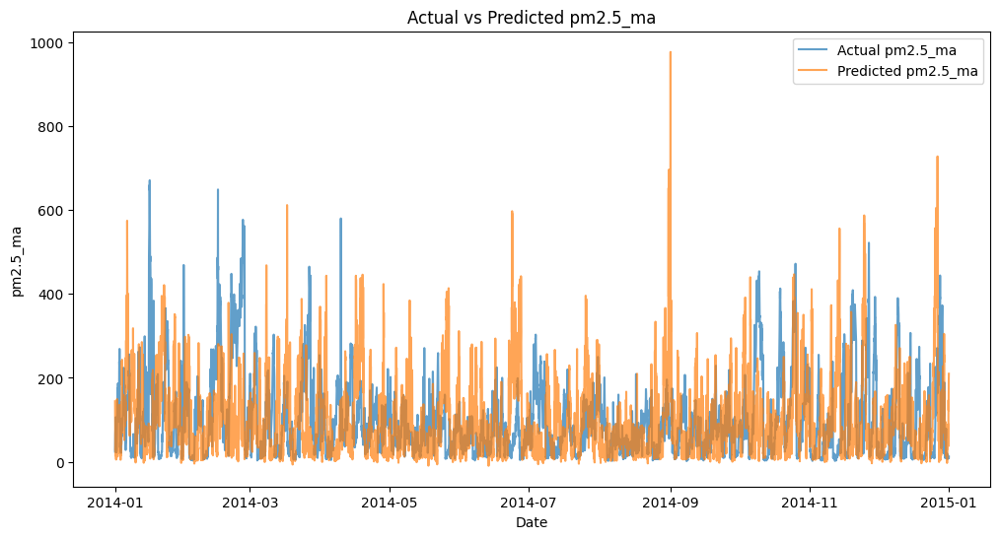

Evaluation Metrics:
MSE: 16343.040566674064
RMSE: 127.83990209114705
MAE: 92.8292087934831
R-squared: -0.8683874704207013
25
Test MSE: 16724.029789569388


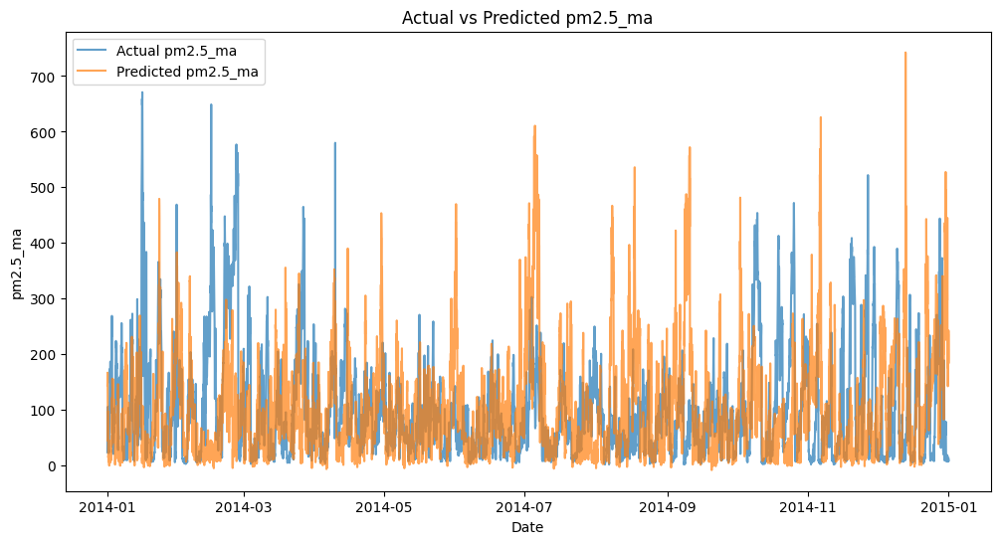

Evaluation Metrics:
MSE: 16724.029789569388
RMSE: 129.3214204591389
MAE: 90.71706437297672
R-squared: -0.9119433489929227
26
Test MSE: 17015.47798438238


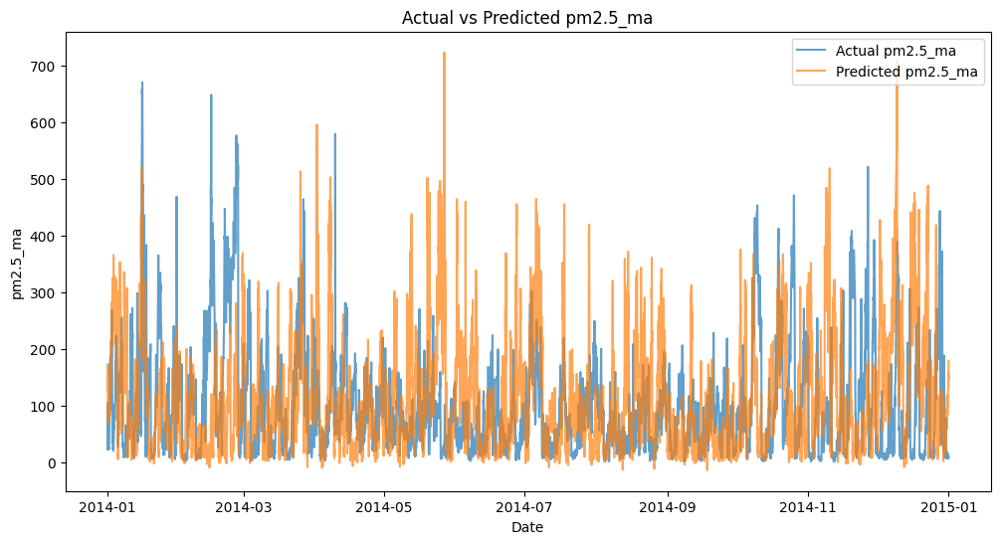

Evaluation Metrics:
MSE: 17015.47798438238
RMSE: 130.44338996048202
MAE: 94.81606205041271
R-squared: -0.9452626174144749
27
Test MSE: 17982.04962150479


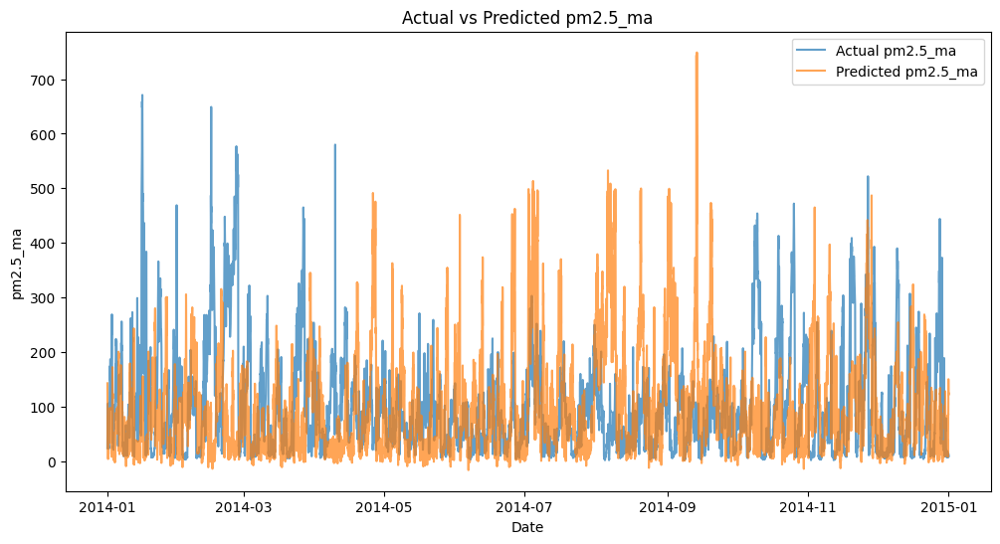

Evaluation Metrics:
MSE: 17982.04962150479
RMSE: 134.09716485259779
MAE: 95.95121155691436
R-squared: -1.0557641075561621
28
Test MSE: 16718.465890507236


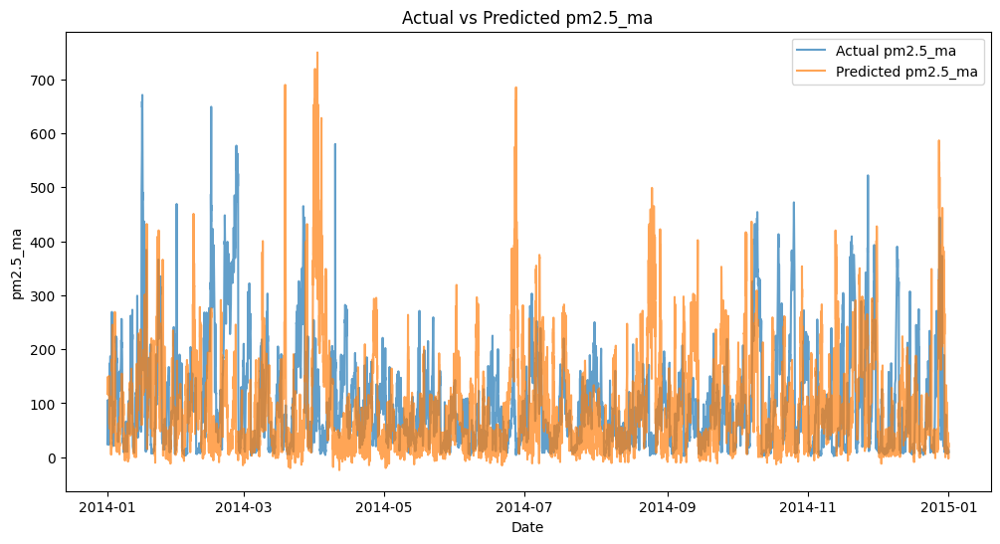

Evaluation Metrics:
MSE: 16718.465890507236
RMSE: 129.2999067691359
MAE: 91.86056381057064
R-squared: -0.911307266664668
29
Test MSE: 17288.330821076022


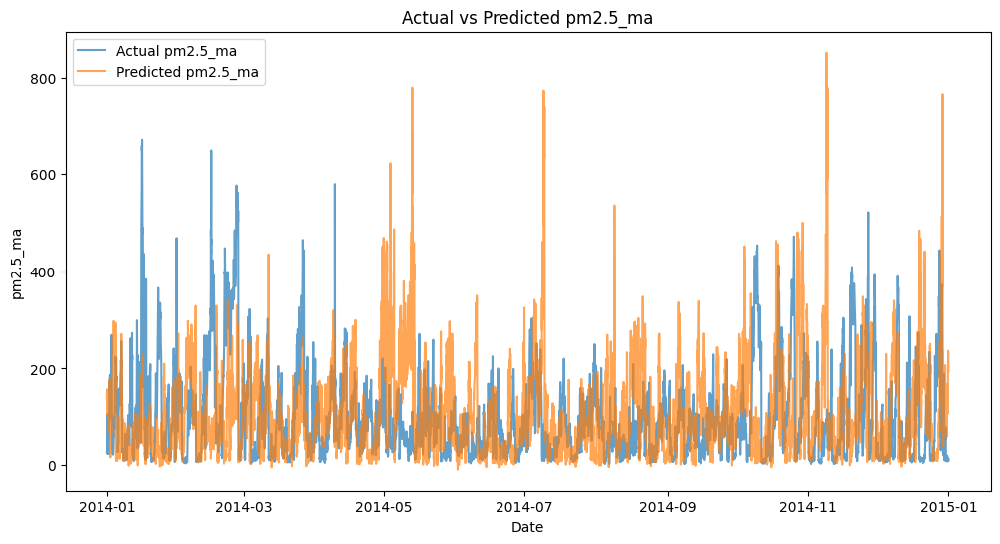

Evaluation Metrics:
MSE: 17288.330821076022
RMSE: 131.48509733454975
MAE: 93.35606550472747
R-squared: -0.9764560063843766
Minimum MSE: 14278.612335260297
Corresponding No. of Hidden States: 9


In [38]:
compiled_results=[]
for i in range(1,30):
    print(i)
    result, execution_time_hmm, scores_hmm = run_hmm(train_df, test_df, model_type='gaussian', n_states=i, feat='pm2.5_ma')
    compiled_results.append(result)

min_mse = min(compiled_results)
min_n_states = compiled_results.index(min_mse) + 1
print("Minimum MSE:", min_mse)
print("Corresponding No. of Hidden States:", min_n_states)


##### Best Hidden Markov

Minimum MSE: 14278.612335260297<br>
Corresponding No. of Hidden States: 9

Test MSE: 14278.61233521431


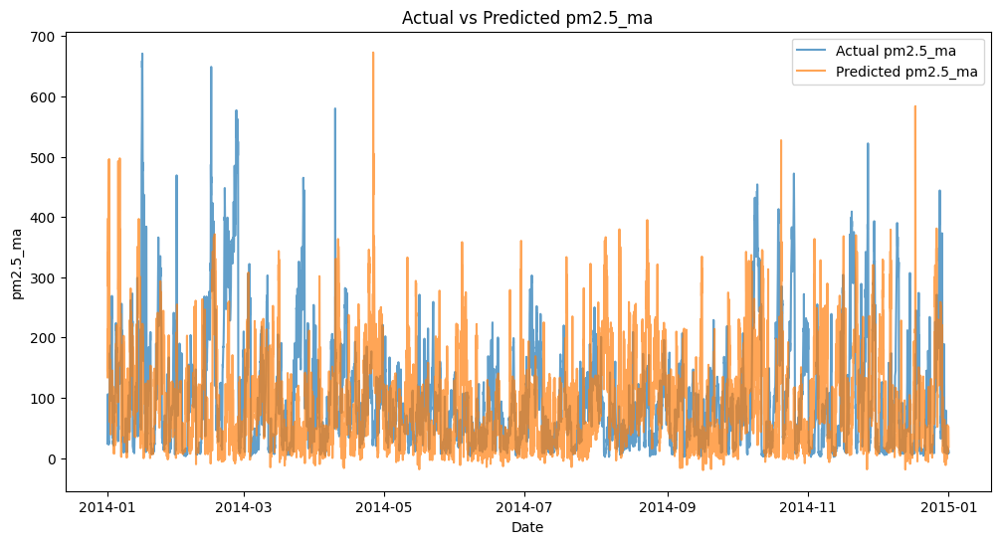

Evaluation Metrics:
MSE: 14278.61233521431
RMSE: 119.49314764962178
MAE: 86.63993968679473
R-squared: -0.6323755835563016


In [144]:
min_n_states = 9
result, execution_time_hmm, scores_hmm  = run_hmm(train_df, test_df, model_type='gaussian', n_states=min_n_states, feat='pm2.5_ma')

In [145]:
print("Time taken:", execution_time_hmm, "seconds")
scores_hmm['Time'] = execution_time_hmm
pm25ma_metrics_list['HMM'] = scores_hmm

Time taken: 0.9626257419586182 seconds


#### 2. LSTM

In [146]:
# Feature Engineering
win_alt = WindowGenerator(lookback=6,
                          lookahead=1,
                          batch_size=32,
                          train_df=train_df['pm2.5_ma'],
                          test_df=test_df['pm2.5_ma'],
                          label_column=['pm2.5_ma']
                          )

train_data = win_alt.train
test_data = win_alt.test

In [147]:
i = 0
# Iterate over the train dataset
for inputs, labels in train_data:
    while i < 5:
        print(i)
        # Process your training data here
        print(f"inputs (batch_size, lookback, num_features): {inputs.shape} ")
        # print(inputs)
        # inputs will have shape: (32, 6, 1)

        print(f"labels (batch_size, lookahead, num_features): {labels.shape} ")
        # print(labels)
        i += 1
        # labels will have shape: (32, 1, 1)

0
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
1
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
2
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
3
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
4
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 


In [148]:
input_shape = (6,1)

# Train
np.random.seed(42)
lstm = LSTMModel(input_shape)

# Record time taken
start_time = time. time()

lstm.compile_and_fit(train_data, epochs=10, )

# Predict
prediction_lstm = lstm.predict(test_data)
end_time = time.time()
execution_time_lstm = end_time - start_time
print ("Time taken:", execution_time_lstm,"seconds")

# Evaluate
results = lstm.evaluate(test_data, verbose = 1)

Epoch 1/10
1035/1035 [==============================] - 8s 7ms/step - loss: 14946.0938 - mae: 82.4682
Epoch 2/10
1035/1035 [==============================] - 7s 7ms/step - loss: 11252.2891 - mae: 64.5446
Epoch 3/10
1035/1035 [==============================] - 7s 7ms/step - loss: 9064.7783 - mae: 53.9548
Epoch 4/10
1035/1035 [==============================] - 7s 7ms/step - loss: 7477.7627 - mae: 46.2446
Epoch 5/10
1035/1035 [==============================] - 7s 7ms/step - loss: 6277.5601 - mae: 40.4590
Epoch 6/10
1035/1035 [==============================] - 7s 7ms/step - loss: 5318.9458 - mae: 35.8757
Epoch 7/10
1035/1035 [==============================] - 7s 7ms/step - loss: 4554.3618 - mae: 32.1934
Epoch 8/10
1035/1035 [==============================] - 7s 7ms/step - loss: 3981.2251 - mae: 29.4501
Epoch 9/10
1035/1035 [==============================] - 7s 7ms/step - loss: 3634.7664 - mae: 27.7651
Epoch 10/10
271/271 [==============================] - 1s 2ms/step
Time taken: 71.8403718

In [149]:
mse = results[0]
mae = results[1]

print('Root Mean Squared Error: ', np.sqrt(mse))
print('Mean Absolute Error: ', mae)

Root Mean Squared Error:  57.010424279797284
Mean Absolute Error:  25.03303337097168


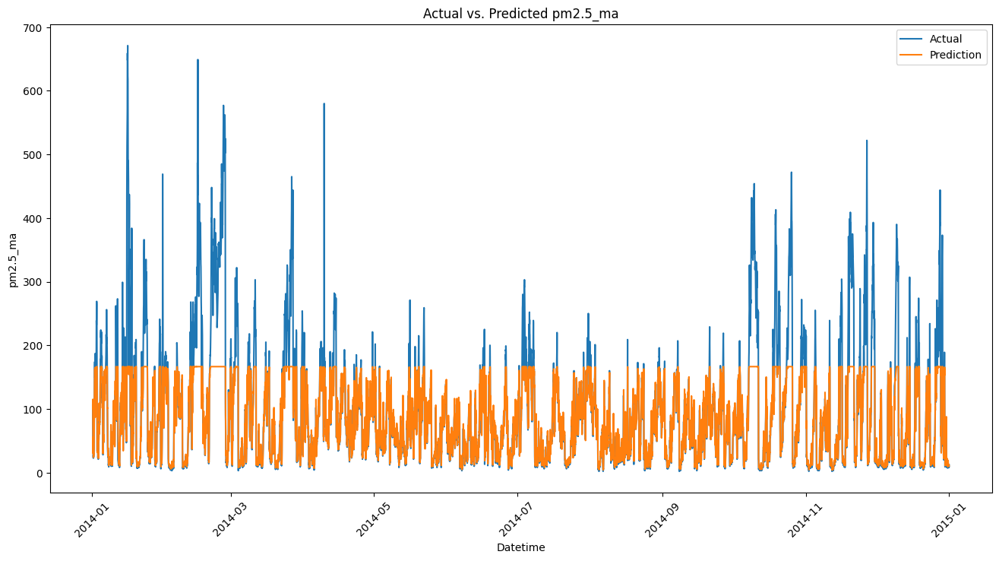

In [150]:
# Plot
import seaborn as sns
import matplotlib.pyplot as plt

# Extract pm2.5 values from df_test
pm25_actual = test_df[6:]['pm2.5_ma'].values

# Plotting the actual and predicted values
plt.figure(figsize=(16, 8))
plt.plot(test_df[6:].index, pm25_actual, label='Actual')
plt.plot(test_df[6:].index, prediction_lstm, label='Prediction')
plt.xlabel('Datetime')
plt.ylabel('pm2.5_ma')
plt.title('Actual vs. Predicted pm2.5_ma')
plt.legend()
plt.xticks(rotation=45)
plt.show()

In [151]:
scores_lstm = {}

# Calculate Mean Squared Error (MSE)
mse = metrics.mean_squared_error(pm25_actual, prediction_lstm)
scores_lstm['MSE'] = mse

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
scores_lstm['RMSE'] = rmse

# Calculate Mean Absolute Error (MAE)
mae = metrics.mean_absolute_error(pm25_actual, prediction_lstm)
scores_lstm['MAE'] = mae

# Calculate R-squared (R^2) score
r2_score = metrics.r2_score(pm25_actual, prediction_lstm)
scores_lstm['R-squared'] = r2_score

# Time taken
scores_lstm['Time'] = execution_time_lstm 

# Print the evaluation dictionary
print("Evaluation Metrics:")
for metric, value in scores_lstm.items():
    print(f"{metric}: {value}")


Evaluation Metrics:
MSE: 3250.187734174922
RMSE: 57.01041776881592
MAE: 25.033026196982803
R-squared: 0.6286384030872143
Time: 71.84037184715271


In [152]:
pm25ma_metrics_list['LSTM'] = scores_lstm

#### 3. ARIMA

/Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


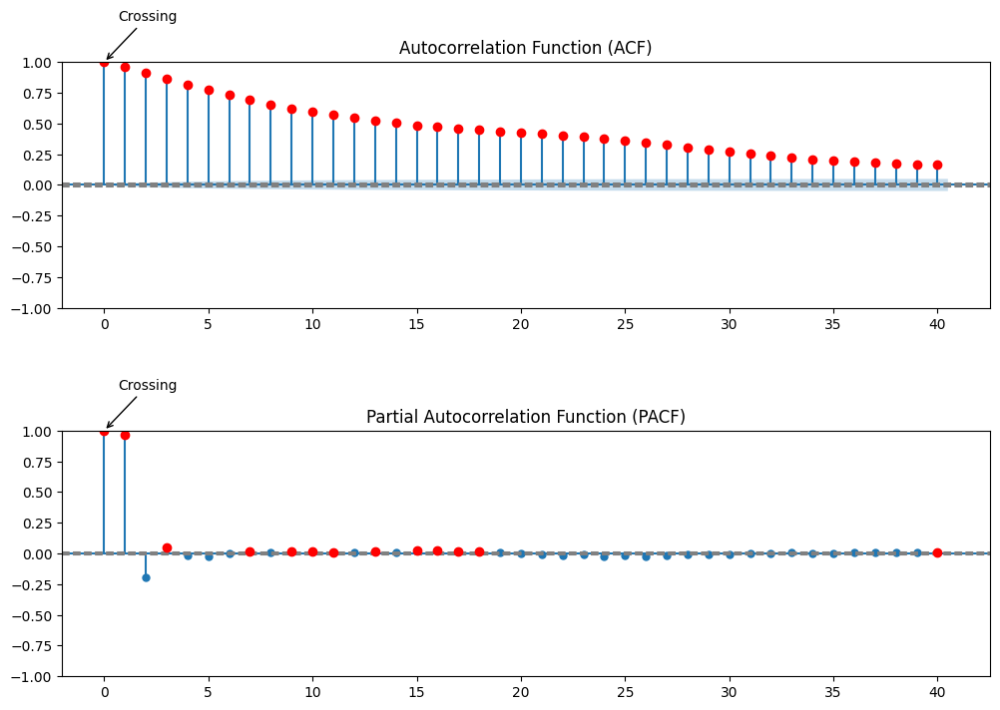

In [48]:
# Calculate ACF and PACF
acf = sm.tsa.stattools.acf(train_df['pm2.5_ma'], nlags=40)
pacf = sm.tsa.stattools.pacf(train_df['pm2.5_ma'], nlags=40)

# Plot ACF and PACF with upper confidence interval
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))

# ACF plot
plot_acf(train_df['pm2.5_ma'], lags=40, ax=ax1)
ax1.axhline(y=0, color='gray', linestyle='--')
ax1.axhline(y=-1.96/np.sqrt(len(train_df['pm2.5_ma'])), color='gray', linestyle='--')
ax1.axhline(y=1.96/np.sqrt(len(train_df['pm2.5_ma'])), color='gray', linestyle='--')
ax1.plot(np.where(acf > 1.96/np.sqrt(len(train_df['pm2.5_ma'])))[0], acf[acf > 1.96/np.sqrt(len(train_df['pm2.5_ma']))], 'ro')
ax1.annotate('Crossing', xy=(np.where(acf > 1.96/np.sqrt(len(train_df['pm2.5_ma'])))[0][0], acf[acf > 1.96/np.sqrt(len(train_df['pm2.5_ma']))][0]),
             xytext=(10, 30), textcoords='offset points', arrowprops=dict(arrowstyle="->"))
ax1.set_title('Autocorrelation Function (ACF)')

# PACF plot
plot_pacf(train_df['pm2.5_ma'], lags=40, ax=ax2)
ax2.axhline(y=0, color='gray', linestyle='--')
ax2.axhline(y=-1.96/np.sqrt(len(train_df['pm2.5_ma'])), color='gray', linestyle='--')
ax2.axhline(y=1.96/np.sqrt(len(train_df['pm2.5_ma'])), color='gray', linestyle='--')
ax2.plot(np.where(pacf > 1.96/np.sqrt(len(train_df['pm2.5_ma'])))[0], pacf[pacf > 1.96/np.sqrt(len(train_df['pm2.5_ma']))], 'ro')
ax2.annotate('Crossing', xy=(np.where(pacf > 1.96/np.sqrt(len(train_df['pm2.5_ma'])))[0][0], pacf[pacf > 1.96/np.sqrt(len(train_df['pm2.5_ma']))][0]),
             xytext=(10, 30), textcoords='offset points', arrowprops=dict(arrowstyle="->"))
ax2.set_title('Partial Autocorrelation Function (PACF)')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Show the plot
plt.show()


p=0<br>
q=0

In [49]:
# Define the time series data
data = train_df['pm2.5_ma']

# Function to check stationarity
def check_stationarity(data):
    result = adfuller(data)
    p_value = result[1]
    return p_value

# Perform differencing until stationarity is achieved
d = 0
while True:
    p_value = check_stationarity(data)
    if p_value < 0.05:
        break
    data = data.diff().dropna()  # Differencing
    d += 1

print("The value of d is:", d)


The value of d is: 0


In [50]:
order=(0,0,0)
train_pm25ma = train_df['pm2.5_ma'].reset_index(drop=True)

# Create and fit the ARIMA model
arima = ARIMA(train_pm25ma, order=order)  # Replace p, d, q with the desired values for the model's order

# Record time taken
start_time = time.time()

arima_fit = arima.fit()

# Generate predictions
predictions = arima_fit.predict(start=len(train_df), end=len(train_df) + len(test_df) - 1)
end_time = time.time()
execution_time_arima = end_time - start_time
print("Time taken:", execution_time_arima, "seconds")

Time taken: 2.7361981868743896 seconds


In [51]:
arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:               pm2.5_ma   No. Observations:                33097
Model:                          ARIMA   Log Likelihood             -196496.630
Date:                Sun, 25 Jun 2023   AIC                         392997.259
Time:                        21:22:07   BIC                         393014.074
Sample:                             0   HQIC                        393002.629
                              - 33097                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         98.8333      0.688    143.564      0.000      97.484     100.183
sigma2      8399.7362     47.611    176.425      0.000    8306.421    8493.052
===================================================================================
Ljung-Box (L1) (Q):               30661.32   Jarque-Bera (JB):             52791.59
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.06   Skew:                             1.81
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.02
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

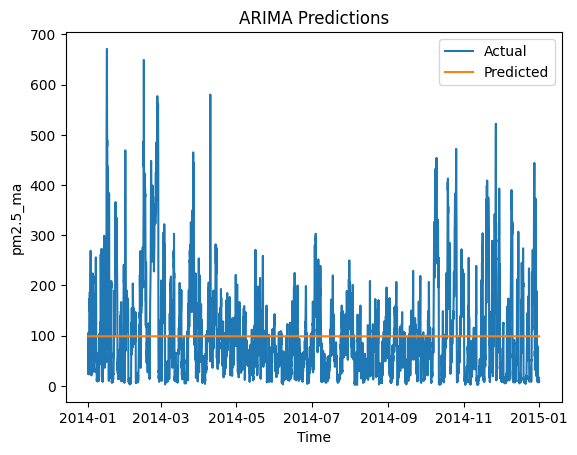

In [52]:
# Calculate evaluation metrics (e.g., mean squared error, mean absolute error)
mse = ((predictions - test_df['pm2.5_ma']) ** 2).mean()
mae = np.abs(predictions - test_df['pm2.5_ma']).mean()

# Visualize the predictions and actual values
plt.plot(test_df.index, test_df['pm2.5_ma'], label='Actual')
plt.plot(test_df.index, predictions, label='Predicted')
plt.xlabel('Time')
plt.ylabel('pm2.5_ma')
plt.title('ARIMA Predictions')
plt.legend()
plt.show()


test

In [53]:
arima_input = train_df['pm2.5_ma']

model_arima = pm.auto_arima(arima_input,seasonal=True)

np.random.seed(42)

In [54]:
# Fit the model
model_arima.fit(arima_input)

ARIMA(order=(1, 0, 1), scoring_args={}, suppress_warnings=True)

In [55]:
# Make a prediction for the next n steps
n_pred = len(test_df.index)
forecast = model_arima.predict(n_periods=n_pred)

/Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


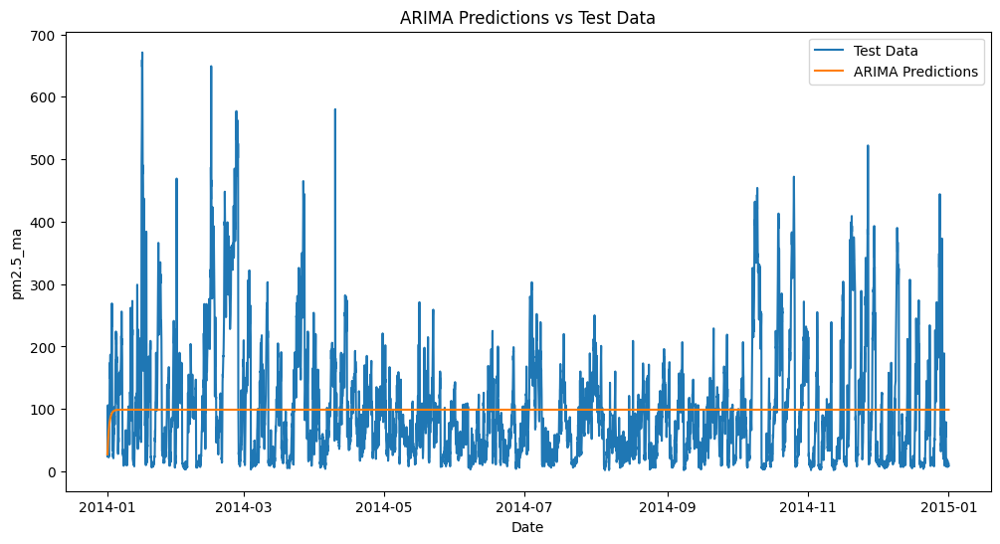

In [56]:
# Plotting the predictions and test data
plt.figure(figsize=(12, 6))
#plt.plot(train_df.index, arima_input, label='Training Data')
plt.plot(test_df.index, test_df['pm2.5_ma'], label='Test Data')
plt.plot(test_df.index, forecast, label='ARIMA Predictions')
plt.xlabel('Date')
plt.ylabel('pm2.5_ma')
plt.title('ARIMA Predictions vs Test Data')
plt.legend()
plt.show()

In [57]:
# Evaluating the model
mse = np.mean((forecast - test_df['pm2.5_ma'][:n_pred])**2)
print('Mean Squared Error (MSE):', mse)
print('Root Mean Squared Error (MSE):', np.sqrt(mse))

Mean Squared Error (MSE): nan
Root Mean Squared Error (MSE): nan


#### 4. 1D-CNN

In [134]:
win_cnn = WindowGenerator(
    lookback=6,
    batch_size=32,
    lookahead=1,
    train_df=train_df['pm2.5_ma'],
    test_df=test_df['pm2.5_ma'],
    label_column=['pm2.5_ma'])
print(win_cnn)

train_cnn = win_cnn.train
test_cnn = win_cnn.test

Total window size: 7
Lookback indices: [0 1 2 3 4 5]
Label index: [6]
Label name: ['pm2.5_ma']


In [135]:
i = 0
# Iterate over the train dataset
for inputs, labels in train_cnn:
    while i < 5:
        print(i)
        # Process your training data here
        print(f"inputs (batch_size, lookback, num_features): {inputs.shape} ")
        # print(inputs)
        # inputs will have shape: (32, 6, 1)

        print(f"labels (batch_size, lookahead, num_features): {labels.shape} ")
        # print(labels)
        i += 1
        # labels will have shape: (32, 1, 1)

0
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
1
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
2
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
3
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
4
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 


In [136]:
input_shape=(32,6,1)
cnn = CNNModel(input_shape)

In [137]:
# Record time taken
start_time = time.time()

cnn.fit(train_cnn,epochs=10)
prediction_cnn = cnn.predict(test_cnn)
end_time = time.time()
execution_time_1d = end_time - start_time
print("Time taken:", execution_time_1d, "seconds")

Epoch 1/10
1035/1035 [==============================] - 5s 5ms/step - loss: 2230.6174 - mean_absolute_error: 27.3125
Epoch 2/10
1035/1035 [==============================] - 5s 5ms/step - loss: 1808.8461 - mean_absolute_error: 23.9180
Epoch 3/10
1035/1035 [==============================] - 5s 5ms/step - loss: 1786.0883 - mean_absolute_error: 23.8245
Epoch 4/10
1035/1035 [==============================] - 5s 5ms/step - loss: 1778.4857 - mean_absolute_error: 23.9568
Epoch 5/10
1035/1035 [==============================] - 5s 5ms/step - loss: 1776.2224 - mean_absolute_error: 24.0999
Epoch 6/10
1035/1035 [==============================] - 5s 5ms/step - loss: 1775.5093 - mean_absolute_error: 24.2107
Epoch 7/10
1035/1035 [==============================] - 5s 5ms/step - loss: 1775.2249 - mean_absolute_error: 24.2888
Epoch 8/10
1035/1035 [==============================] - 5s 5ms/step - loss: 1774.9745 - mean_absolute_error: 24.3411
Epoch 9/10
1035/1035 [==============================] - 5s 5ms/s

In [138]:
mse_c, mae_c =  cnn.evaluate(test_cnn)
print("Test Mean Squared Error (RMSE):", np.sqrt(mse_c))
print("Test Mean Absolute Error (MAE):", mae_c)

Test Mean Squared Error (RMSE): 37.45802012232327
Test Mean Absolute Error (MAE): 22.48822021484375


In [139]:
print(prediction_cnn)

[[[ 71.616325]
  [ 74.25311 ]
  [ 83.02732 ]
  [ 95.429665]]

 [[ 74.25311 ]
  [ 83.02732 ]
  [ 95.429665]
  [108.02562 ]]

 [[ 83.02732 ]
  [ 95.429665]
  [108.02562 ]
  [ 70.43163 ]]

 ...

 [[ 19.475826]
  [ 20.394861]
  [ 17.946663]
  [ 20.595036]]

 [[ 20.394861]
  [ 17.946663]
  [ 20.595036]
  [ 20.175476]]

 [[ 17.946663]
  [ 20.595036]
  [ 20.175476]
  [ 17.937057]]]


In [140]:
print(len(prediction_cnn))
print(len(test_df['pm2.5_ma']))
print(prediction_cnn.shape)

8655
8661
(8655, 4, 1)


[81.081604, 90.18393, 89.22856, 83.03045, 67.803566, 55.832916, 47.062943, 39.844402, 40.4803, 33.071373, 32.39988, 33.7381, 33.03797, 34.25006, 39.30609, 48.24083, 58.42635, 70.90628, 86.70215, 105.589745, 128.6691, 148.78577, 160.92111, 165.00966, 157.49722, 156.36255, 160.45796, 141.73312, 135.5579, 121.54442, 101.23051, 102.70295, 107.171455, 111.20308, 117.45189, 130.13248, 137.81409, 148.92267, 164.7846, 186.79291, 200.1171, 215.35968, 231.942, 234.65265, 229.77496, 203.74261, 143.84756, 93.16489, 55.024853, 37.706364, 46.186775, 48.432327, 48.194492, 45.621426, 40.56463, 36.689964, 35.783432, 33.436577, 33.447052, 33.58076, 34.14037, 38.746487, 44.74431, 50.267338, 59.09996, 61.72641, 76.517, 83.05894, 85.99563, 92.968956, 84.12276, 83.25992, 80.709724, 78.83564, 81.85228, 86.3735, 92.57706, 105.53265, 121.20404, 139.04169, 155.9626, 163.75772, 176.69397, 186.27731, 196.38033, 203.73334, 204.9772, 204.78738, 202.70706, 200.58957, 201.1, 193.07701, 185.23593, 179.40314, 168.81487

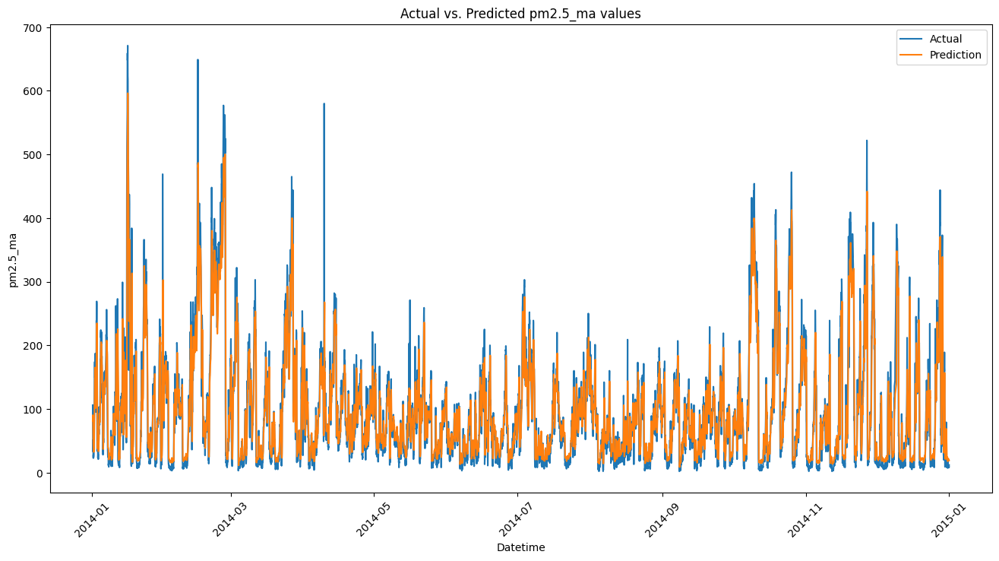

In [141]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extract rain values from test_df
pm25_actual = test_df[6:]['pm2.5_ma'].values
pred_1d = []
for pred in prediction_cnn:
    pred_arr = np.array(pred)
    pred_mean = pred_arr.mean()
    pred_1d.append(pred_mean)

print(pred_1d)

# Plotting the actual and predicted values
plt.figure(figsize=(16, 8))
plt.plot(test_df[6:].index, pm25_actual, label='Actual')
plt.plot(test_df[6:].index, pred_1d, label='Prediction')
plt.xlabel('Datetime')
plt.ylabel('pm2.5_ma')
plt.title('Actual vs. Predicted pm2.5_ma values')
plt.legend()
plt.xticks(rotation=45)
plt.show()

In [142]:
scores_1d = {}

# Calculate Mean Squared Error (MSE)
mse = metrics.mean_squared_error(pm25_actual, pred_1d)
scores_1d['MSE'] = mse

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
scores_1d['RMSE'] = rmse

# Calculate Mean Absolute Error (MAE)
mae = metrics.mean_absolute_error(pm25_actual, pred_1d)
scores_1d['MAE'] = mae

# Calculate R-squared (R^2) score
r2_score = metrics.r2_score(pm25_actual, pred_1d)
scores_1d['R-squared'] = r2_score

# Time taken
scores_1d['Time'] = execution_time_1d

# Print the evaluation dictionary
print("Evaluation Metrics:")
for metric, value in scores_1d.items():
    print(f"{metric}: {value}")


Evaluation Metrics:
MSE: 1048.2489021421343
RMSE: 32.37667219067047
MAE: 20.65446586785187
R-squared: 0.8802286458199319
Time: 49.6887412071228


In [143]:
pm25ma_metrics_list['1D_CNN'] = scores_1d

#### Time results

In [68]:
execution_times = {
    'HMM': execution_time_hmm,
    'LSTM': execution_time_lstm,
    'ARIMA': execution_time_arima,
    '1D-CNN': execution_time_1d
}

print("Execution Time Summary:")
for model, timing in execution_times.items():
    print(f"{model}: {timing} seconds")

Execution Time Summary:
HMM: 0.9336428642272949 seconds
LSTM: 70.38800096511841 seconds
ARIMA: 2.7361981868743896 seconds
1D-CNN: 51.075916051864624 seconds


#### 5. Overall results

In [153]:
print(pm25ma_metrics_list)

{'1D_CNN': {'MSE': 1048.2489021421343, 'RMSE': 32.37667219067047, 'MAE': 20.65446586785187, 'R-squared': 0.8802286458199319, 'Time': 49.6887412071228}, 'HMM': {'MSE': 14278.61233521431, 'RMSE': 119.49314764962178, 'MAE': 86.63993968679473, 'R-squared': -0.6323755835563016, 'Time': 0.9626257419586182}, 'LSTM': {'MSE': 3250.187734174922, 'RMSE': 57.01041776881592, 'MAE': 25.033026196982803, 'R-squared': 0.6286384030872143, 'Time': 71.84037184715271}}


1D_CNN
{'RMSE': 32.37667219067047, 'MAE': 20.65446586785187, 'R-squared': 0.8802286458199319, 'Time': 49.6887412071228}
HMM
{'RMSE': 119.49314764962178, 'MAE': 86.63993968679473, 'R-squared': -0.6323755835563016, 'Time': 0.9626257419586182}
LSTM
{'RMSE': 57.01041776881592, 'MAE': 25.033026196982803, 'R-squared': 0.6286384030872143, 'Time': 71.84037184715271}


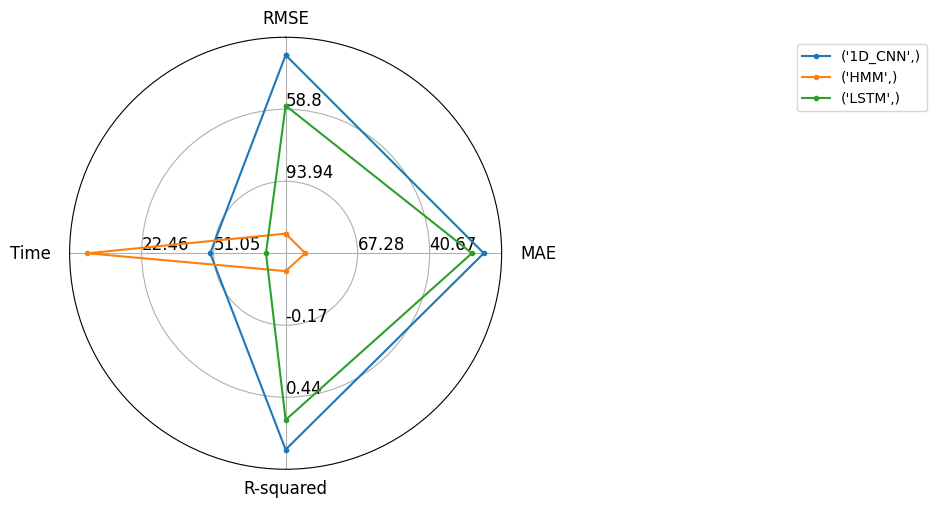

In [154]:
model_names = []
metrics_list = []
plot_pm25ma = pm25ma_metrics_list

for model_name, metric in plot_pm25ma.items():
        model_names.append(model_name)
        if 'MSE' in metric:
            del metric['MSE']
        metrics_list.append(metric)
        print(model_name)
        print(metric)
        

plot = radar_plot(data=metrics_list, model_names=model_names,invert_range=['Time','RMSE','MAE'])
# plot = radar_plot(data=metrics, model_names=model_names)

# Set the origin of each plot to 0 by modifying the axis limits
#for ax in plot.axes:
    #ax.set_ylim(bottom=0, top = 1.0)
    #if plot.var_names[i] == 'MSE':


# plt.title('Encoder-only model multiclass classification performance comparison')
plt.show()

`Regressive Data : 'log_pm2.5'`<br>

#### 1. Hidden Markov Model

###### Iterate from 1 to 30 hidden states(hidden)

1
Test MSE: 2.2111809087979992


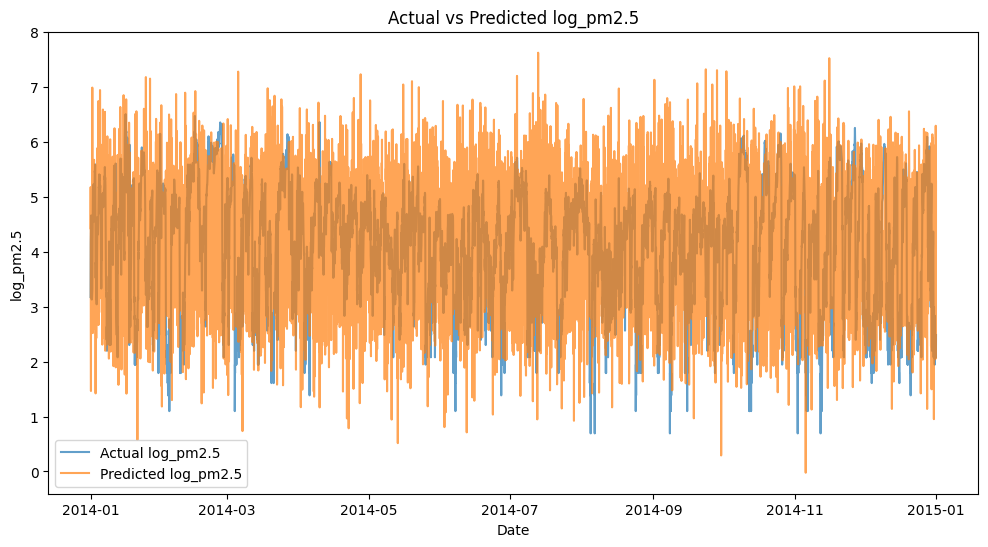

Evaluation Metrics:
MSE: 2.2111809087979992
RMSE: 1.4870040042979034
MAE: 1.1910114344075196
R-squared: -0.9457873981968554
2
Test MSE: 2.187196939825283


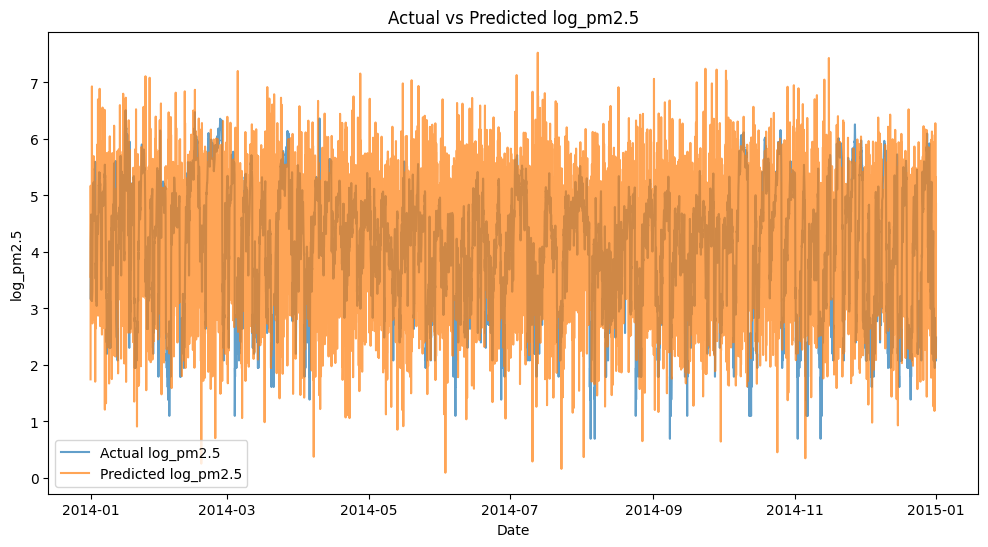

Evaluation Metrics:
MSE: 2.187196939825283
RMSE: 1.4789174891877108
MAE: 1.185221398084492
R-squared: -0.9246820673755867
3
Test MSE: 2.2346354353130162


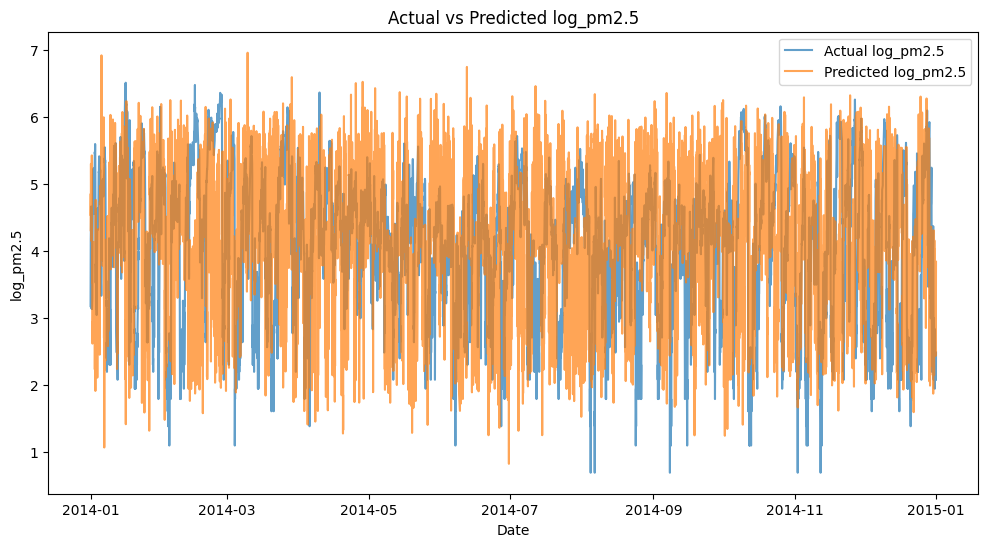

Evaluation Metrics:
MSE: 2.2346354353130162
RMSE: 1.4948697051291848
MAE: 1.2039686107030514
R-squared: -0.9664268320586478
4
Test MSE: 2.306192681869695


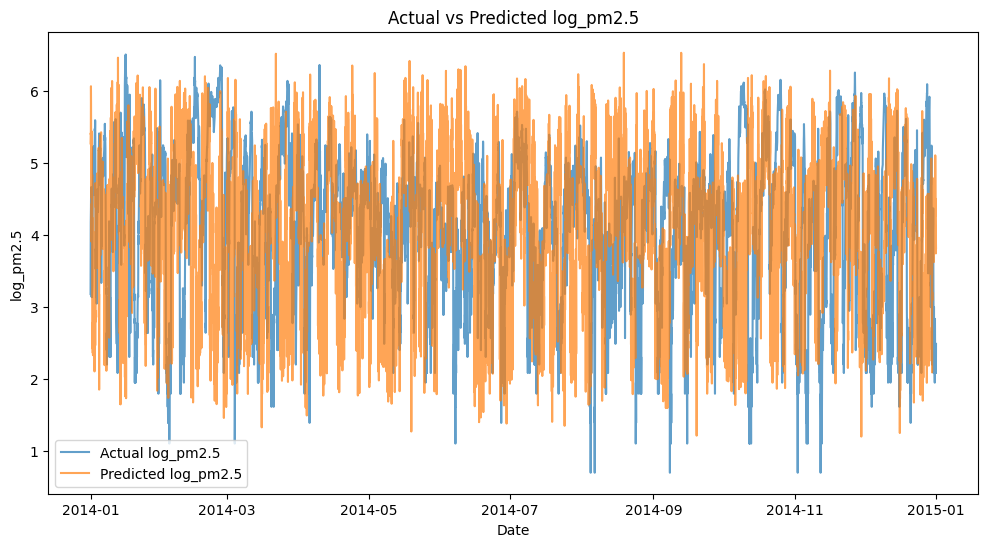

Evaluation Metrics:
MSE: 2.306192681869695
RMSE: 1.5186153831269111
MAE: 1.23282508687014
R-squared: -1.0293955326501067
5
Test MSE: 2.202842358358889


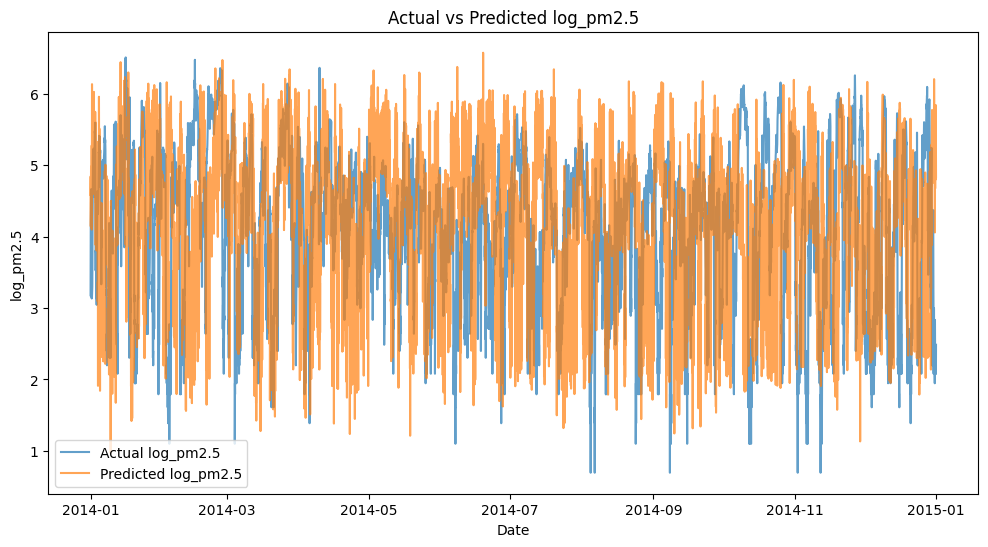

Evaluation Metrics:
MSE: 2.202842358358889
RMSE: 1.4841975469454494
MAE: 1.2052033204238604
R-squared: -0.938449669158453
6
Test MSE: 2.227112373200333


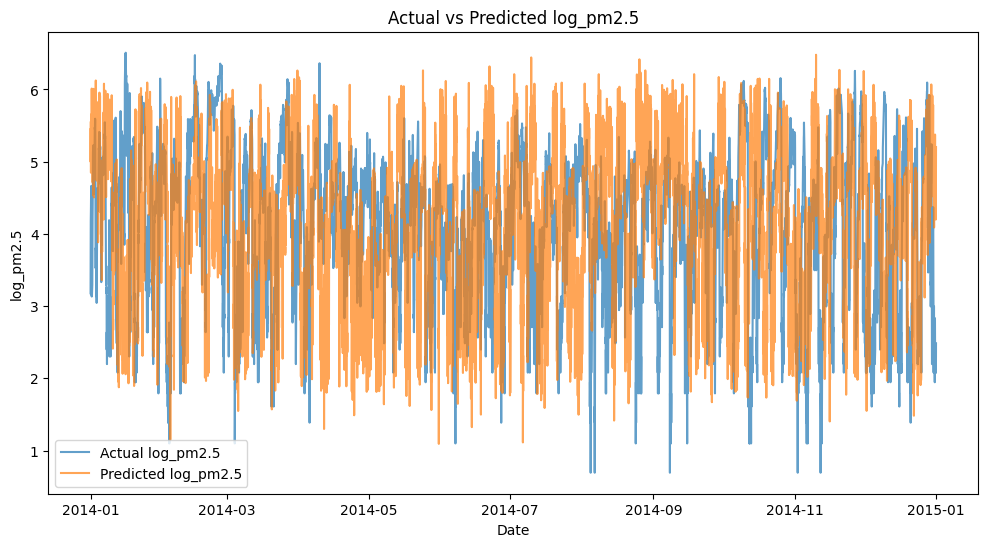

Evaluation Metrics:
MSE: 2.227112373200333
RMSE: 1.4923512901459672
MAE: 1.2091882273830694
R-squared: -0.959806713642978
7
Test MSE: 2.0808986251595223


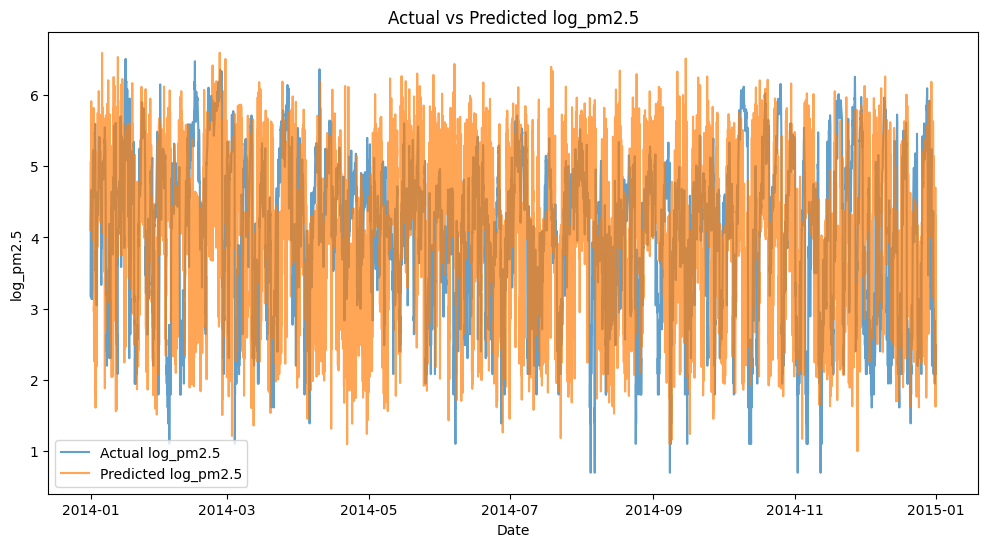

Evaluation Metrics:
MSE: 2.0808986251595223
RMSE: 1.4425320187640627
MAE: 1.1552501525688084
R-squared: -0.8311420407304415
8
Test MSE: 2.03068815334841


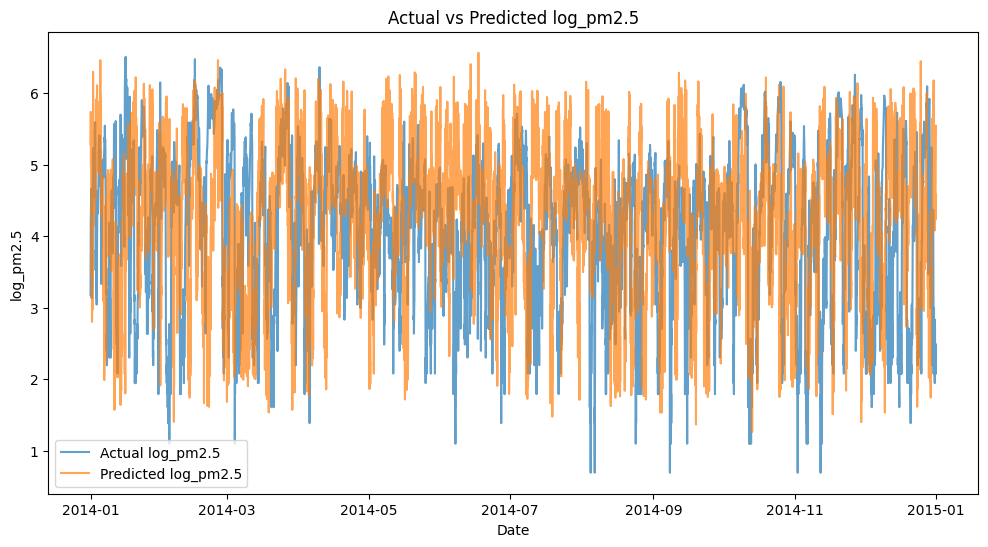

Evaluation Metrics:
MSE: 2.03068815334841
RMSE: 1.425022158897331
MAE: 1.1257550598748076
R-squared: -0.7869580018221598
9
Test MSE: 2.060439997818983


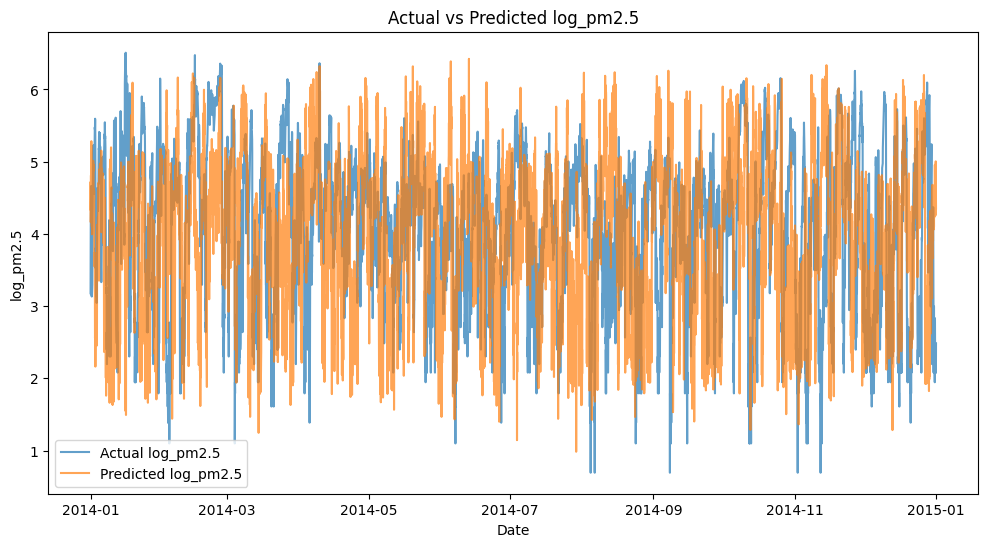

Evaluation Metrics:
MSE: 2.060439997818983
RMSE: 1.4354232817601167
MAE: 1.1635947632653343
R-squared: -0.8131389279569747
10
Test MSE: 2.126456773486096


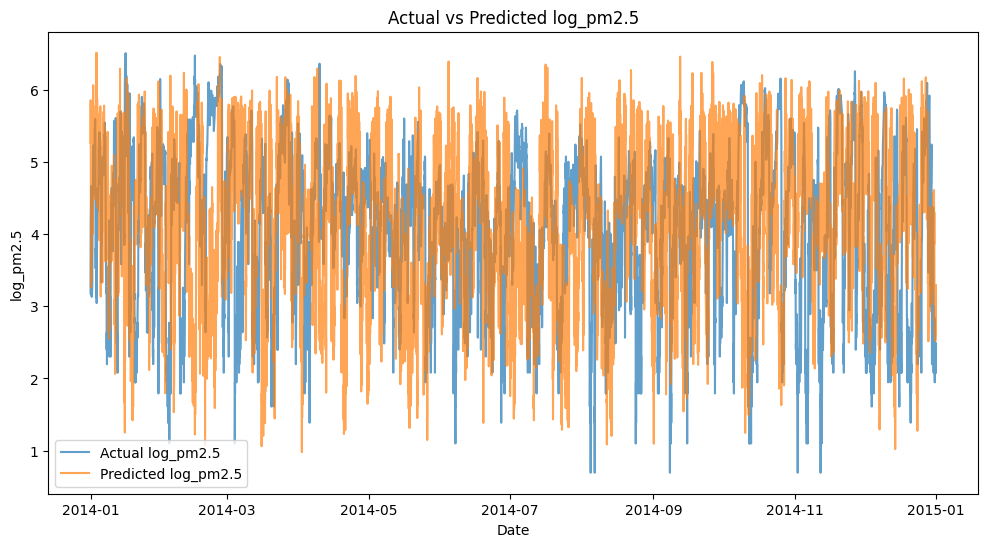

Evaluation Metrics:
MSE: 2.126456773486096
RMSE: 1.4582375572882822
MAE: 1.1620117192319754
R-squared: -0.8712321439627544
11
Test MSE: 2.203749616459199


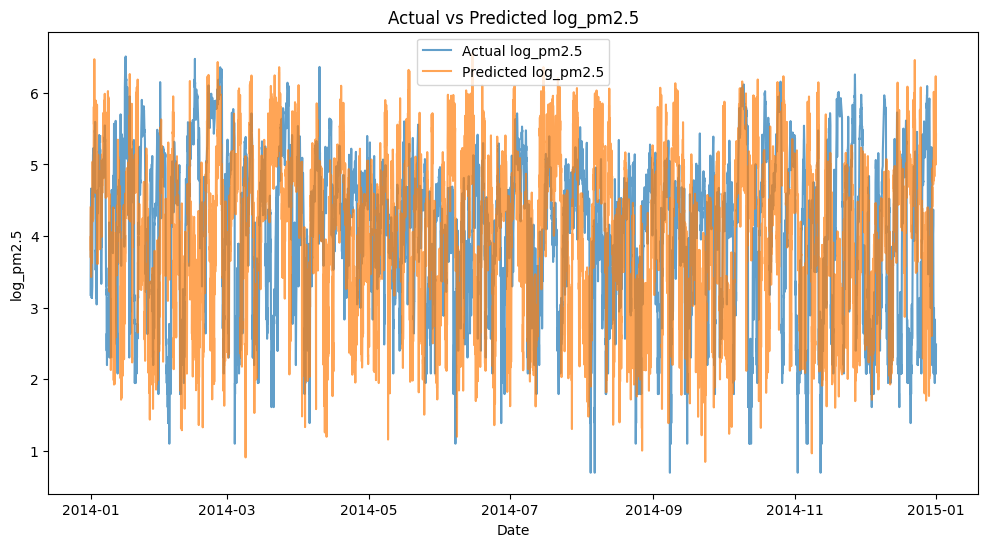

Evaluation Metrics:
MSE: 2.203749616459199
RMSE: 1.4845031547488199
MAE: 1.204526686699826
R-squared: -0.9392480350323034
12
Test MSE: 2.1809474561496587


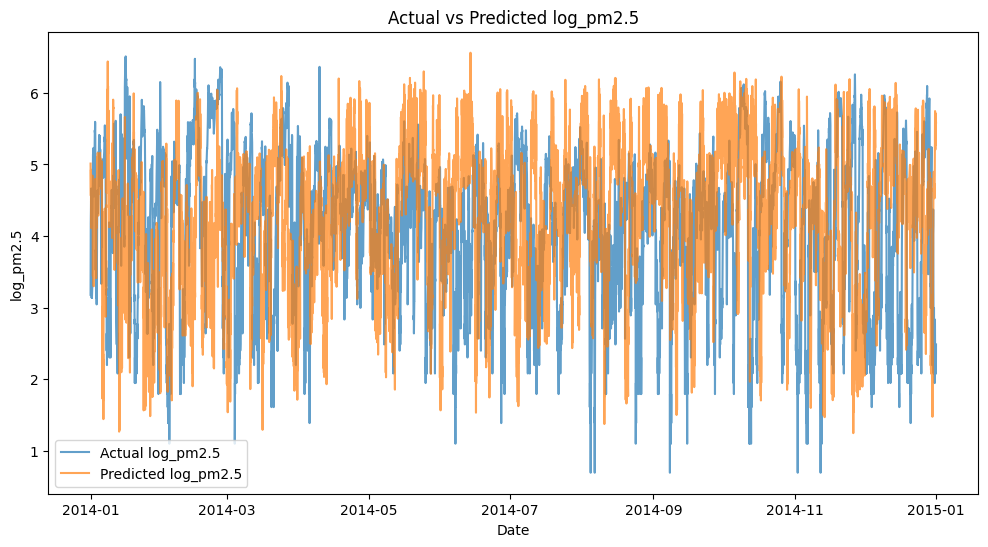

Evaluation Metrics:
MSE: 2.1809474561496587
RMSE: 1.4768031203073952
MAE: 1.189445485510669
R-squared: -0.9191826681482858
13
Test MSE: 2.3040250818533132


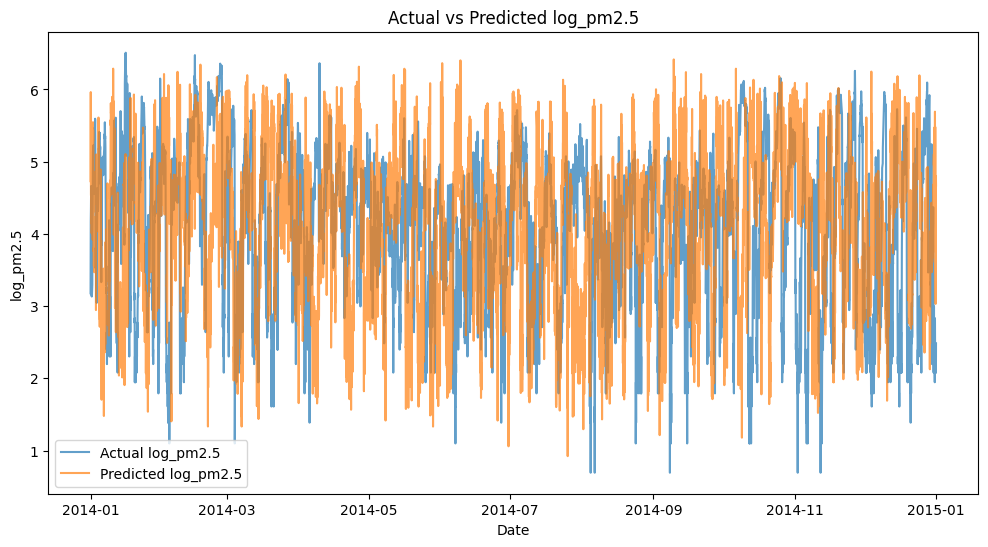

Evaluation Metrics:
MSE: 2.3040250818533132
RMSE: 1.5179015389192123
MAE: 1.2235615327042881
R-squared: -1.0274880954162624
14
Test MSE: 2.067860590404493


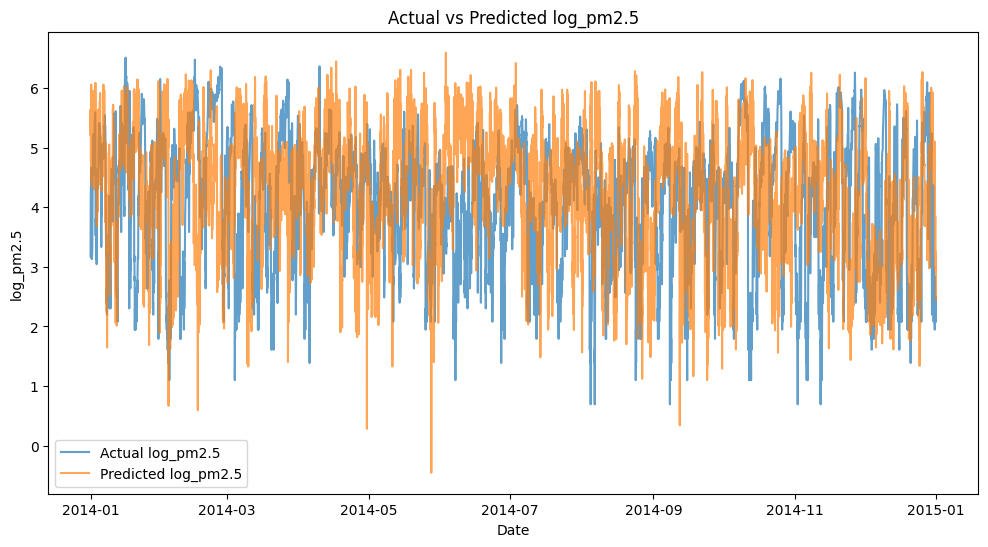

Evaluation Metrics:
MSE: 2.067860590404493
RMSE: 1.4380057685574468
MAE: 1.14604392351641
R-squared: -0.8196688755892956
15


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:4                                                                                    │
│                                                                                                  │
│    1 compiled_results=[]                                                                         │
│    2 for i in range(1,30):                                                                       │
│    3 │   print(i)                                                                                │
│ ❱  4 │   result = run_hmm(train_df, test_df, model_type='gaussian', n_states=i, feat='log_pm2    │
│    5 │   compiled_results.append(result)                                                         │
│    6                                                                                             │
│    7 min_mse = min(compiled_results)                                                             │
│                                                                                                  │
│ in run_hmm:55                                                                                    │
│                                                                                                  │
│    52 │   start_time_hmm = time.time()                                                           │
│    53 │                                                                                          │
│    54 │   # Train the HMM model                                                                  │
│ ❱  55 │   model.fit(train_data)                                                                  │
│    56 │                                                                                          │
│    57 │   # Predict the test data values                                                         │
│    58 │   predictions = model.sample(len(test_data))[0]                                          │
│                                                                                                  │
│ /Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/hmmlearn/base.py:473 in  │
│ fit                                                                                              │
│                                                                                                  │
│    470 │   │   self.monitor_._reset()                                                            │
│    471 │   │                                                                                     │
│    472 │   │   for iter in range(self.n_iter):                                                   │
│ ❱  473 │   │   │   stats, curr_logprob = self._do_estep(X, lengths)                              │
│    474 │   │   │                                                                                 │
│    475 │   │   │   # Compute lower bound before updating model parameters                        │
│    476 │   │   │   lower_bound = self._compute_lower_bound(curr_logprob)                         │
│                                                                                                  │
│ /Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/hmmlearn/base.py:750 in  │
│ _do_estep                                                                                        │
│                                                                                                  │
│    747 │   │   self._estep_begin()                                                               │
│    748 │   │   curr_logprob = 0                                                                  │
│    749 │   │   for sub_X in _utils.split_X_lengths(X, lengths):                                  │
│ ❱  750 │   │   │   lattice, logprob, posteriors, fwdlattice, bwdlattice = impl(sub_X)            │
│    751 │   │   │   # Derived HMM classes will implement the

In [71]:
compiled_results=[]
for i in range(1,30):
    print(i)
    result = run_hmm(train_df, test_df, model_type='gaussian', n_states=i, feat='log_pm2.5')
    compiled_results.append(result)

min_mse = min(compiled_results)
min_n_states = compiled_results.index(min_mse) + 1
print("Minimum MSE:", min_mse)
print("Corresponding No. of Hidden States:", min_n_states)


##### Best Hidden Markov

Minimum MSE: 1.8804980272392073<br>
Corresponding No. of Hidden States: 21

Test MSE: 1.880498027242811


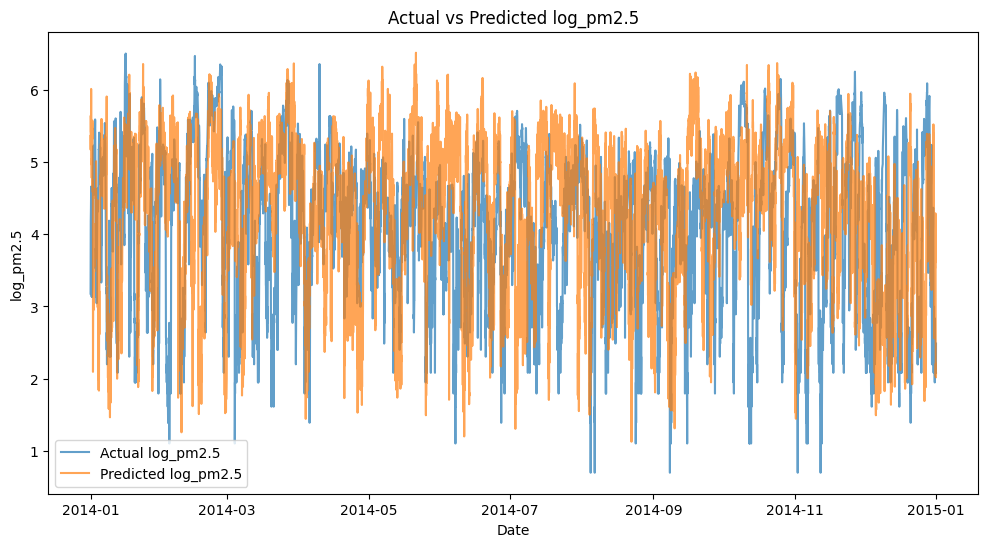

Evaluation Metrics:
MSE: 1.880498027242811
RMSE: 1.3713125199030347
MAE: 1.0955330992504384
R-squared: -0.6547942093675965


In [155]:
min_n_states = 21
result, execution_time_hmm, scores_hmm = run_hmm(train_df, test_df, model_type='gaussian', n_states=min_n_states, feat='log_pm2.5')

In [156]:
print("Time taken:", execution_time_hmm, "seconds")
scores_hmm['Time'] = execution_time_hmm
logpm25_metrics_list['HMM'] = scores_hmm

Time taken: 4.242828130722046 seconds


#### 2. LSTM

In [157]:
# Feature Engineering
win_alt = WindowGenerator(lookback=6,
                          lookahead=1,
                          batch_size=32,
                          train_df=train_df['log_pm2.5'],
                          test_df=test_df['log_pm2.5'],
                          label_column=['log_pm2.5']
                          )

train_data = win_alt.train
test_data = win_alt.test

In [158]:
i = 0
# Iterate over the train dataset
for inputs, labels in train_data:
    while i < 5:
        print(i)
        # Process your training data here
        print(f"inputs (batch_size, lookback, num_features): {inputs.shape} ")
        # print(inputs)
        # inputs will have shape: (32, 6, 1)

        print(f"labels (batch_size, lookahead, num_features): {labels.shape} ")
        # print(labels)
        i += 1
        # labels will have shape: (32, 1, 1)

0
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
1
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
2
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
3
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
4
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 


In [159]:
input_shape = (6,1)

# Train
np.random.seed(42)
lstm = LSTMModel(input_shape)

# Record time taken
start_time = time. time()

lstm.compile_and_fit(train_data, epochs=10, )

# Predict
prediction_lstm = lstm.predict(test_data)
end_time = time.time()
execution_time_lstm = end_time - start_time
print ("Time taken:", execution_time_lstm, "seconds")

# Evaluate
results = lstm.evaluate(test_data, verbose = 1)

Epoch 1/10
1035/1035 [==============================] - 8s 7ms/step - loss: 0.6423 - mae: 0.4620
Epoch 2/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.1083 - mae: 0.2241
Epoch 3/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0901 - mae: 0.1996
Epoch 4/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0851 - mae: 0.1915
Epoch 5/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0839 - mae: 0.1895
Epoch 6/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0831 - mae: 0.1885
Epoch 7/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0826 - mae: 0.1879
Epoch 8/10
1035/1035 [==============================] - 7s 7ms/step - loss: 0.0823 - mae: 0.1876
Epoch 9/10
1035/1035 [==============================] - 7s 6ms/step - loss: 0.0821 - mae: 0.1873
Epoch 10/10
271/271 [==============================] - 1s 2ms/step
Time taken: 69.85838484764099 seconds
271/271 [=============

In [160]:
mse = results[0]
mae = results[1]

print('Root Mean Squared Error: ', np.sqrt(mse))
print('Mean Absolute Error: ', mae)

Root Mean Squared Error:  0.2747736709323449
Mean Absolute Error:  0.17468729615211487


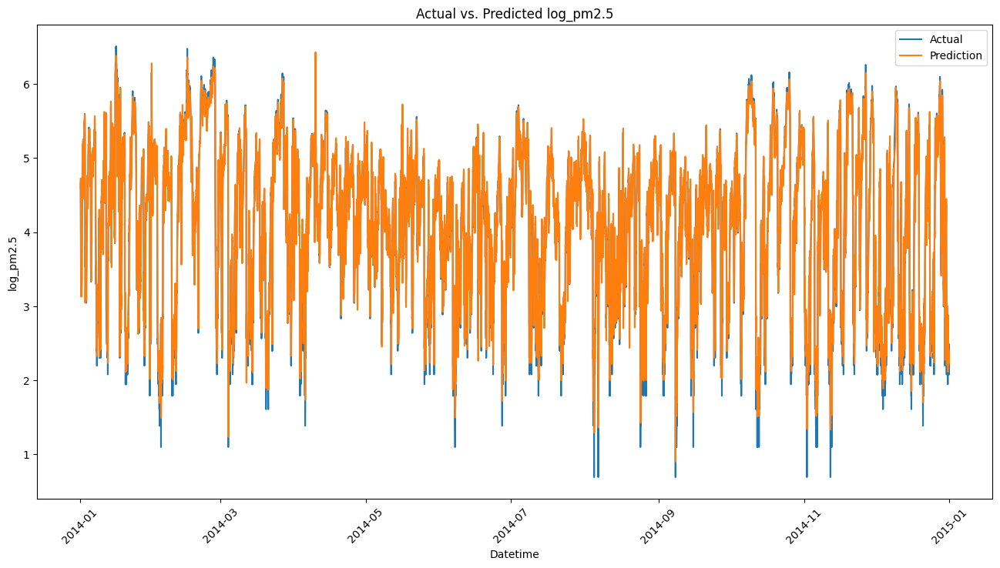

In [161]:
# Plot
import seaborn as sns
import matplotlib.pyplot as plt

# Extract pm2.5 values from df_test
pm25_actual = test_df[6:]['log_pm2.5'].values

# Plotting the actual and predicted values
plt.figure(figsize=(16, 8))
plt.plot(test_df[6:].index, pm25_actual, label='Actual')
plt.plot(test_df[6:].index, prediction_lstm, label='Prediction')
plt.xlabel('Datetime')
plt.ylabel('log_pm2.5')
plt.title('Actual vs. Predicted log_pm2.5')
plt.legend()
plt.xticks(rotation=45)
plt.show()

In [162]:
scores_lstm = {}

# Calculate Mean Squared Error (MSE)
mse = metrics.mean_squared_error(pm25_actual, prediction_lstm)
scores_lstm['MSE'] = mse

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
scores_lstm['RMSE'] = rmse

# Calculate Mean Absolute Error (MAE)
mae = metrics.mean_absolute_error(pm25_actual, prediction_lstm)
scores_lstm['MAE'] = mae

# Calculate R-squared (R^2) score
r2_score = metrics.r2_score(pm25_actual, prediction_lstm)
scores_lstm['R-squared'] = r2_score

# Time taken
scores_lstm['Time'] = execution_time_lstm 

# Print the evaluation dictionary
print("Evaluation Metrics:")
for metric, value in scores_lstm.items():
    print(f"{metric}: {value}")


Evaluation Metrics:
MSE: 0.07550056862617442
RMSE: 0.27477366800000036
MAE: 0.1746872585622811
R-squared: 0.9335995622598925
Time: 69.85838484764099


In [163]:
logpm25_metrics_list['LSTM'] = scores_lstm

#### 3. ARIMA

/Users/zhihaoong/anaconda3/envs/ZH_AIAP_ENV/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


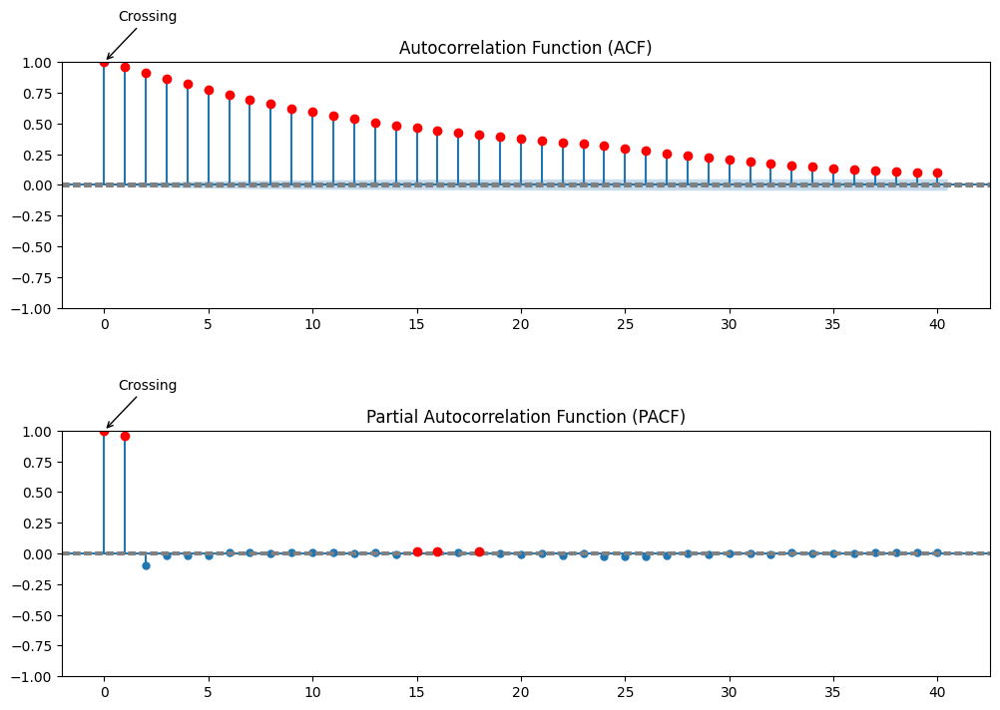

In [164]:
# Calculate ACF and PACF
acf = sm.tsa.stattools.acf(train_df['log_pm2.5'], nlags=40)
pacf = sm.tsa.stattools.pacf(train_df['log_pm2.5'], nlags=40)

# Plot ACF and PACF with upper confidence interval
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))

# ACF plot
plot_acf(train_df['log_pm2.5'], lags=40, ax=ax1)
ax1.axhline(y=0, color='gray', linestyle='--')
ax1.axhline(y=-1.96/np.sqrt(len(train_df['log_pm2.5'])), color='gray', linestyle='--')
ax1.axhline(y=1.96/np.sqrt(len(train_df['log_pm2.5'])), color='gray', linestyle='--')
ax1.plot(np.where(acf > 1.96/np.sqrt(len(train_df['log_pm2.5'])))[0], acf[acf > 1.96/np.sqrt(len(train_df['log_pm2.5']))], 'ro')
ax1.annotate('Crossing', xy=(np.where(acf > 1.96/np.sqrt(len(train_df['log_pm2.5'])))[0][0], acf[acf > 1.96/np.sqrt(len(train_df['log_pm2.5']))][0]),
             xytext=(10, 30), textcoords='offset points', arrowprops=dict(arrowstyle="->"))
ax1.set_title('Autocorrelation Function (ACF)')

# PACF plot
plot_pacf(train_df['log_pm2.5'], lags=40, ax=ax2)
ax2.axhline(y=0, color='gray', linestyle='--')
ax2.axhline(y=-1.96/np.sqrt(len(train_df['log_pm2.5'])), color='gray', linestyle='--')
ax2.axhline(y=1.96/np.sqrt(len(train_df['log_pm2.5'])), color='gray', linestyle='--')
ax2.plot(np.where(pacf > 1.96/np.sqrt(len(train_df['log_pm2.5'])))[0], pacf[pacf > 1.96/np.sqrt(len(train_df['log_pm2.5']))], 'ro')
ax2.annotate('Crossing', xy=(np.where(pacf > 1.96/np.sqrt(len(train_df['log_pm2.5'])))[0][0], pacf[pacf > 1.96/np.sqrt(len(train_df['log_pm2.5']))][0]),
             xytext=(10, 30), textcoords='offset points', arrowprops=dict(arrowstyle="->"))
ax2.set_title('Partial Autocorrelation Function (PACF)')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Show the plot
plt.show()


p=0<br>
q=0

In [165]:
# Define the time series data
data = train_df['log_pm2.5']

# Function to check stationarity
def check_stationarity(data):
    result = adfuller(data)
    p_value = result[1]
    return p_value

# Perform differencing until stationarity is achieved
d = 0
while True:
    p_value = check_stationarity(data)
    if p_value < 0.05:
        break
    data = data.diff().dropna()  # Differencing
    d += 1

print("The value of d is:", d)


The value of d is: 0


In [166]:
order=(0,0,0)
train_logpm25 = train_df['log_pm2.5'].reset_index(drop=True)

# Create and fit the ARIMA model
arima = ARIMA(train_logpm25, order=order)  # Replace p, d, q with the desired values for the model's order

# Record time taken
start_time = time.time()
arima_fit = arima.fit()

# Generate predictions
predictions = arima_fit.predict(start=len(train_df), end=len(train_df) + len(test_df) - 1)
end_time = time.time()
execution_time_arima = end_time - start_time
print("Time taken:", execution_time_arima, "seconds")

Time taken: 2.125771999359131 seconds


In [167]:
arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              log_pm2.5   No. Observations:                33097
Model:                          ARIMA   Log Likelihood              -47788.455
Date:                Mon, 26 Jun 2023   AIC                          95580.909
Time:                        10:10:31   BIC                          95597.723
Sample:                             0   HQIC                         95586.279
                              - 33097                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.1438      0.006    703.641      0.000       4.132       4.155
sigma2         1.0512      0.010    103.598      0.000       1.031       1.071
===================================================================================
Ljung-Box (L1) (Q):               30442.16   Jarque-Bera (JB):              1127.78
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.12   Skew:                            -0.35
Prob(H) (two-sided):                  0.00   Kurtosis:                         2.42
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

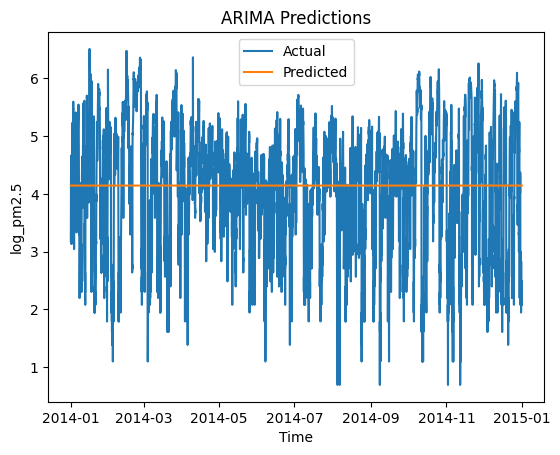

In [168]:
# Calculate evaluation metrics (e.g., mean squared error, mean absolute error)
mse = ((predictions - test_df['log_pm2.5']) ** 2).mean()
mae = np.abs(predictions - test_df['log_pm2.5']).mean()

# Visualize the predictions and actual values
plt.plot(test_df.index, test_df['log_pm2.5'], label='Actual')
plt.plot(test_df.index, predictions, label='Predicted')
plt.xlabel('Time')
plt.ylabel('log_pm2.5')
plt.title('ARIMA Predictions')
plt.legend()
plt.show()


#### 4. 1D-CNN

In [169]:
win_cnn = WindowGenerator(
    lookback=6,
    batch_size=32,
    lookahead=1,
    train_df=train_df['log_pm2.5'],
    test_df=test_df['log_pm2.5'],
    label_column=['log_pm2.5'])
print(win_cnn)

train_cnn = win_cnn.train
test_cnn = win_cnn.test

Total window size: 7
Lookback indices: [0 1 2 3 4 5]
Label index: [6]
Label name: ['log_pm2.5']


In [170]:
i = 0
# Iterate over the train dataset
for inputs, labels in train_cnn:
    while i < 5:
        print(i)
        # Process your training data here
        print(f"inputs (batch_size, lookback, num_features): {inputs.shape} ")
        # print(inputs)
        # inputs will have shape: (32, 6, 1)

        print(f"labels (batch_size, lookahead, num_features): {labels.shape} ")
        # print(labels)
        i += 1
        # labels will have shape: (32, 1, 1)

0
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
1
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
2
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
3
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 
4
inputs (batch_size, lookback, num_features): (32, 6, 1) 
labels (batch_size, lookahead, num_features): (32, 1, 1) 


In [171]:
input_shape=(32,6,1)
cnn = CNNModel(input_shape)

In [172]:
# Record time taken
start_time = time.time()

cnn.fit(train_cnn,epochs=10)
prediction_cnn = cnn.predict(test_cnn)

end_time = time.time()
execution_time_1d = end_time - start_time
print("Time taken:", execution_time_1d, "seconds")

Epoch 1/10
1035/1035 [==============================] - 6s 5ms/step - loss: 0.2836 - mean_absolute_error: 0.3555
Epoch 2/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.2289 - mean_absolute_error: 0.3269
Epoch 3/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.2261 - mean_absolute_error: 0.3247
Epoch 4/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.2249 - mean_absolute_error: 0.3235
Epoch 5/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.2243 - mean_absolute_error: 0.3228
Epoch 6/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.2240 - mean_absolute_error: 0.3224
Epoch 7/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.2238 - mean_absolute_error: 0.3221
Epoch 8/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.2236 - mean_absolute_error: 0.3219
Epoch 9/10
1035/1035 [==============================] - 5s 5ms/step - loss: 0.2234 - mean_absolu

In [173]:
mse_c, mae_c =  cnn.evaluate(test_cnn)
print("Test Mean Squared Error (RMSE):", np.sqrt(mse_c))
print("Test Mean Absolute Error (MAE):", mae_c)

Test Mean Squared Error (RMSE): 0.46692639712701495
Test Mean Absolute Error (MAE): 0.327841579914093


In [174]:
print(prediction_cnn)

[[[4.189786 ]
  [4.2001367]
  [4.301911 ]
  [4.4404697]]

 [[4.2001367]
  [4.301911 ]
  [4.4404697]
  [4.563745 ]]

 [[4.301911 ]
  [4.4404697]
  [4.563745 ]
  [4.2055125]]

 ...

 [[2.3972523]
  [2.5152266]
  [2.2821286]
  [2.507172 ]]

 [[2.5152266]
  [2.2821286]
  [2.507172 ]
  [2.5094676]]

 [[2.2821286]
  [2.507172 ]
  [2.5094676]
  [2.2752857]]]


In [175]:
print(len(prediction_cnn))
print(len(test_df['log_pm2.5']))
print(prediction_cnn.shape)

8655
8661
(8655, 4, 1)


[4.283076, 4.3765655, 4.3779097, 4.292971, 4.0437207, 3.8826761, 3.699679, 3.4955397, 3.4815688, 3.3028312, 3.2455735, 3.2926106, 3.2773662, 3.3158534, 3.4583952, 3.6617198, 3.8841426, 4.1268997, 4.3292193, 4.505831, 4.69731, 4.859695, 4.945481, 4.9706564, 4.928477, 4.9158087, 4.936327, 4.819278, 4.758693, 4.664258, 4.5252914, 4.5112762, 4.5493226, 4.585758, 4.6378927, 4.738186, 4.7930536, 4.862486, 4.9574084, 5.067686, 5.137995, 5.207948, 5.277011, 5.2916517, 5.2719965, 5.14673, 4.6454144, 4.1774178, 3.7865534, 3.5552707, 3.6590025, 3.7327044, 3.732616, 3.6734955, 3.5220823, 3.4007735, 3.3651252, 3.2967887, 3.2823555, 3.2888827, 3.3067744, 3.429692, 3.6147294, 3.76645, 3.9375868, 3.9975948, 4.1786904, 4.29287, 4.3303313, 4.4155536, 4.334748, 4.3079925, 4.2803817, 4.257617, 4.2885036, 4.340429, 4.4090195, 4.5247974, 4.654915, 4.7864456, 4.908374, 4.961705, 5.02534, 5.0744395, 5.1227293, 5.161566, 5.169031, 5.1674843, 5.1586394, 5.148248, 5.149357, 5.1154385, 5.075417, 5.043499, 4.99365

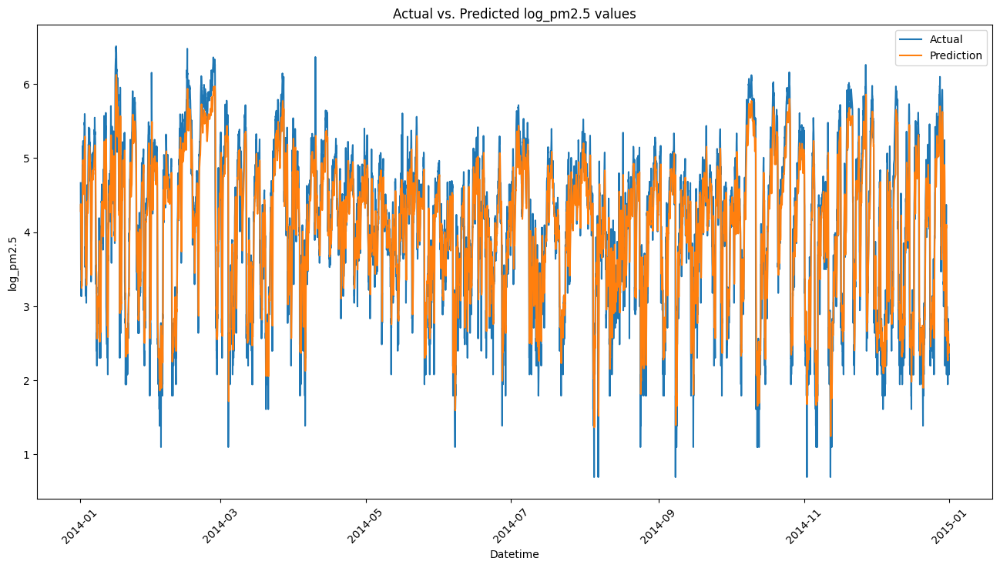

In [176]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extract rain values from test_df
logpm25_actual = test_df[6:]['log_pm2.5'].values
pred_1d = []
for pred in prediction_cnn:
    pred_arr = np.array(pred)
    pred_mean = pred_arr.mean()
    pred_1d.append(pred_mean)

print(pred_1d)

# Plotting the actual and predicted values
plt.figure(figsize=(16, 8))
plt.plot(test_df[6:].index, logpm25_actual, label='Actual')
plt.plot(test_df[6:].index, pred_1d, label='Prediction')
plt.xlabel('Datetime')
plt.ylabel('log_pm2.5')
plt.title('Actual vs. Predicted log_pm2.5 values')
plt.legend()
plt.xticks(rotation=45)
plt.show()

In [177]:
scores_1d = {}

# Calculate Mean Squared Error (MSE)
mse = metrics.mean_squared_error(logpm25_actual, pred_1d)
scores_1d['MSE'] = mse

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
scores_1d['RMSE'] = rmse

# Calculate Mean Absolute Error (MAE)
mae = metrics.mean_absolute_error(logpm25_actual, pred_1d)
scores_1d['MAE'] = mae

# Calculate R-squared (R^2) score
r2_score = metrics.r2_score(logpm25_actual, pred_1d)
scores_1d['R-squared'] = r2_score

# Time taken
scores_1d['Time'] = execution_time_1d

# Print the evaluation dictionary
print("Evaluation Metrics:")
for metric, value in scores_1d.items():
    print(f"{metric}: {value}")


Evaluation Metrics:
MSE: 0.16836505643011637
RMSE: 0.4103231122300039
MAE: 0.3012523719836179
R-squared: 0.8519280894101515
Time: 50.62677717208862


In [178]:
logpm25_metrics_list['1D_CNN'] = scores_1d

#### Time results

In [179]:
execution_times = {
    'HMM': execution_time_hmm,
    'LSTM': execution_time_lstm,
    'ARIMA': execution_time_arima,
    '1D-CNN': execution_time_1d
}

print("Execution Time Summary:")
for model, timing in execution_times.items():
    print(f"{model}: {timing} seconds")

Execution Time Summary:
HMM: 4.242828130722046 seconds
LSTM: 69.85838484764099 seconds
ARIMA: 2.125771999359131 seconds
1D-CNN: 50.62677717208862 seconds


#### 5. Overall results

In [180]:
print(logpm25_metrics_list)

{'HMM': {'MSE': 1.880498027242811, 'RMSE': 1.3713125199030347, 'MAE': 1.0955330992504384, 'R-squared': -0.6547942093675965, 'Time': 4.242828130722046}, 'LSTM': {'MSE': 0.07550056862617442, 'RMSE': 0.27477366800000036, 'MAE': 0.1746872585622811, 'R-squared': 0.9335995622598925, 'Time': 69.85838484764099}, '1D_CNN': {'MSE': 0.16836505643011637, 'RMSE': 0.4103231122300039, 'MAE': 0.3012523719836179, 'R-squared': 0.8519280894101515, 'Time': 50.62677717208862}}


HMM
{'RMSE': 1.3713125199030347, 'MAE': 1.0955330992504384, 'R-squared': -0.6547942093675965, 'Time': 4.242828130722046}
LSTM
{'RMSE': 0.27477366800000036, 'MAE': 0.1746872585622811, 'R-squared': 0.9335995622598925, 'Time': 69.85838484764099}
1D_CNN
{'RMSE': 0.4103231122300039, 'MAE': 0.3012523719836179, 'R-squared': 0.8519280894101515, 'Time': 50.62677717208862}


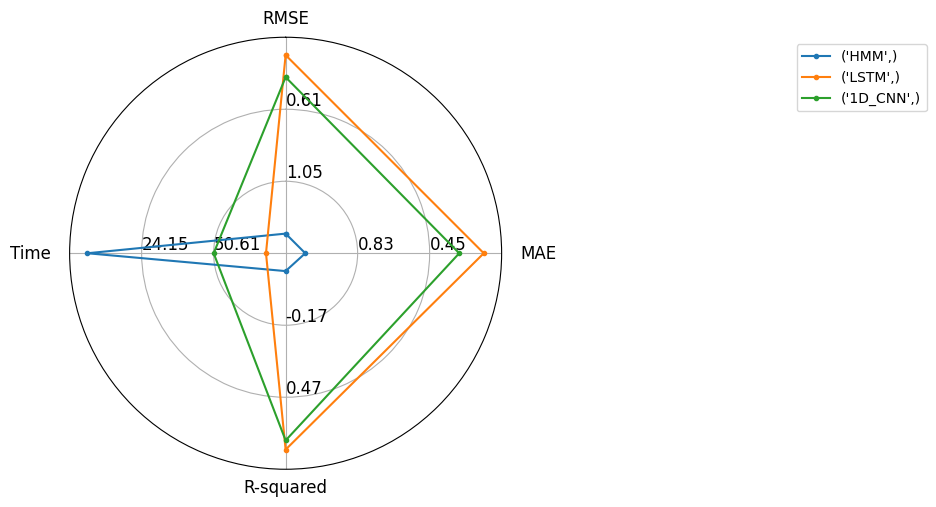

In [181]:
model_names = []
metrics_list = []
plot_logpm25 = logpm25_metrics_list

for model_name, metric in plot_logpm25.items():
        model_names.append(model_name)
        if 'MSE' in metric:
            del metric['MSE']
        metrics_list.append(metric)
        print(model_name)
        print(metric)
        

plot = radar_plot(data=metrics_list, model_names=model_names,invert_range=['Time','RMSE','MAE'])
# plot = radar_plot(data=metrics, model_names=model_names)

# Set the origin of each plot to 0 by modifying the axis limits
#for ax in plot.axes:
    #ax.set_ylim(bottom=0)

# plt.title('Encoder-only model multiclass classification performance comparison')
plt.show()